In [45]:
import math
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']=['SimHei'] #用来正常显示中文标签
plt.rcParams['axes.unicode_minus']=False #用来正常显示负号
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split,cross_validate,GridSearchCV
import lightgbm as lgb
import seaborn as sns

In [46]:
xlsx_file = pd.ExcelFile('./2021-2022_O3&气象五参.xlsx')
sheet_names = xlsx_file.sheet_names
data = pd.DataFrame()

# datat= pd.read_excel('./预测数据.xlsx')
# datat

#得到2021和2022年的数据
df1 = xlsx_file.parse(sheet_names[0])
df2 = xlsx_file.parse(sheet_names[1])
data = pd.concat([df1,df2])
data = data.reset_index(drop=True)
# datat.info()
columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')

def daypart(hour):
    if hour in [2,3,4,5]:
        return "dawn"
    elif hour in [6,7,8,9]:
        return "morning"
    elif hour in [10,11,12,13]:
        return "noon"
    elif hour in [14,15,16,17]:
        return "afternoon"
    elif hour in [18,19,20,21]:
        return "evening"
    else: return "midnight"
data['C1705_DATETIME'] = pd.to_datetime(data['C1705_DATETIME'])
data['year'] = data.C1705_DATETIME.dt.year
data['month'] = data.C1705_DATETIME.dt.month
data['day'] = data.C1705_DATETIME.dt.day
data['hour'] = data.C1705_DATETIME.dt.hour
# data['weekday'] = data.C1705_DATETIME.dt.weekday
# data['day_of_Week'] = data.C1705_DATETIME.dt.dayofweek
to_one_hot = data['C1705_DATETIME'].dt.day_name()
# second: one hot encode to 7 columns
days = pd.get_dummies(to_one_hot)
#display data
for column in days.columns:
    data[column] = days[column]
    
raw_dayparts = data['hour'].apply(daypart)
# one hot encoding
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    data[column] = dayparts[column]


mask = data['O3VAL'] < 0  # 创建一个布尔掩码，表示负值
data.loc[mask, 'O3VAL'] *= -1  # 将负值取反
data1 = data[data['C0007_PNAME']=='八大关街道']
data2 = data[data['C0007_PNAME']=='北宅街道']
data3 = data[data['C0007_PNAME']=='登州路街道']
data4 = data[data['C0007_PNAME']=='上马街道']
data5 = data[data['C0007_PNAME']=='兴城路街道']


import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import STL
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# data2['O3VAL'] = scaler.fit_transform(np.array(data2['O3VAL'].values.reshape(-1, 1)))
data2['QIWENVAL'] = scaler.fit_transform(np.array(data2['QIWENVAL'].values.reshape(-1, 1)))
data2['FSVAL'] = scaler.fit_transform(np.array(data2['FSVAL'].values.reshape(-1, 1)))
data2['FXVAL'] = scaler.fit_transform(np.array(data2['FXVAL'].values.reshape(-1, 1)))
data2['SHIDUVAL'] = scaler.fit_transform(np.array(data2['SHIDUVAL'].values.reshape(-1, 1)))
data2['YALIVAL'] = scaler.fit_transform(np.array(data2['YALIVAL'].values.reshape(-1, 1)))


C:\Users\lenovo\AppData\Local\Temp\ipykernel_28380\494166953.py:68: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['QIWENVAL'] = scaler.fit_transform(np.array(data2['QIWENVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_28380\494166953.py:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2['FSVAL'] = scaler.fit_transform(np.array(data2['FSVAL'].values.reshape(-1, 1)))
C:\Users\lenovo\AppData\Local\Temp\ipykernel_28380\494166953.py:70: SettingWithCopyWarning: 
A value is tr

In [47]:
datat= pd.read_excel('7.30预测.xls')
datat = datat[datat['C0007_PNAME'] == '北宅街道']
datat = datat.rename(columns={"TO_CHAR(H.C1705_DATETIME,'YYYY": '日期'})

zhihou = 28*24+1

datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL
2149,13763,北宅街道,2024-04-01 00,7.270,1.257,279.870,72.805,999.913,90.0
2150,13763,北宅街道,2024-04-01 01,7.028,0.983,299.247,75.186,999.947,84.0
2151,13763,北宅街道,2024-04-01 02,6.368,0.653,255.998,78.286,1000.043,57.0
2152,13763,北宅街道,2024-04-01 03,5.668,0.466,189.529,81.688,999.742,33.0
2153,13763,北宅街道,2024-04-01 04,6.107,0.847,289.049,82.825,999.743,58.0
...,...,...,...,...,...,...,...,...,...
4328,13763,北宅街道,2024-06-30 19,26.064,1.016,223.853,72.493,987.620,116.0
4329,13763,北宅街道,2024-06-30 20,24.418,0.748,217.114,74.229,988.083,104.0
4330,13763,北宅街道,2024-06-30 21,23.808,0.898,308.394,73.700,988.214,100.0
4331,13763,北宅街道,2024-06-30 22,23.905,0.815,270.540,74.716,988.772,95.0


In [48]:
datat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2184 entries, 2149 to 4332
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   C0007_SUBSTATION_ID  2184 non-null   int64  
 1   C0007_PNAME          2184 non-null   object 
 2   日期                   2184 non-null   object 
 3   QIWENVAL             2111 non-null   float64
 4   FSVAL                2111 non-null   float64
 5   FXVAL                2165 non-null   float64
 6   SHIDUVAL             2111 non-null   float64
 7   YALIVAL              2111 non-null   float64
 8   O3VAL                2172 non-null   float64
dtypes: float64(6), int64(1), object(2)
memory usage: 170.6+ KB


In [49]:
columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')

In [50]:
datat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2184 entries, 2149 to 4332
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   C0007_SUBSTATION_ID  2184 non-null   int64  
 1   C0007_PNAME          2184 non-null   object 
 2   日期                   2184 non-null   object 
 3   QIWENVAL             2184 non-null   float64
 4   FSVAL                2184 non-null   float64
 5   FXVAL                2184 non-null   float64
 6   SHIDUVAL             2184 non-null   float64
 7   YALIVAL              2184 non-null   float64
 8   O3VAL                2184 non-null   float64
dtypes: float64(6), int64(1), object(2)
memory usage: 170.6+ KB


In [51]:
import os
import pandas as pd
def get_season(month):
    if month in [2, 3, 4]:
        return 1
    elif month in [5, 6, 7, 8]:
        return 2
    elif month in [9, 10, 11]:
        return 3
    elif month in [12, 1]:
        return 4
def calculate_wind_speed(U, V):
    return np.sqrt(U**2 + V**2)   

def calculate_wind_direction(U, V):
    # 确保U和V没有缺失值
    U = np.nan_to_num(U)
    V = np.nan_to_num(V)
    direction = np.arctan2(U, V) * (180 / np.pi)  # 转换为角度
    direction = np.mod(direction + 360, 360)  # 确保风向在0到360度之间
    return direction

folder_path = "./wrfout/"
files = os.listdir(folder_path)
columns_to_convert = ['U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL']
df_list = []
date_format = "%Y-%m-%d_%H_%M_%S"
for file in files:
    # 获取完整路径
    file_path = os.path.join(folder_path, file)
    data = pd.read_csv(file_path, delimiter='\s+', header=None, engine='python',skiprows=1,
                       usecols=[0, 1, 2, 3, 5, 6, 7],
                       names=['日期', '站点', 'U10', 'V10', '气温开尔文', 'YALIVAL', 'SHIDUVAL'])
    data = data[data['站点'] == 'beizhai']
    data['year'] = data['日期'].str[:4].astype(int)
    data['month'] = data['日期'].str[5:7].astype(int)
    data['day'] = data['日期'].str[8:10].astype(int)
    data['hour'] = data['日期'].str[11:13].astype(int)
    for column in columns_to_convert:
        data[column] = pd.to_numeric(data[column], errors='coerce')
        data['FSVAL'] = calculate_wind_speed(data['U10'], data['V10'])
        data['FXVAL'] = calculate_wind_direction(data['U10'], data['V10'])
    data['QIWENVAL'] = data['气温开尔文'] - 273.15
    columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
    for column in columns_to_interpolate:
        if column in data.columns:
            data[column] = data[column].interpolate(method='linear')
    data['日期'] = pd.to_datetime(data['日期'], format=date_format)
    df_list.append(data)

def is_weekend_series(series):
    def is_weekday(date):
        weekday = date.weekday()
        return weekday >= 5

    return series.apply(is_weekday)

df_list 

[                     日期       站点   U10   V10   气温开尔文  YALIVAL  SHIDUVAL  year  \
 1   2024-05-09 00:00:00  beizhai -2.40  2.38  285.37  1020.42     48.95  2024   
 6   2024-05-09 01:00:00  beizhai -2.03  2.58  284.69  1020.77     58.02  2024   
 11  2024-05-09 02:00:00  beizhai -1.69  2.48  284.20  1020.68     61.90  2024   
 16  2024-05-09 03:00:00  beizhai -0.91  2.38  284.04  1020.76     59.94  2024   
 21  2024-05-09 04:00:00  beizhai -0.96  2.53  283.83  1021.12     58.01  2024   
 ..                  ...      ...   ...   ...     ...      ...       ...   ...   
 936 2024-05-16 19:00:00  beizhai -5.23  6.74  287.53  1018.78     77.92  2024   
 941 2024-05-16 20:00:00  beizhai -5.04  7.28  287.58  1018.78     73.03  2024   
 946 2024-05-16 21:00:00  beizhai -4.08  7.11  287.05  1019.20     78.96  2024   
 951 2024-05-16 22:00:00  beizhai -3.80  7.09  286.64  1019.49     88.54  2024   
 956 2024-05-16 23:00:00  beizhai -4.24  6.58  286.60  1019.59     94.91  2024   
 
      month  d

In [52]:
from datetime import date
from datetime import date 
from sklearn.compose import ColumnTransformer
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
import numpy as np
import matplotlib.pyplot as plt
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

def sin_transformer(period):
    return FunctionTransformer(lambda x: np.sin(2 * np.pi * x / period))

def cos_transformer(period):
    return FunctionTransformer(lambda x: np.cos(2 * np.pi * x / period))

cyclic_cossin_transformer = ColumnTransformer(
    transformers=[
        ("month_sin", sin_transformer(12), ["month"]),
        ("month_cos", cos_transformer(12), ["month"]),
        ("day_sin", sin_transformer(7), ["day"]),
        ("day_cos", cos_transformer(7), ["day"]),
        ("hour_sin", sin_transformer(24), ["hour"]),
        ("hour_cos", cos_transformer(24), ["hour"]),
    ],
    remainder=MinMaxScaler(),
)
o3_columns = ['O3VAL_' + str(i) for i in range(1,28*24+1)]
holidays_2024 = [
    "2024-01-01 00:00:00",  # 元旦
    "2024-02-10 00:00:00",  # 除夕
    "2024-02-11 00:00:00",  # 春节（初一）
    "2024-02-12 00:00:00",  # 春节（初二）
    "2024-02-13 00:00:00",  # 春节（初三）
    "2024-02-14 00:00:00",  # 春节（初四）
    "2024-02-15 00:00:00",  # 春节（初五）
    "2024-02-16 00:00:00",  # 春节（初六）
    "2024-04-04 00:00:00",  # 清明节
    "2024-05-01 00:00:00",  # 劳动节
    "2024-06-10 00:00:00",  # 端午节
    "2024-09-17 00:00:00",  # 中秋节
    "2024-10-01 00:00:00",  # 国庆节
    "2024-10-02 00:00:00",  # 国庆节
    "2024-10-03 00:00:00",  # 国庆节
    "2024-10-04 00:00:00",  # 国庆节
    "2024-10-05 00:00:00",  # 国庆节
    "2024-10-06 00:00:00",  # 国庆节
    "2024-10-07 00:00:00"   # 国庆节
]
datat['日期'] = pd.to_datetime(datat['日期'])
datat['year'] = datat.日期.dt.year
datat['month'] = datat.日期.dt.month
datat['day'] = datat.日期.dt.day
datat['hour'] = datat.日期.dt.hour

X_transformed = cyclic_cossin_transformer.fit_transform(datat[['month','day','hour']])
datat = datat.reset_index(drop=True)
X_transformed_df = pd.DataFrame(X_transformed, columns=['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos'])
X_transformed_df = X_transformed_df.reset_index(drop=True)
datat = pd.concat([datat, X_transformed_df], axis=1)

datat['quarter']=datat['日期'].dt.quarter
datat['hour_section'] = (datat['hour'] // 6)
datat['diff'] = datat['日期'] - pd.Timestamp('2024-01-01')
datat['diff_hours'] = datat['diff'].values.astype("timedelta64[h]").astype('int')


datat['is_weekend'] = is_weekend_series(datat.日期)
datat['day_of_year'] = datat.日期.dt.dayofyear
datat['day_of_week'] = datat.日期.dt.dayofweek
datat['week_of_year'] = datat.日期.dt.isocalendar().week
datat['is_year_start']    = datat['日期'].dt.is_year_start
datat['is_year_end']    = datat['日期'].dt.is_year_end
datat['is_quarter_start'] = datat['日期'].dt.is_quarter_start 
datat['is_quarter_end'] = datat['日期'].dt.is_quarter_end
datat['is_month_start']   = datat['日期'].dt.is_month_start 
datat['is_month_end']     = datat['日期'].dt.is_month_end
datat['day_to_year_start'] = (datat['日期'] - pd.to_datetime(datat['日期'].dt.year, format='%Y')) / pd.Timedelta(days=1)
datat['is_holiday'] = datat['日期'].apply(lambda x: 1 if x in holidays_2024 else 0)
day_of_week = datat['日期'].dt.dayofweek
datat['day_to_weekend'] = (6 - day_of_week) % 7 
# datat1['O3_roll_mean_24'] = datat1['O3VAL'].rolling(window=24).mean()
# datat1['O3_roll_max_24'] = datat1['O3VAL'].rolling(window=24).max()
# datat1['O3_roll_min_24'] = datat1['O3VAL'].rolling(window=24).min()


columns_to_interpolate = ['O3VAL', 'QIWENVAL', 'FSVAL', 'FXVAL', 'SHIDUVAL', 'YALIVAL']
for column in columns_to_interpolate:
    if column in datat.columns:
        datat[column] = datat[column].interpolate(method='linear')


to_one_hot1 = datat['日期'].dt.day_name()
days1 = pd.get_dummies(to_one_hot1)
for column in days1.columns:
    datat[column] = days[column]
    
raw_dayparts = datat['hour'].apply(daypart)
dayparts = pd.get_dummies(raw_dayparts)
for column in dayparts.columns:
    datat[column] = dayparts[column]
datat['Trend'] = 0
datat['Seasonal'] = 0
# datat['O3VAL'] = np.sqrt(datat['O3VAL'])
# datat['O3_roll_mean_24'] = datat['O3VAL'].rolling(window=24).mean()
# datat['O3_roll_max_24'] = datat['O3VAL'].rolling(window=24).max()
# datat['O3_roll_min_24'] = datat['O3VAL'].rolling(window=24).min()
num = 0


In [53]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,Tuesday,Wednesday,afternoon,dawn,evening,midnight,morning,noon,Trend,Seasonal
0,13763,北宅街道,2024-04-01 00:00:00,7.270,1.257,279.870,72.805,999.913,90.0,2024,...,False,False,False,False,False,True,False,False,0,0
1,13763,北宅街道,2024-04-01 01:00:00,7.028,0.983,299.247,75.186,999.947,84.0,2024,...,False,False,False,False,False,True,False,False,0,0
2,13763,北宅街道,2024-04-01 02:00:00,6.368,0.653,255.998,78.286,1000.043,57.0,2024,...,False,False,False,True,False,False,False,False,0,0
3,13763,北宅街道,2024-04-01 03:00:00,5.668,0.466,189.529,81.688,999.742,33.0,2024,...,False,False,False,True,False,False,False,False,0,0
4,13763,北宅街道,2024-04-01 04:00:00,6.107,0.847,289.049,82.825,999.743,58.0,2024,...,False,False,False,True,False,False,False,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13763,北宅街道,2024-06-30 19:00:00,26.064,1.016,223.853,72.493,987.620,116.0,2024,...,False,False,False,False,True,False,False,False,0,0
2180,13763,北宅街道,2024-06-30 20:00:00,24.418,0.748,217.114,74.229,988.083,104.0,2024,...,False,False,False,False,True,False,False,False,0,0
2181,13763,北宅街道,2024-06-30 21:00:00,23.808,0.898,308.394,73.700,988.214,100.0,2024,...,False,False,False,False,True,False,False,False,0,0
2182,13763,北宅街道,2024-06-30 22:00:00,23.905,0.815,270.540,74.716,988.772,95.0,2024,...,False,False,False,False,False,True,False,False,0,0


In [54]:
datat = datat.dropna(subset=['C0007_SUBSTATION_ID'])

In [55]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,Tuesday,Wednesday,afternoon,dawn,evening,midnight,morning,noon,Trend,Seasonal
0,13763,北宅街道,2024-04-01 00:00:00,7.270,1.257,279.870,72.805,999.913,90.0,2024,...,False,False,False,False,False,True,False,False,0,0
1,13763,北宅街道,2024-04-01 01:00:00,7.028,0.983,299.247,75.186,999.947,84.0,2024,...,False,False,False,False,False,True,False,False,0,0
2,13763,北宅街道,2024-04-01 02:00:00,6.368,0.653,255.998,78.286,1000.043,57.0,2024,...,False,False,False,True,False,False,False,False,0,0
3,13763,北宅街道,2024-04-01 03:00:00,5.668,0.466,189.529,81.688,999.742,33.0,2024,...,False,False,False,True,False,False,False,False,0,0
4,13763,北宅街道,2024-04-01 04:00:00,6.107,0.847,289.049,82.825,999.743,58.0,2024,...,False,False,False,True,False,False,False,False,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13763,北宅街道,2024-06-30 19:00:00,26.064,1.016,223.853,72.493,987.620,116.0,2024,...,False,False,False,False,True,False,False,False,0,0
2180,13763,北宅街道,2024-06-30 20:00:00,24.418,0.748,217.114,74.229,988.083,104.0,2024,...,False,False,False,False,True,False,False,False,0,0
2181,13763,北宅街道,2024-06-30 21:00:00,23.808,0.898,308.394,73.700,988.214,100.0,2024,...,False,False,False,False,True,False,False,False,0,0
2182,13763,北宅街道,2024-06-30 22:00:00,23.905,0.815,270.540,74.716,988.772,95.0,2024,...,False,False,False,False,False,True,False,False,0,0


In [56]:
def add_columns(df):
    for i in range(1, 28*24+1):  # Loop through 1 to 24
        new_col_name = f"O3VAL_{i}"  # New column name based on index
        df[new_col_name] = df['O3VAL'].shift(i)
    # 结束之后
    # df.dropna(axis=0,
    #       how='any',
    #       subset=None,
    #       inplace=True)
    # for i in range(2, 7*24+1):
    #     old_col_name = f"O3VAL_{i-1}"
    #     cur_col_name = f"O3VAL_{i}"
    #     df[cur_col_name] = df[old_col_name] + df[cur_col_name]

    # sum = 0
    # label_sum = 1
    # for i in range(7*24 + 1, 28*24 + 1):
    #     # 构建列名
    #     col_name = f"WEEK_O3VAL_{label_sum}"
    #     del_col_name = f"O3VAL_{i}"
    #     fur_col_name = f"O3VAL_{i + 1}"
    #     if i == 7 * 24 + 7*24+1 or i == 7 * 24 + 14*24+1 or i == 7 * 24 + 21*24:
    #         del_col_name = f"WEEK_O3VAL_{label_sum -1}"
    #     # 累加本周的值
    #     if fur_col_name in df.columns:
    #         df[fur_col_name] = df[del_col_name] + df[fur_col_name]
    #     else:
    #         df[col_name] = df[del_col_name]
    #     del_col_name = f"O3VAL_{i}"
    #     # 计算累加和
    #     sum += 1
        
    #     # 如果累加到一周 (7 * 24 个时间步)
    #     if sum == 7 * 24:
    #         # 构建新特征列
    #         df[col_name] = df[del_col_name]
    #         # 重置累加器
    #         sum = 0
    #         label_sum += 1
    #     df.drop(del_col_name, axis=1, inplace=True)



# Call the function to add columns
add_columns(datat)
datat.dropna(axis=0,
          how='any',
          subset=None,
          inplace=True)
# datat['max_O3'] = datat[o3_columns].max(axis=1)
# datat['min_O3'] = datat[o3_columns].min(axis=1)
# datat['avg_O3'] = datat[o3_columns].mean(axis=1)
# datat['median_O3'] = datat[o3_columns].median(axis=1)
# datat['stddev_O3'] = datat[o3_columns].std(axis=1)

C:\Users\lenovo\AppData\Local\Temp\ipykernel_28380\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_28380\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[new_col_name] = df['O3VAL'].shift(i)
C:\Users\lenovo\AppData\Local\Temp\ipykernel_28380\568507486.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joini

In [57]:
datat

,C0007_SUBSTATION_ID,C0007_PNAME,日期,QIWENVAL,FSVAL,FXVAL,SHIDUVAL,YALIVAL,O3VAL,year,...,O3VAL_663,O3VAL_664,O3VAL_665,O3VAL_666,O3VAL_667,O3VAL_668,O3VAL_669,O3VAL_670,O3VAL_671,O3VAL_672
672,13763,北宅街道,2024-04-29 00:00:00,14.228,0.878,94.501,69.971,999.874,27.0,2024,...,115.0,93.0,23.0,83.0,84.0,58.0,33.0,57.0,84.0,90.0
673,13763,北宅街道,2024-04-29 01:00:00,14.353,1.192,97.553,66.041,999.646,35.0,2024,...,117.0,115.0,93.0,23.0,83.0,84.0,58.0,33.0,57.0,84.0
674,13763,北宅街道,2024-04-29 02:00:00,13.274,0.971,101.723,70.234,999.065,25.0,2024,...,120.0,117.0,115.0,93.0,23.0,83.0,84.0,58.0,33.0,57.0
675,13763,北宅街道,2024-04-29 03:00:00,13.033,0.762,180.999,65.422,998.326,31.0,2024,...,128.0,120.0,117.0,115.0,93.0,23.0,83.0,84.0,58.0,33.0
676,13763,北宅街道,2024-04-29 04:00:00,11.591,0.538,161.489,73.365,998.323,18.0,2024,...,139.0,128.0,120.0,117.0,115.0,93.0,23.0,83.0,84.0,58.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2179,13763,北宅街道,2024-06-30 19:00:00,26.064,1.016,223.853,72.493,987.620,116.0,2024,...,220.0,197.0,144.0,139.0,146.0,149.0,169.0,167.0,169.0,192.0
2180,13763,北宅街道,2024-06-30 20:00:00,24.418,0.748,217.114,74.229,988.083,104.0,2024,...,216.0,220.0,197.0,144.0,139.0,146.0,149.0,169.0,167.0,169.0
2181,13763,北宅街道,2024-06-30 21:00:00,23.808,0.898,308.394,73.700,988.214,100.0,2024,...,203.0,216.0,220.0,197.0,144.0,139.0,146.0,149.0,169.0,167.0
2182,13763,北宅街道,2024-06-30 22:00:00,23.905,0.815,270.540,74.716,988.772,95.0,2024,...,181.0,203.0,216.0,220.0,197.0,144.0,139.0,146.0,149.0,169.0


In [58]:
# Merge the DataFrames on the date
# pd.set_option('display.max_rows', None)  # 取消行数限制
# pd.set_option('display.max_columns', None)  # 取消列数限制
sta_data = pd.read_csv('sta.csv')
day_time_columns = ['dawn','morning','noon','afternoon','evening','midnight']
which_day = ['month_sin','month_cos','day_sin','day_cos','hour_sin','hour_cos','diff_hours', 'hour_section','quarter','is_weekend', 'day_of_year', 'day_of_week',  
               'is_year_start', 'is_year_end', 'is_quarter_start', 'is_quarter_end',
               'is_month_start', 'is_month_end', 'day_to_year_start', 'is_holiday', 'day_to_weekend']
windows_columns = ['max_O3','min_O3','avg_O3','median_O3','stddev_O3']
# windows_o3 = ['O3_roll_mean_24','O3_roll_max_24','O3_roll_min_24']
merged_df_list = [] 
X_list = []
y_list = []
for i in range(len(df_list)):
    merged_df = pd.merge_asof(df_list[i], datat[['日期', 'O3VAL','Trend','Seasonal']+o3_columns+which_day], left_on='日期', right_on='日期', direction='nearest')
    # merged_df['O3VAL'] = scaler.fit_transform(np.array(merged_df['O3VAL'].values.reshape(-1, 1)))

    # merged_df['QIWENVAL'] = scaler.fit_transform(np.array(merged_df['QIWENVAL'].values.reshape(-1, 1)))
    # merged_df['FSVAL'] = scaler.fit_transform(np.array(merged_df['FSVAL'].values.reshape(-1, 1)))
    # merged_df['FXVAL'] = scaler.fit_transform(np.array(merged_df['FXVAL'].values.reshape(-1, 1)))
    # merged_df['SHIDUVAL'] = scaler.fit_transform(np.array(merged_df['SHIDUVAL'].values.reshape(-1, 1)))
    # merged_df['YALIVAL'] = scaler.fit_transform(np.array(merged_df['YALIVAL'].values.reshape(-1, 1)))

    # merged_df['O3VAL'] = np.sqrt(merged_df['O3VAL'])
    merged_df_list.append(merged_df)
    X = merged_df[['year', 'month', 'day', 'hour'] +o3_columns+which_day+['QIWENVAL'	,'FSVAL'	,'SHIDUVAL'	,'YALIVAL']]
    y = merged_df['O3VAL']
    X = pd.merge(X , sta_data, on=['month', 'day', 'hour'], how='left')
    # X['max_O3'] = np.sqrt(X['max_O3'])
    # X['min_O3'] = np.sqrt(X['min_O3'])
    # X['avg_O3'] = np.sqrt(X['avg_O3'])
    # X['median_O3'] = np.sqrt(X['median_O3'])
    # X['stddev_O3'] = np.sqrt(X['stddev_O3'])
    X_list.append(X)
    y_list.append(y)
    print(X)


     year  month  day  hour  O3VAL_1  O3VAL_2  O3VAL_3  O3VAL_4  O3VAL_5  \
0    2024      5    9     0    155.0    168.0    145.0    151.0    166.0   
1    2024      5    9     1    158.0    155.0    168.0    145.0    151.0   
2    2024      5    9     2    148.0    158.0    155.0    168.0    145.0   
3    2024      5    9     3    142.0    148.0    158.0    155.0    168.0   
4    2024      5    9     4    133.0    142.0    148.0    158.0    155.0   
..    ...    ...  ...   ...      ...      ...      ...      ...      ...   
187  2024      5   16    19    178.0    178.0    198.0    184.0    168.0   
188  2024      5   16    20    175.0    178.0    178.0    198.0    184.0   
189  2024      5   16    21    162.0    175.0    178.0    178.0    198.0   
190  2024      5   16    22    155.0    162.0    175.0    178.0    178.0   
191  2024      5   16    23    148.0    155.0    162.0    175.0    178.0   

     O3VAL_6  ...  day_to_weekend  QIWENVAL     FSVAL  SHIDUVAL  YALIVAL  \
0      176.

In [59]:
model = lgb.Booster(model_file='lgb_first_attempt2.txt')

In [60]:
y_pred_list = []
import random
for i in range(len(X_list)):
    y_pred = np.array([])
    X_test = X_list[i].values
    for i, x in enumerate(X_test):
        y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
        for j in range(1,min(28*24+1, len(X_test) - i)):  # Loop through 1 to 48
            # if 0.8 < random.random():
                X_test[i+j,3+j]= y_pred[i]
    y_pred_list.append(y_pred)
    # data2['max_O3'] = data1[o3_columns].max(axis=1)
    # data2['min_O3'] = data1[o3_columns].min(axis=1)
    # data1['avg_O3'] = data1[o3_columns].mean(axis=1)
    # data1['median_O3'] = data1[o3_columns].median(axis=1)
    # data1['stddev_O3'] = data1[o3_columns].std(axis=1)
    # y_pred = np.append(y_pred, model.predict(x.reshape(1, -1)))
    # old_sum = 0
    # if i != 0:
    #     if i < 7 * 24 + 5:
    #         old_sum = X_test[i, i-1]
    #     else:
    #         old_sum = X_test[7 * 24 + 5, 7 * 24 + 4]
    # for j in range(1, 7*24+1):
    #     if i + j < 8 * 24:
    #         if j == 1:
    #             X_test[i+j, 4+j] = y_pred[i]
    #         else:
    #             X_test[i+j, 4+j] = X_test[i+j, 4+j] - old_sum + y_pred[i]
    # for j in range(3):
    #     if i + j < 8 * 24:
    #         X_test[i+j, 173 +j] = X_test[i+j, 173 +j] - old_sum +  y_pred[i]

    
    

    # for j in range(1,min(171, len(X_test) - i)): # Loop through 1 to 48
    #     X_test[i+j, 4+j] = y_pred[i] 


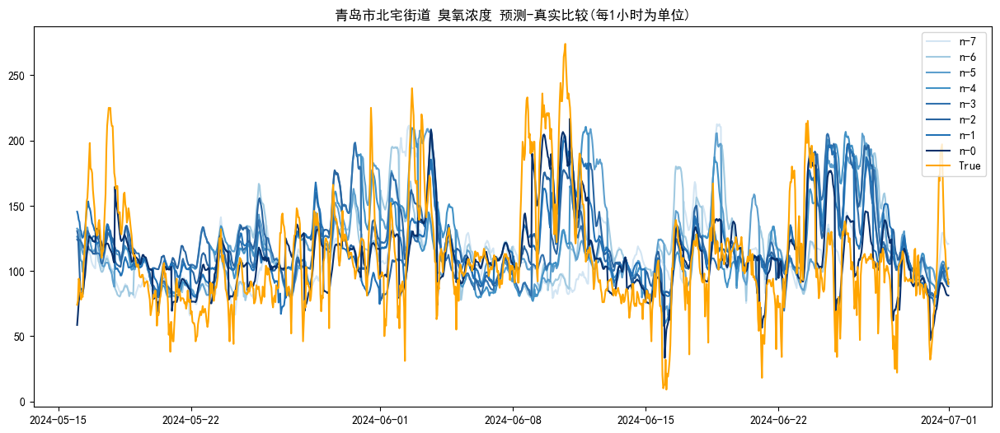

n-7 MASE: 47.441869449608404
n-7 R2: -0.2655760458888017
n-6 MASE: 49.34060188839419
n-6 R2: -0.3689057380902683
n-5 MASE: 49.97661476928271
n-5 R2: -0.4044242783891756
n-4 MASE: 46.620799949594364
n-4 R2: -0.2221488410495691
n-3 MASE: 42.7010095529656
n-3 R2: -0.025276359720474595
n-2 MASE: 39.70715682455658
n-2 R2: 0.11345202894309137
n-1 MASE: 37.75910601818736
n-1 R2: 0.19830704938007815
n-0 MASE: 29.746763486134807
n-0 R2: 0.5024415584802902


In [61]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
import matplotlib.dates as mdates
from datetime import datetime, timedelta
date_range_list = []
start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
end_date111 = datetime(2024, 6, 30, 23, 0, 0)
true_value_list = []
date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
merged_data = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')

true_value_list = merged_data['O3VAL'].tolist()

start_date = datetime(2024, 5, 16, 0, 0, 0) 
end_date = datetime(2024, 5, 16, 23, 0, 0)
while end_date < datetime(2024, 7, 1, 0, 0, 0):
    date_range = pd.date_range(start=start_date, end=end_date, freq='H')
    date_range_list.append(date_range)
    end_date += timedelta(hours=1)
    start_date = end_date
    end_date += timedelta(days=1)
    end_date -= timedelta(hours=1)

num = 0
colors = [
 '#d3e5f3','#a1cae1', 
    '#5d9fcd', '#4292c6',  '#3171ad',
    '#2864a0', '#2171b5',   '#08306b','orange'
]
true_legend_added = 0 
pred_value_list_7 = np.array([])
pred_value_list_6 = np.array([])
pred_value_list_5 = np.array([])
pred_value_list_4 = np.array([])
pred_value_list_3 = np.array([])
pred_value_list_2 = np.array([])
pred_value_list_1 = np.array([])
pred_value_list_0 = np.array([])

for date_ranges in date_range_list:
    num = 7
    for i in range(len(df_list)):
        is_in_list = df_list[i]['日期'].isin(date_ranges)
        rmse_list = []
        r2_list = []
        if is_in_list.any():
            matching_indices = df_list[i].index[is_in_list].tolist()
            matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
            if num == 7:
                pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 6:
                pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 5:
                pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 4:
                pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 3:
                pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 2:
                pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 1:
                pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            elif num == 0:
                pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
            num-=1



plt.figure(figsize=(15, 6))
plt.title("青岛市北宅街道 臭氧浓度 预测-真实比较(每1小时为单位)")
plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
plt.legend()
plt.show()   


print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))

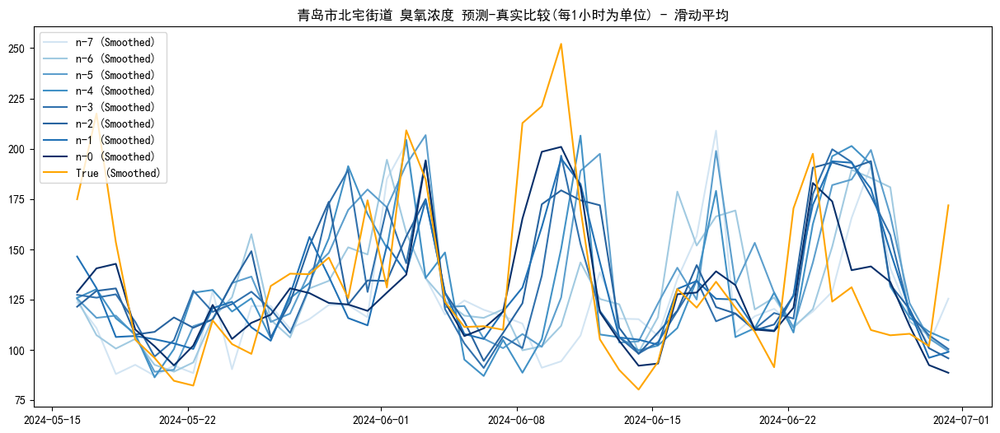

n-7 RMSE: 50.692125388280786
n-7 R2: -0.4816653291002171
n-6 RMSE: 51.38343924683687
n-6 R2: -0.5223533130683913
n-5 RMSE: 49.32932124340214
n-5 R2: -0.4030701885399417
n-4 RMSE: 46.01721205161527
n-4 R2: -0.22098330172216984
n-3 RMSE: 41.79200518426277
n-3 R2: -0.007060439663064688
n-2 RMSE: 38.86088821697635
n-2 R2: 0.12924783456692668
n-1 RMSE: 37.0183030994721
n-1 R2: 0.2098634865023884
n-0 RMSE: 29.024341249393927
n-0 R2: 0.5142711930590895


In [62]:
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 24):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data
# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8

# 对每个预测值列表应用滑动窗口函数
smoothed_pred_value_list_7 = sliding_window_average(pred_value_list_7, window_size)
smoothed_pred_value_list_6 = sliding_window_average(pred_value_list_6, window_size)
smoothed_pred_value_list_5 = sliding_window_average(pred_value_list_5, window_size)
smoothed_pred_value_list_4 = sliding_window_average(pred_value_list_4, window_size)
smoothed_pred_value_list_3 = sliding_window_average(pred_value_list_3, window_size)
smoothed_pred_value_list_2 = sliding_window_average(pred_value_list_2, window_size)
smoothed_pred_value_list_1 = sliding_window_average(pred_value_list_1, window_size)
smoothed_pred_value_list_0 = sliding_window_average(pred_value_list_0, window_size)

# 对真实值列表应用滑动窗口函数
smoothed_true_value_list = sliding_window_average(true_value_list, window_size)

# 再次应用 max_values 函数
interval = 24
smoothed_pred_value_list_7 = max_values(smoothed_pred_value_list_7, interval)
smoothed_pred_value_list_6 = max_values(smoothed_pred_value_list_6, interval)
smoothed_pred_value_list_5 = max_values(smoothed_pred_value_list_5, interval)
smoothed_pred_value_list_4 = max_values(smoothed_pred_value_list_4, interval)
smoothed_pred_value_list_3 = max_values(smoothed_pred_value_list_3, interval)
smoothed_pred_value_list_2 = max_values(smoothed_pred_value_list_2, interval)
smoothed_pred_value_list_1 = max_values(smoothed_pred_value_list_1, interval)
smoothed_pred_value_list_0 = max_values(smoothed_pred_value_list_0, interval)

# 由于 max_values 可能会减少列表长度，我们也需要对 smoothed_true_value_list 应用相同的操作
smoothed_true_value_list = max_values(smoothed_true_value_list, interval)

# 获取用于绘图的时间范围，减去窗口大小 + 1，以匹配滑动平均后的长度
# 并且需要进一步减去由 max_values 函数导致的长度减少
smoothed_date_range111 = date_range111[window_size - 1::interval]

plt.figure(figsize=(15, 6))
plt.title("青岛市北宅街道 臭氧浓度 预测-真实比较(每1小时为单位) - 滑动平均")
plt.plot(smoothed_date_range111, smoothed_pred_value_list_7, color=colors[0], label='n-7 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_6, color=colors[1], label='n-6 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_5, color=colors[2], label='n-5 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_4, color=colors[3], label='n-4 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_3, color=colors[4], label='n-3 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_2, color=colors[5], label='n-2 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_1, color=colors[6], label='n-1 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_pred_value_list_0, color=colors[7], label='n-0 (Smoothed)')
plt.plot(smoothed_date_range111, smoothed_true_value_list, color=colors[-1], label='True (Smoothed)')
plt.legend()
plt.show()

# 计算滑动平均后的性能指标
print('n-7 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_7)))
print('n-7 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_7))
print('n-6 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_6)))
print('n-6 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_6))
print('n-5 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_5)))
print('n-5 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_5))
print('n-4 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_4)))
print('n-4 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_4))
print('n-3 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_3)))
print('n-3 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_3))
print('n-2 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_2)))
print('n-2 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_2))
print('n-1 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_1)))
print('n-1 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_1))
print('n-0 RMSE:', np.sqrt(mean_squared_error(smoothed_true_value_list, smoothed_pred_value_list_0)))
print('n-0 R2:', r2_score(smoothed_true_value_list, smoothed_pred_value_list_0))

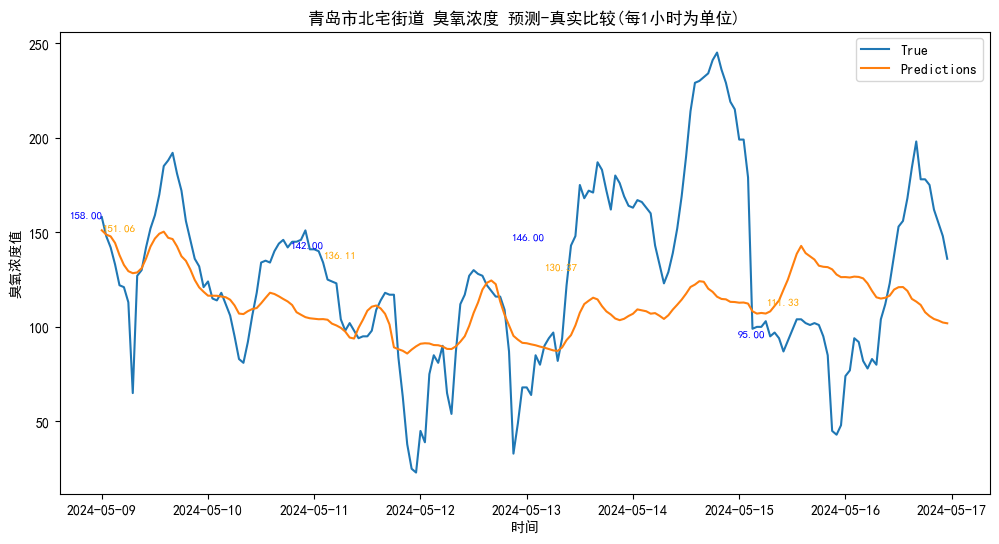

rmse: 45.3392891897138
r2 score: 0.007909164447075345
all
rmse: 45.3392891897138
r2 score: 0.007909164447075345
all-1
rmse: 44.50095046037145
r2 score: 0.07573072744494758
all-2
rmse: 31.500538274692495
r2 score: 0.3086168082875431


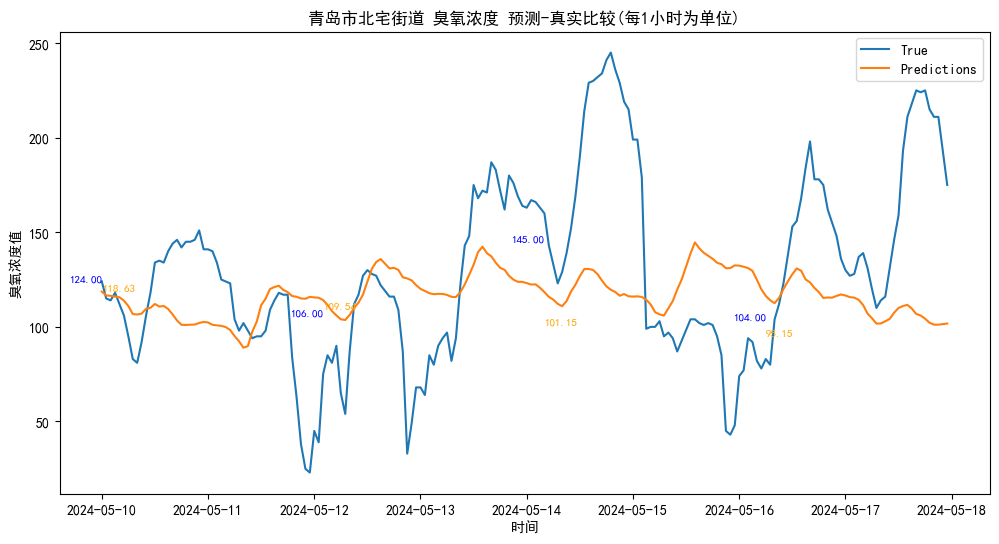

rmse: 50.899759710688244
r2 score: -0.10894188719379838
all
rmse: 50.899759710688244
r2 score: -0.10894188719379838
all-1
rmse: 47.57386445578578
r2 score: 0.013124468191207384
all-2
rmse: 47.373180404347195
r2 score: 0.04883739874575499


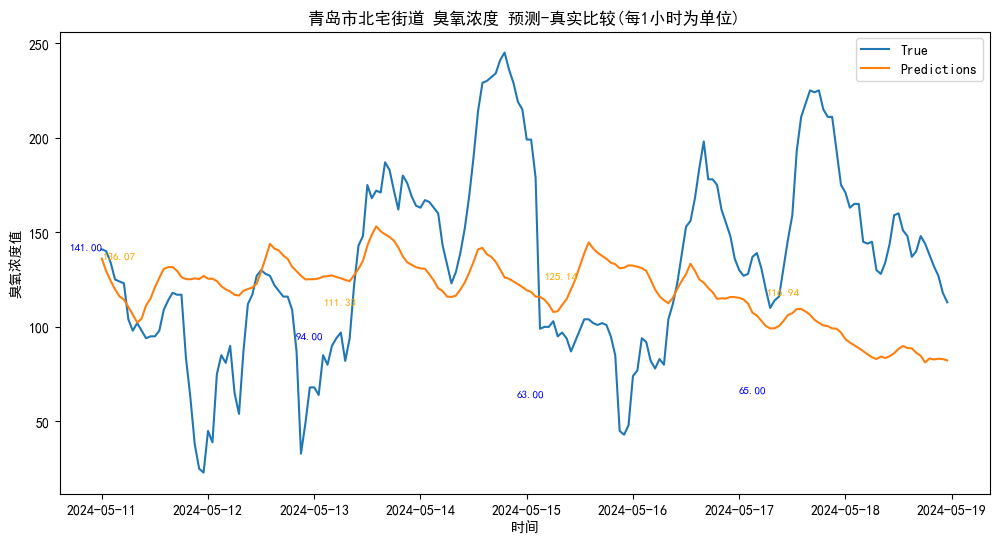

rmse: 53.83824660981978
r2 score: -0.24803017100655733
all
rmse: 53.83824660981978
r2 score: -0.24803017100655733
all-1
rmse: 48.445293604592685
r2 score: 0.05850560651929759
all-2
rmse: 49.60308016836897
r2 score: 0.07628109864318477


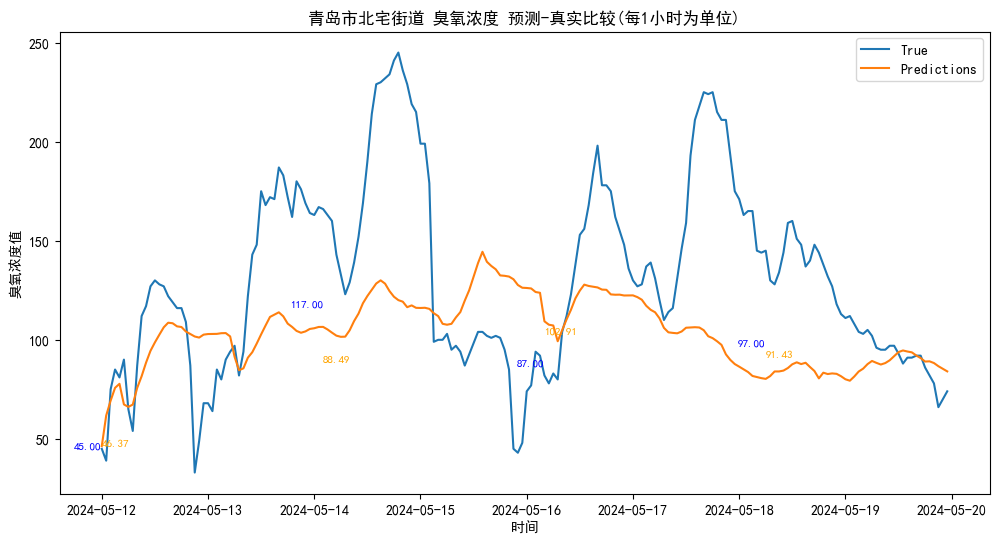

rmse: 53.9596430677759
r2 score: -0.2830746399056008
all
rmse: 53.9596430677759
r2 score: -0.2830746399056008
all-1
rmse: 56.73779231790901
r2 score: -0.2039968581437568
all-2
rmse: 51.81538017225328
r2 score: -0.01972203263041883


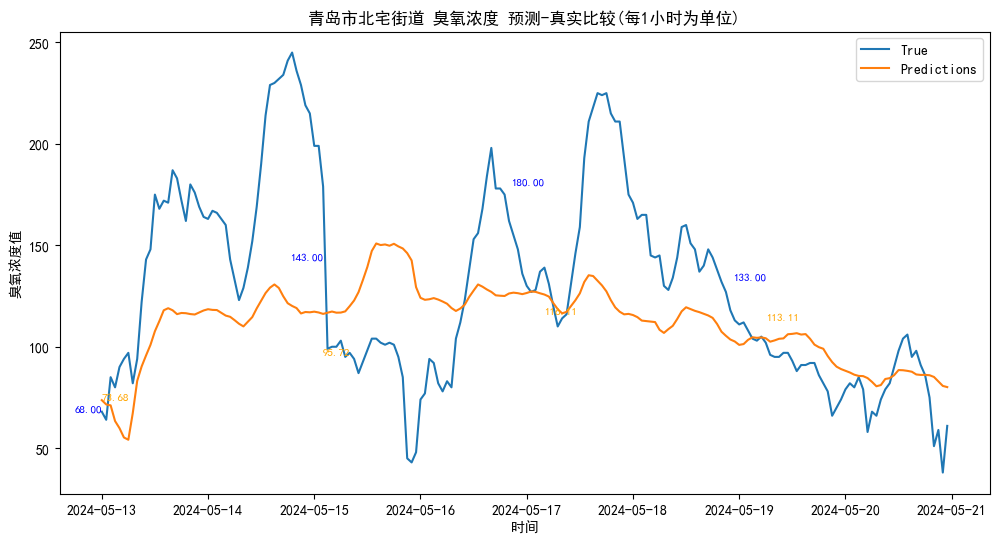

rmse: 46.99688551840009
r2 score: 0.05073367197687595
all
rmse: 46.99688551840009
r2 score: 0.05073367197687595
all-1
rmse: 53.60882738620251
r2 score: -0.33665086951555656
all-2
rmse: 56.776388756782026
r2 score: -0.27104759298047276


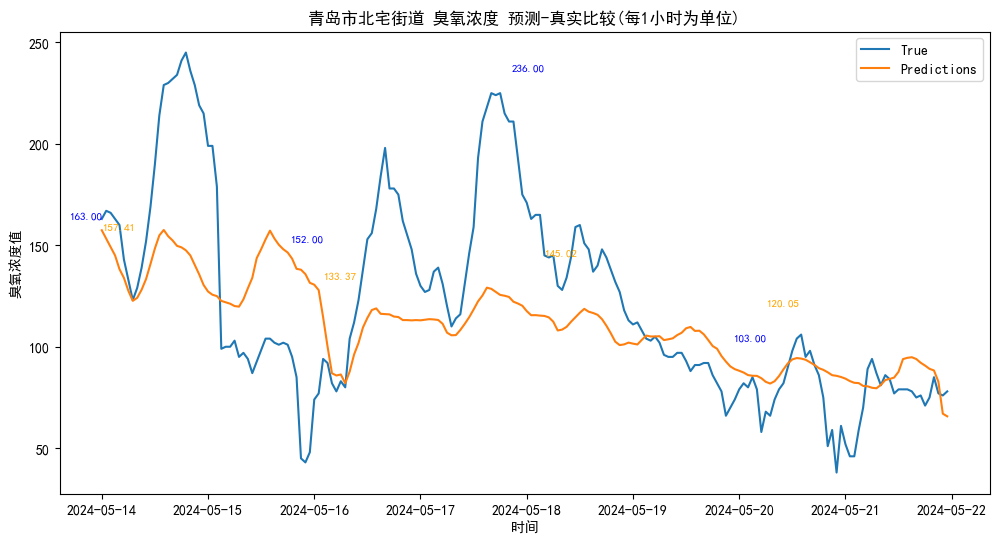

rmse: 41.037060033795214
r2 score: 0.30853700605742174
all
rmse: 41.037060033795214
r2 score: 0.30853700605742174
all-1
rmse: 46.34771004719882
r2 score: 0.04703308376894744
all-2
rmse: 50.40823289500344
r2 score: -0.15544963343530616


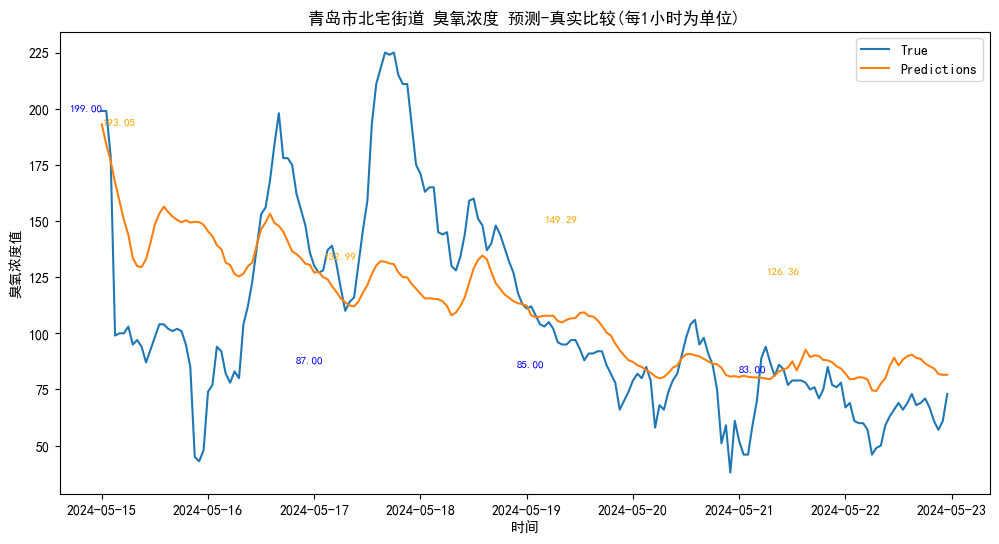

rmse: 35.03108878226984
r2 score: 0.3480385101641318
all
rmse: 35.03108878226984
r2 score: 0.3480385101641318
all-1
rmse: 39.045600463110596
r2 score: 0.16926256549402652
all-2
rmse: 42.21317368163696
r2 score: -0.017635702251177277


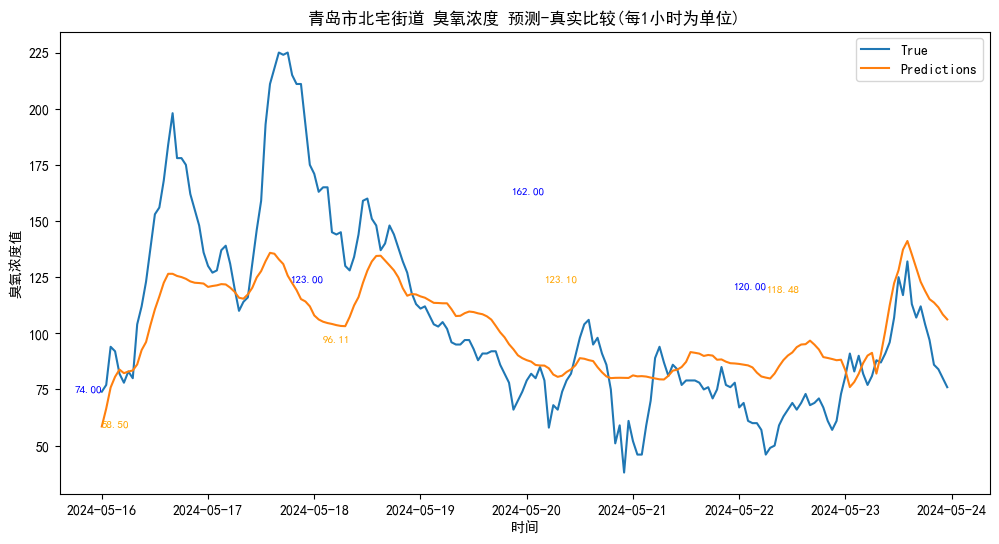

rmse: 30.273590991846604
r2 score: 0.47394296921153434
all
rmse: 30.273590991846604
r2 score: 0.47394296921153434
all-1
rmse: 32.66124432474963
r2 score: 0.4313139763981537
all-2
rmse: 35.05979000908031
r2 score: 0.33449428243448476


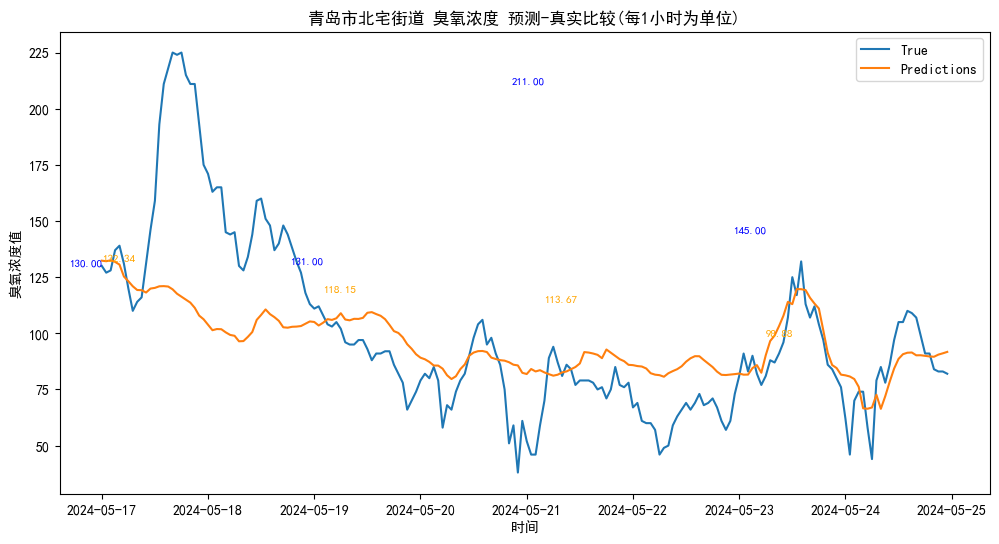

rmse: 30.850031831904033
r2 score: 0.3796208551288506
all
rmse: 30.850031831904033
r2 score: 0.3796208551288506
all-1
rmse: 35.023527337217516
r2 score: 0.3514723754978458
all-2
rmse: 37.05726968665133
r2 score: 0.2659276992205567


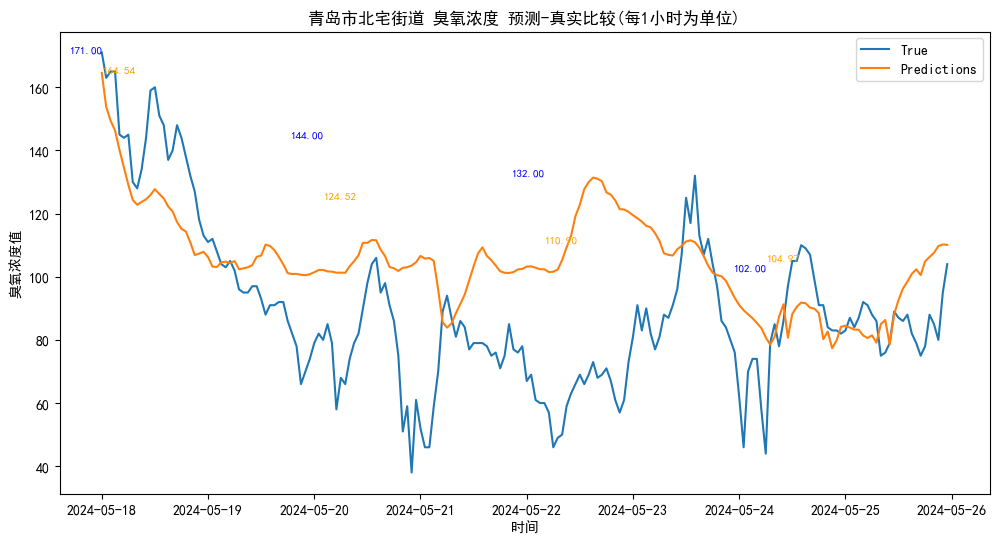

rmse: 27.99316444018445
r2 score: -0.13379508300650622
all
rmse: 27.99316444018445
r2 score: -0.13379508300650622
all-1
rmse: 30.95303320872161
r2 score: -0.13136372636284643
all-2
rmse: 32.597762573263296
r2 score: -0.10135434018167588


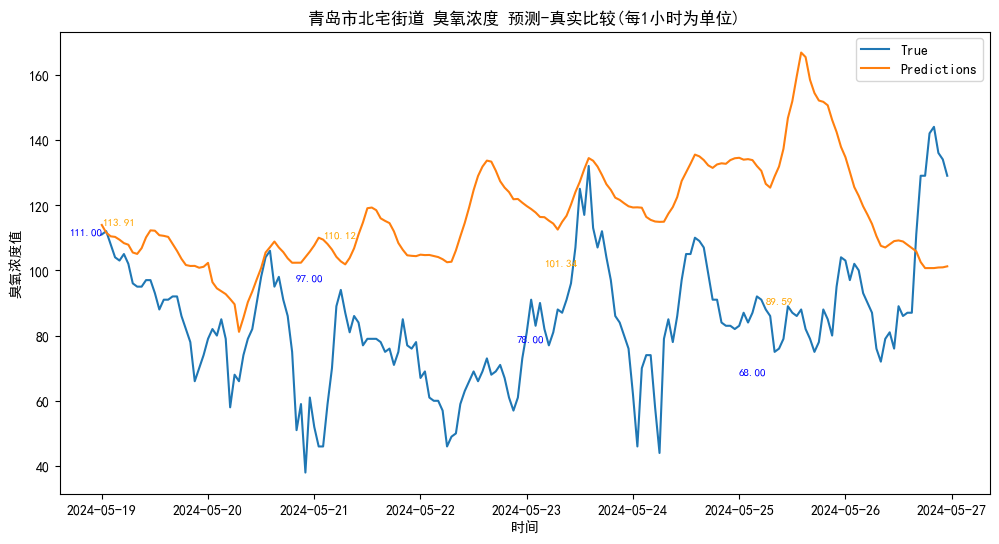

rmse: 39.58972723848751
r2 score: -3.3974167645067768
all
rmse: 39.58972723848751
r2 score: -3.3974167645067768
all-1
rmse: 36.80736277452558
r2 score: -3.2590501396313476
all-2
rmse: 35.102369740144766
r2 score: -2.910430444086006


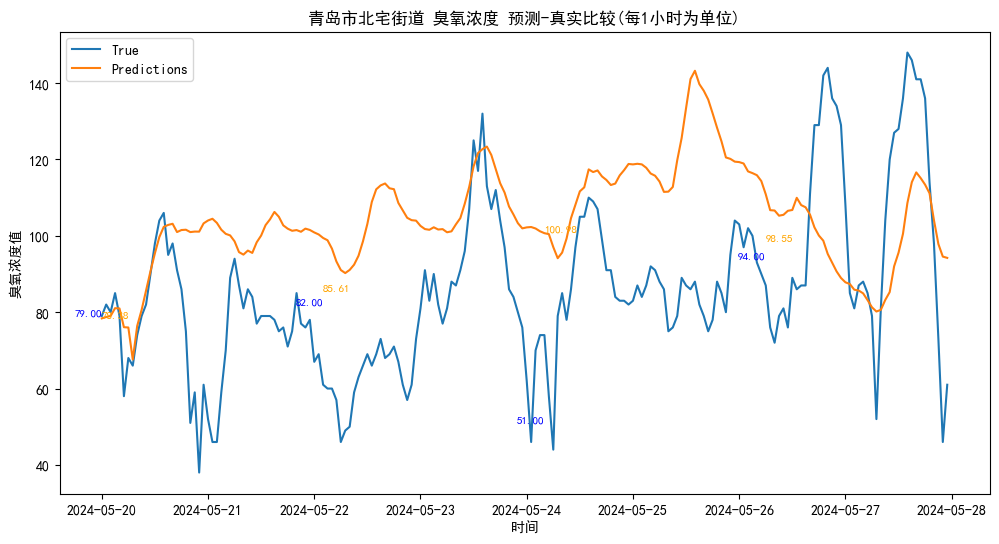

rmse: 29.828542989152805
r2 score: -0.8410514014375086
all
rmse: 29.828542989152805
r2 score: -0.8410514014375086
all-1
rmse: 30.70095165339125
r2 score: -2.364854085680831
all-2
rmse: 28.23505887890652
r2 score: -1.4823273090112958


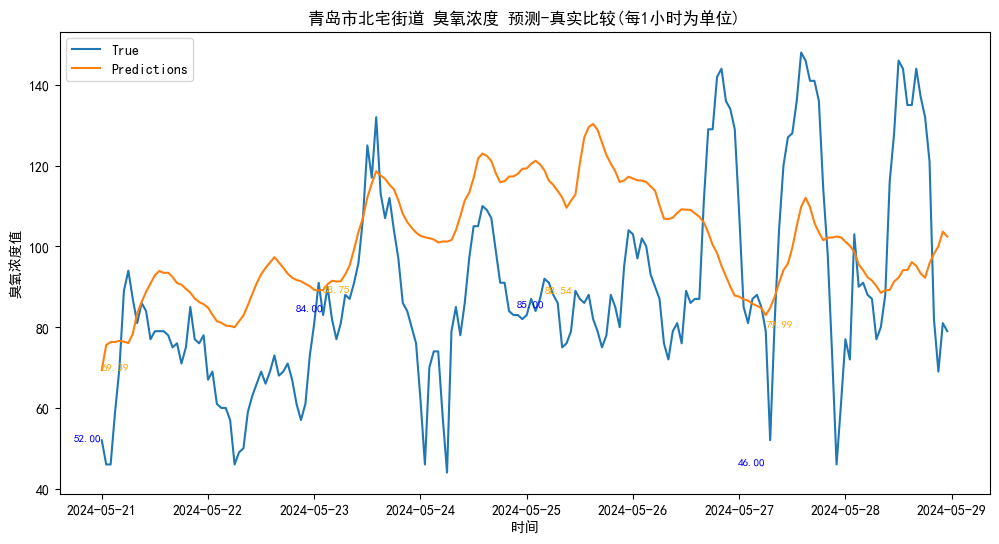

rmse: 26.679488655947225
r2 score: -0.26500218014811217
all
rmse: 26.679488655947225
r2 score: -0.26500218014811217
all-1
rmse: 26.161308283155666
r2 score: -0.7673779714676383
all-2
rmse: 25.504602825104996
r2 score: -1.3223586852441271


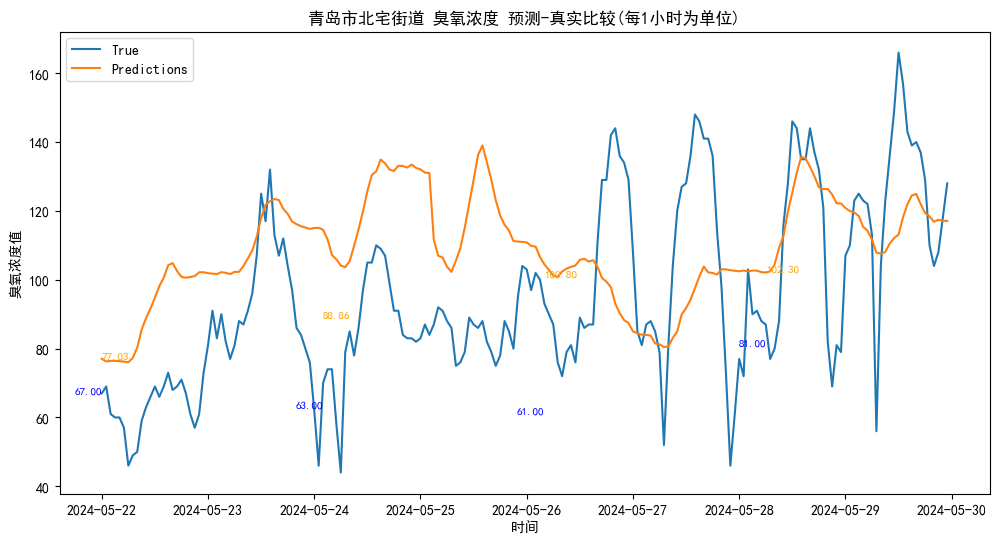

rmse: 29.292996386501347
r2 score: -0.2391973701505794
all
rmse: 29.292996386501347
r2 score: -0.2391973701505794
all-1
rmse: 31.161873009658027
r2 score: -0.8106043693342961
all-2
rmse: 31.315569555938236
r2 score: -1.3647292914966487


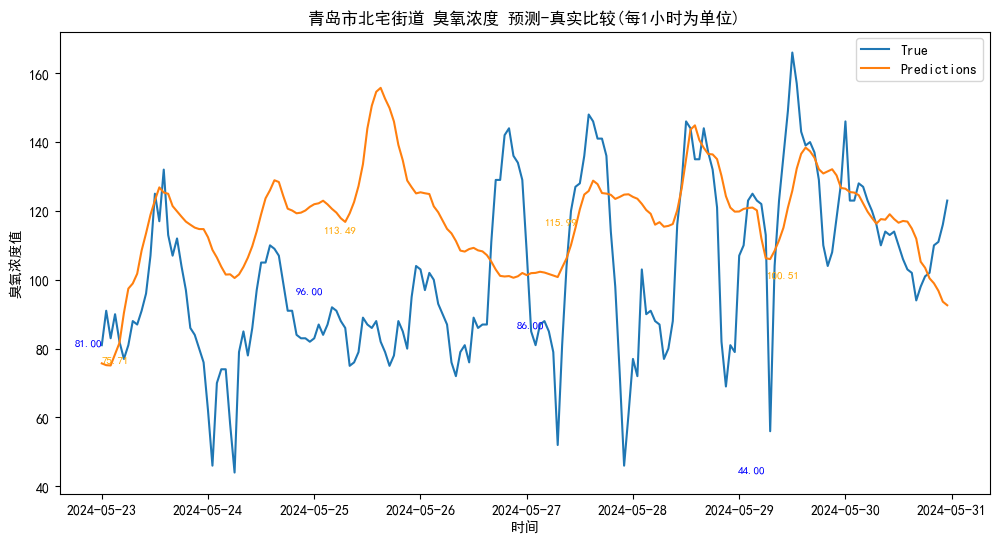

rmse: 29.48558319821323
r2 score: -0.5046331837513398
all
rmse: 29.48558319821323
r2 score: -0.5046331837513398
all-1
rmse: 32.82661948441719
r2 score: -1.0423978008600674
all-2
rmse: 33.39978710797188
r2 score: -1.3509677287267632


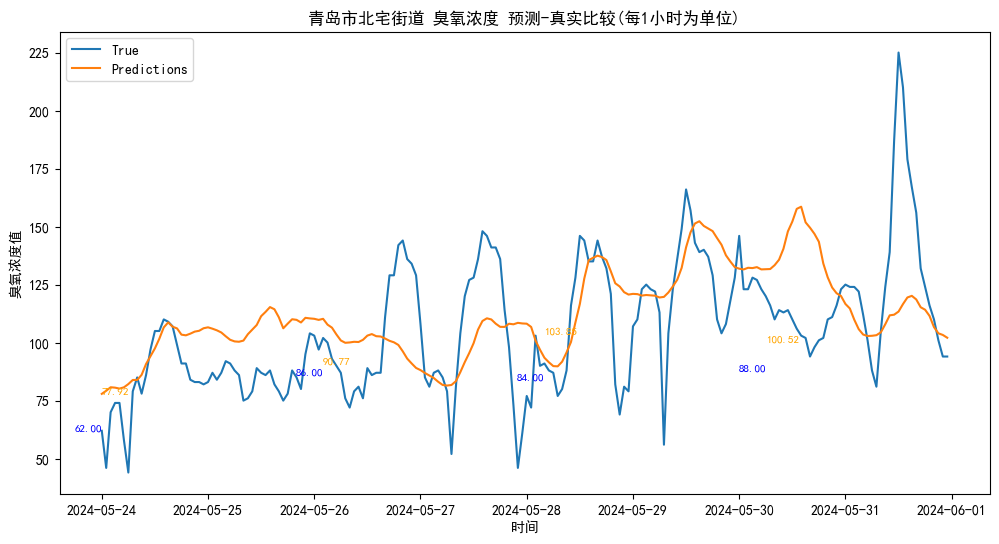

rmse: 26.631391672707196
r2 score: 0.1202646790804427
all
rmse: 26.631391672707196
r2 score: 0.1202646790804427
all-1
rmse: 23.067191462580585
r2 score: 0.21248639982862072
all-2
rmse: 23.460703688027824
r2 score: 0.059790998501140225


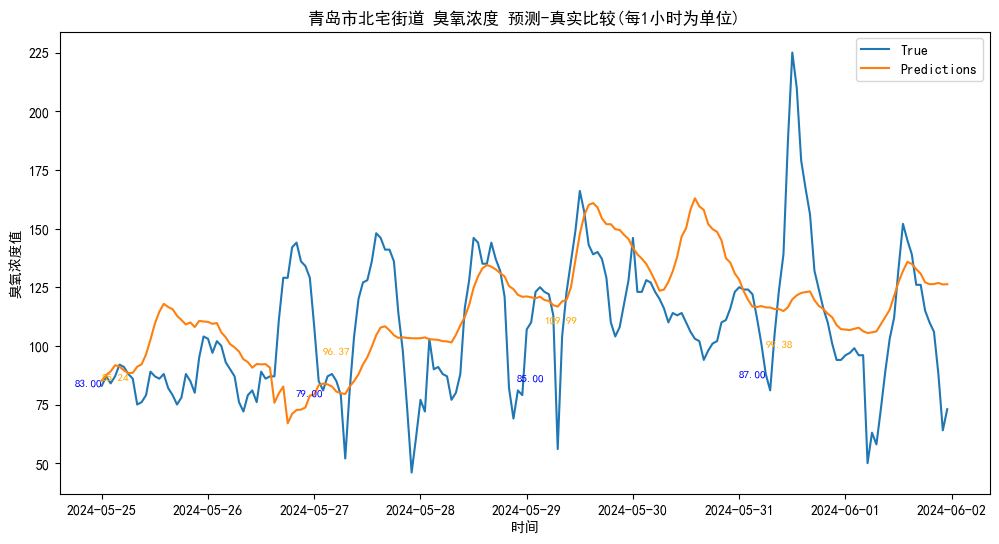

rmse: 29.57498442450494
r2 score: -0.10019015383990615
all
rmse: 29.57498442450494
r2 score: -0.10019015383990615
all-1
rmse: 28.19637328484384
r2 score: -0.32469891133229734
all-2
rmse: 26.838643923651414
r2 score: -0.06415221092333523


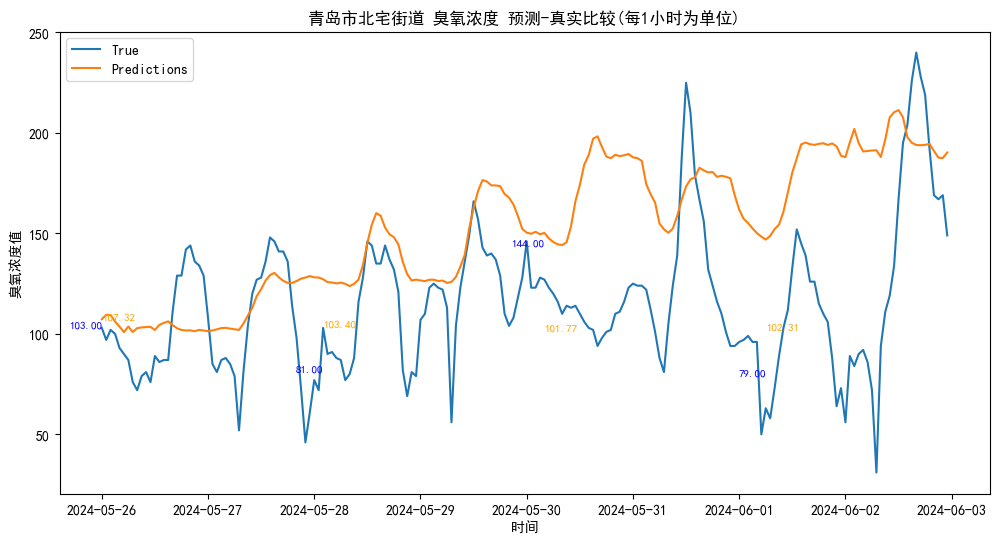

rmse: 53.737309500833916
r2 score: -1.3017848546077464
all
rmse: 53.737309500833916
r2 score: -1.3017848546077464
all-1
rmse: 42.452608325072994
r2 score: -1.2331442169999032
all-2
rmse: 39.47834318785053
r2 score: -1.5401655760926145


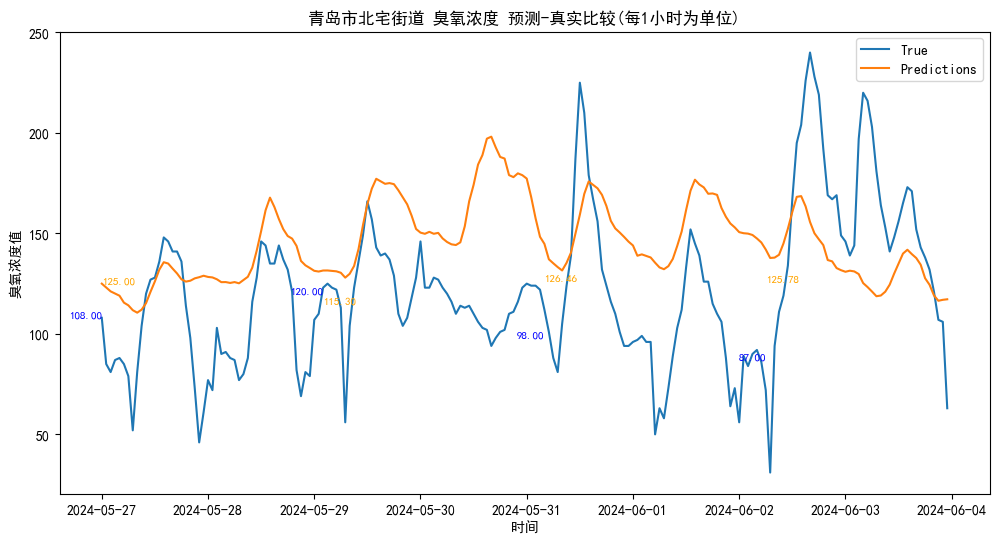

rmse: 46.327361312881656
r2 score: -0.46240786152900326
all
rmse: 46.327361312881656
r2 score: -0.46240786152900326
all-1
rmse: 44.97855522098699
r2 score: -1.3707954406582008
all-2
rmse: 42.64495801076362
r2 score: -1.1684078243208136


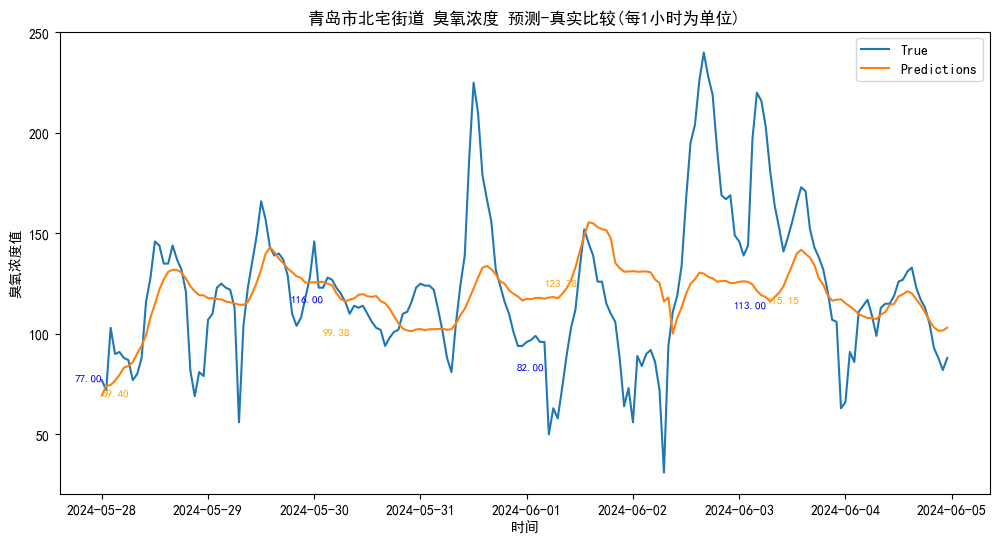

rmse: 34.380694568270485
r2 score: 0.13721331009066684
all
rmse: 34.380694568270485
r2 score: 0.13721331009066684
all-1
rmse: 34.835678837171464
r2 score: 0.11291613806210132
all-2
rmse: 26.783432966535365
r2 score: 0.12390131350185063


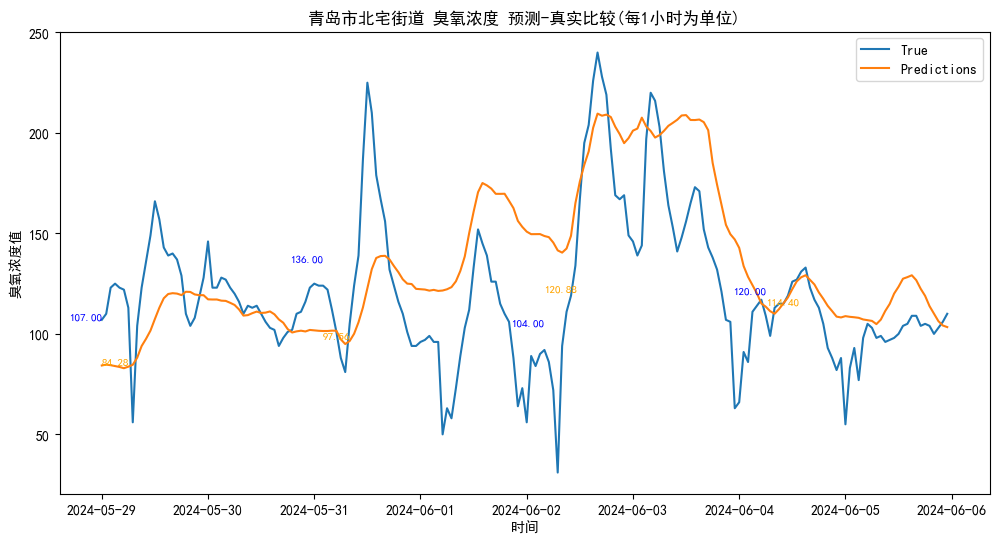

rmse: 36.19854311471906
r2 score: 0.014110435422891254
all
rmse: 36.19854311471906
r2 score: 0.014110435422891254
all-1
rmse: 39.972418909346416
r2 score: -0.03229046349807985
all-2
rmse: 38.23041357402381
r2 score: -0.008759398401728236


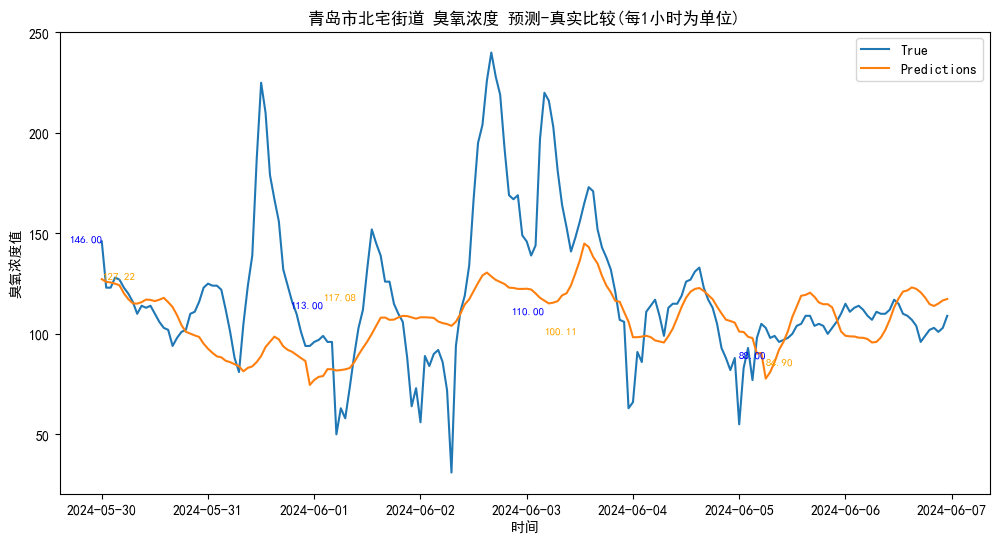

rmse: 34.63232992699664
r2 score: 0.07045108114174581
all
rmse: 34.63232992699664
r2 score: 0.07045108114174581
all-1
rmse: 39.09964342524663
r2 score: 0.027947201645106556
all-2
rmse: 42.38124629785322
r2 score: -0.01983714305033102


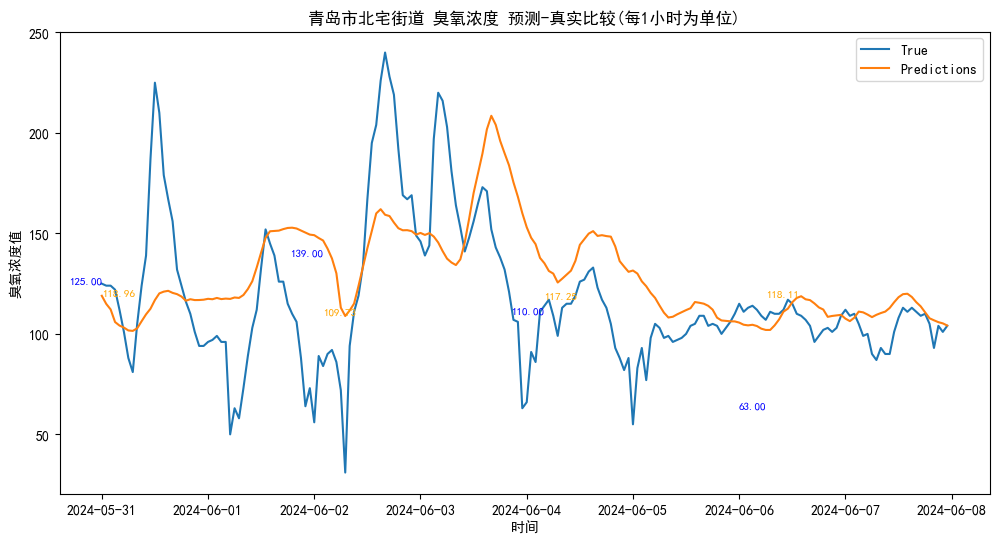

rmse: 35.752258213976255
r2 score: 0.024618132230413647
all
rmse: 35.752258213976255
r2 score: 0.024618132230413647
all-1
rmse: 40.864489569327134
r2 score: -0.004616865729163644
all-2
rmse: 43.488655260441774
r2 score: -0.03102257632278893


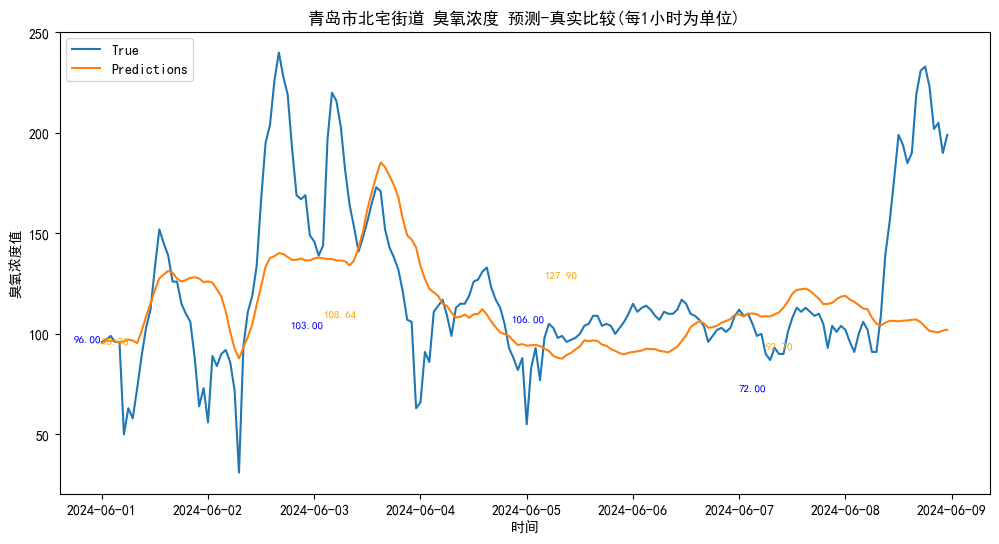

rmse: 38.20018259739855
r2 score: 0.11541466584303273
all
rmse: 38.20018259739855
r2 score: 0.11541466584303273
all-1
rmse: 30.93117128954099
r2 score: 0.3348587998386242
all-2
rmse: 33.25658851078277
r2 score: 0.3483111343080967


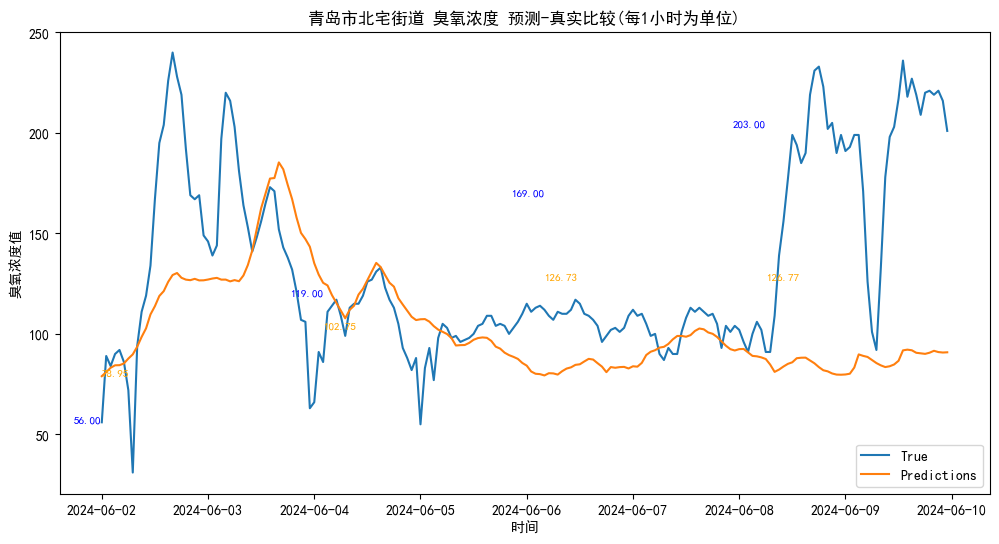

rmse: 58.24700179001891
r2 score: -0.5547778749897383
all
rmse: 58.24700179001891
r2 score: -0.5547778749897383
all-1
rmse: 33.052674885664686
r2 score: 0.166980995065509
all-2
rmse: 35.781101589259656
r2 score: 0.14708923563645226


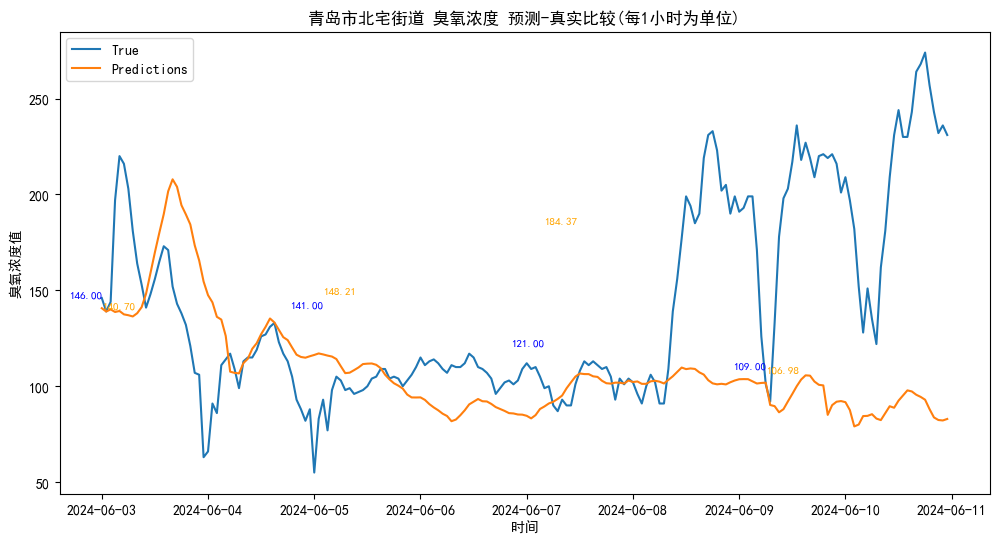

rmse: 67.62559569018788
r2 score: -0.7323046956009687
all
rmse: 67.62559569018788
r2 score: -0.7323046956009687
all-1
rmse: 40.239317474674195
r2 score: -0.20086327733757203
all-2
rmse: 28.521601214380457
r2 score: -0.09031843143257468


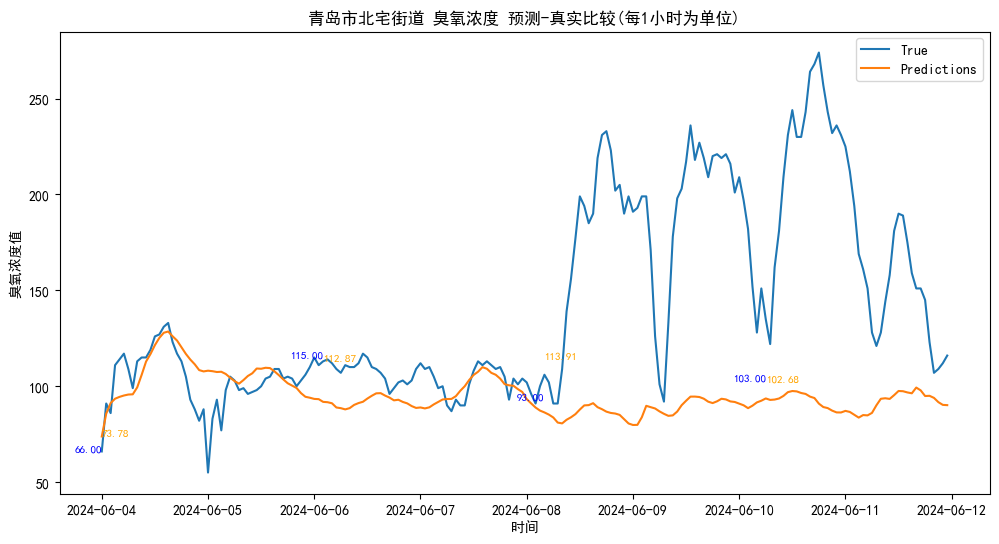

rmse: 71.8492871710699
r2 score: -0.9703379716002107
all
rmse: 71.8492871710699
r2 score: -0.9703379716002107
all-1
rmse: 58.68148814602229
r2 score: -0.710619083924876
all-2
rmse: 41.89940070228695
r2 score: -0.5495893334958668


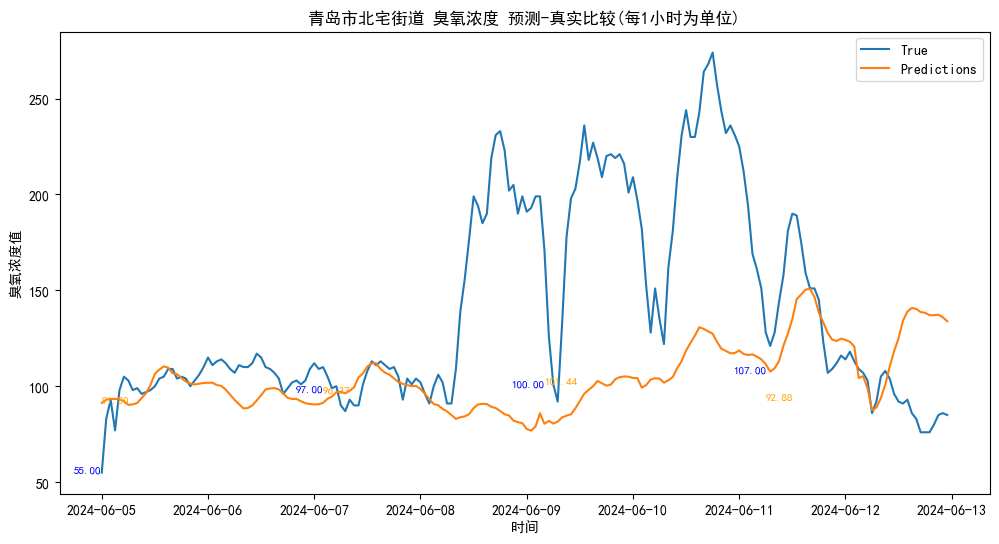

rmse: 64.49516199483351
r2 score: -0.5205752237893879
all
rmse: 64.49516199483351
r2 score: -0.5205752237893879
all-1
rmse: 70.64102753123996
r2 score: -0.6410748996708524
all-2
rmse: 62.56436446674608
r2 score: -0.734329250443502


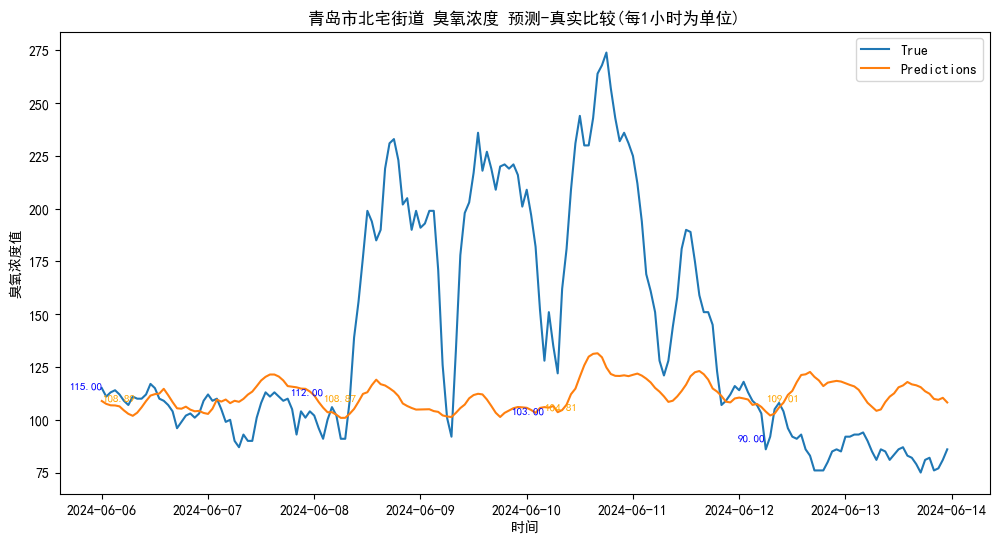

rmse: 58.87244966184721
r2 score: -0.2012328526865057
all
rmse: 58.87244966184721
r2 score: -0.2012328526865057
all-1
rmse: 66.1767568755972
r2 score: -0.5881705832549868
all-2
rmse: 69.22753099957237
r2 score: -0.5458887857152348


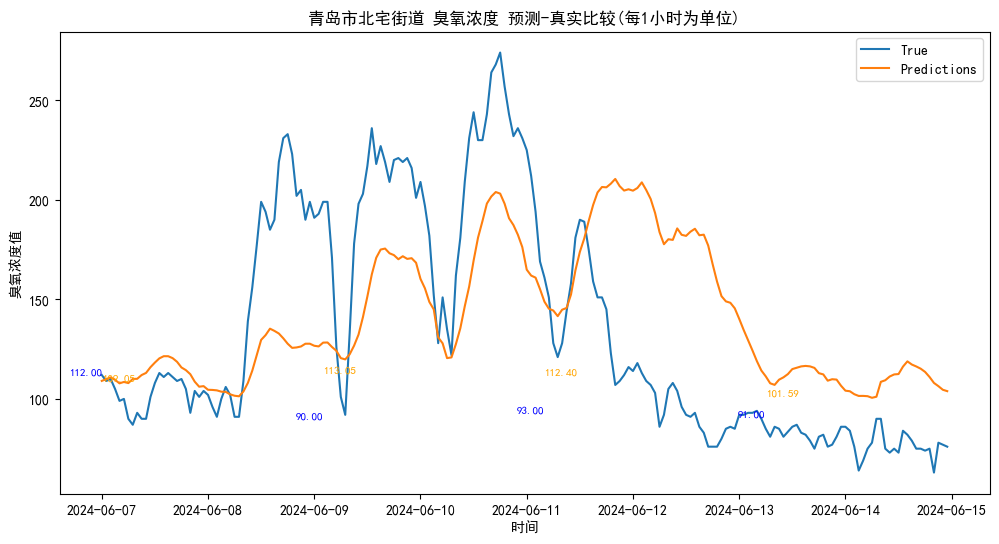

rmse: 50.92806937412002
r2 score: 0.19662719850748656
all
rmse: 50.92806937412002
r2 score: 0.19662719850748656
all-1
rmse: 55.7882519429809
r2 score: -0.03030823972321084
all-2
rmse: 47.29239784980091
r2 score: 0.20006254922509714


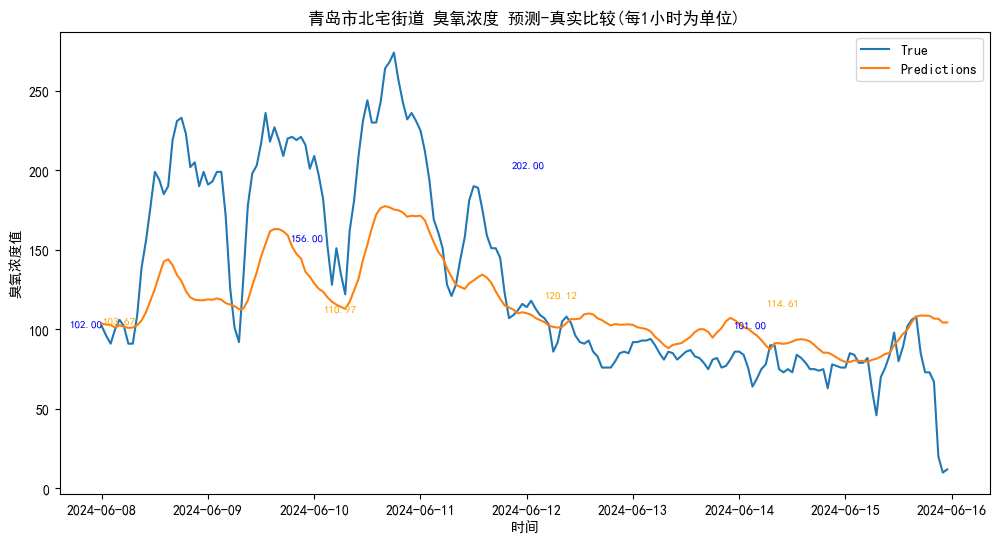

rmse: 42.98338824240487
r2 score: 0.49226578626433504
all
rmse: 42.98338824240487
r2 score: 0.49226578626433504
all-1
rmse: 46.86303091497228
r2 score: 0.3462033714826317
all-2
rmse: 50.902316272027974
r2 score: 0.14562004865845501


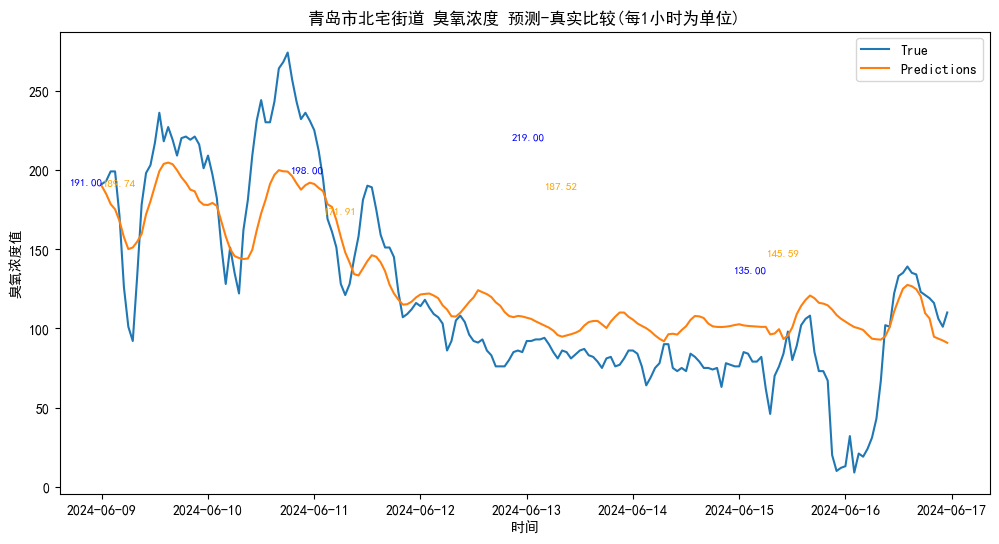

rmse: 33.267803570172454
r2 score: 0.6956804720021275
all
rmse: 33.267803570172454
r2 score: 0.6956804720021275
all-1
rmse: 28.913346226426896
r2 score: 0.7666394398934989
all-2
rmse: 29.637192367845458
r2 score: 0.7473692938764536


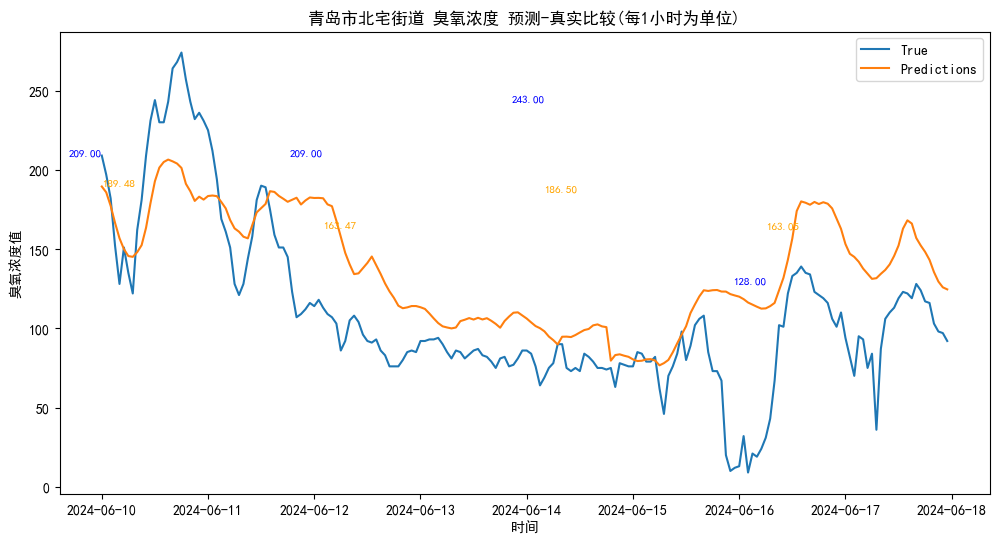

rmse: 43.595562541838326
r2 score: 0.32076473887638823
all
rmse: 43.595562541838326
r2 score: 0.32076473887638823
all-1
rmse: 37.89875611448762
r2 score: 0.5450027525753065
all-2
rmse: 36.39834123794464
r2 score: 0.588523031938351


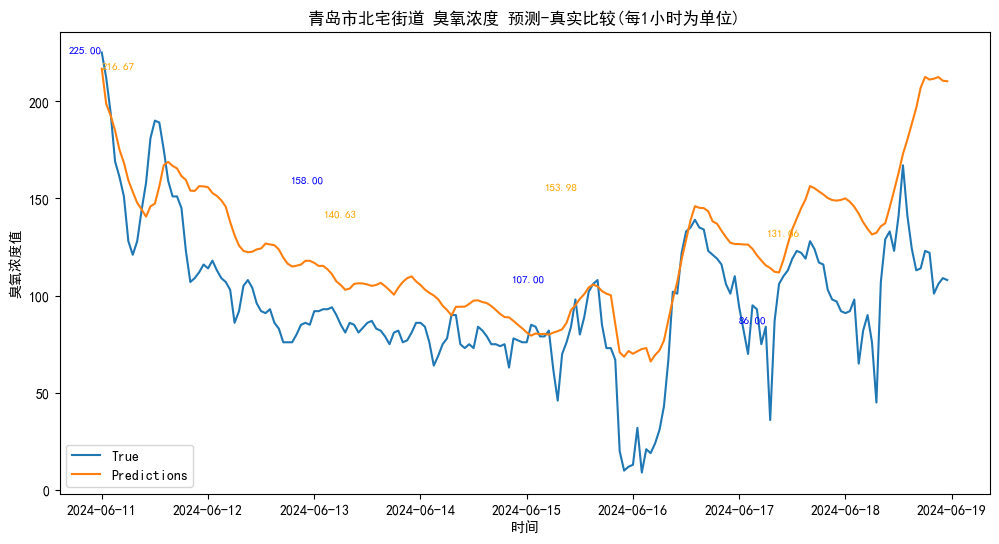

rmse: 36.46032023324514
r2 score: -0.07406320994983884
all
rmse: 36.46032023324514
r2 score: -0.07406320994983884
all-1
rmse: 27.08405588102416
r2 score: 0.4893196380244266
all-2
rmse: 26.34950151810328
r2 score: 0.45483572046692045


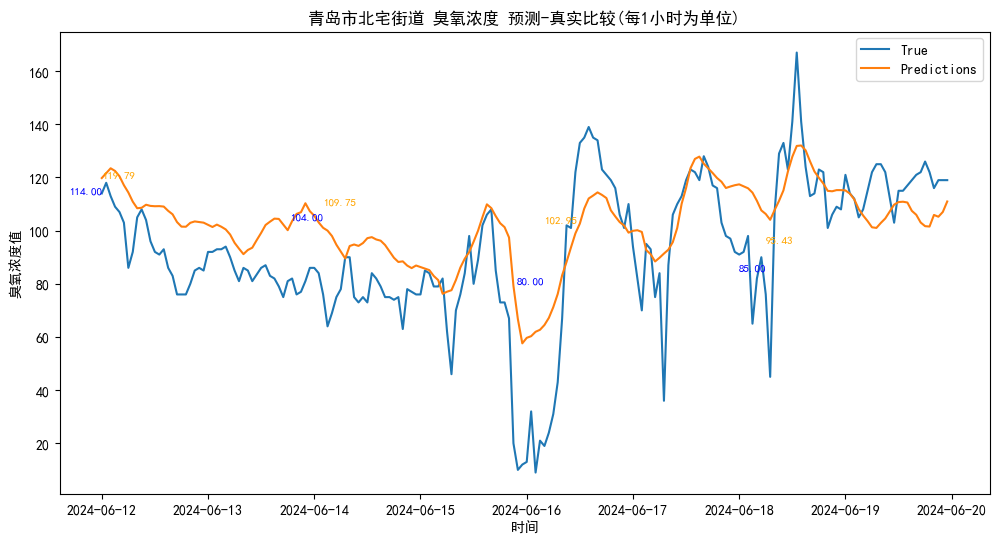

rmse: 20.432580597663957
r2 score: 0.43180272000278963
all
rmse: 20.432580597663957
r2 score: 0.43180272000278963
all-1
rmse: 20.97952693884355
r2 score: 0.3443375360441565
all-2
rmse: 21.77381145792946
r2 score: 0.29053400465758805


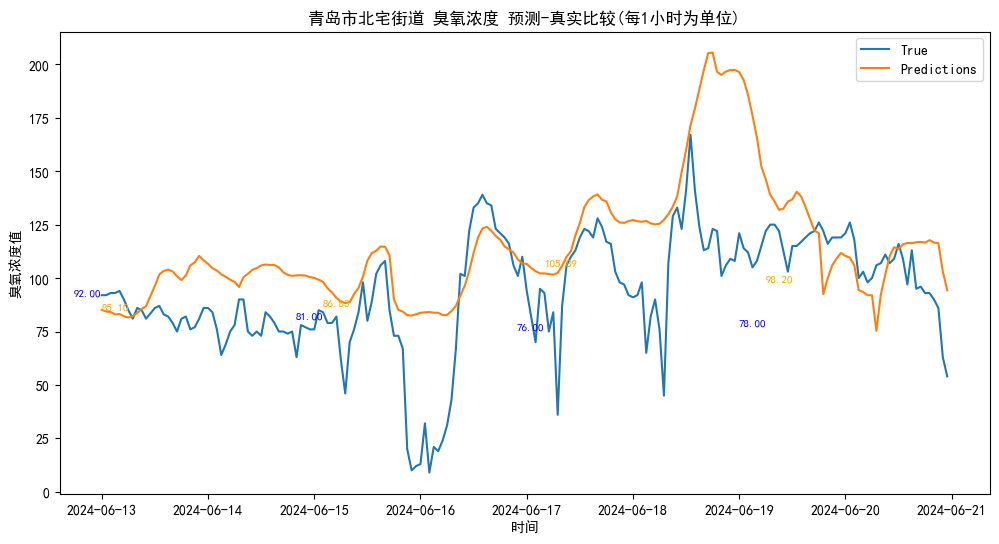

rmse: 33.84318689364618
r2 score: -0.5194461456142112
all
rmse: 33.84318689364618
r2 score: -0.5194461456142112
all-1
rmse: 35.12021579216907
r2 score: -0.49630520093805974
all-2
rmse: 27.41763062508302
r2 score: 0.004821652219386796


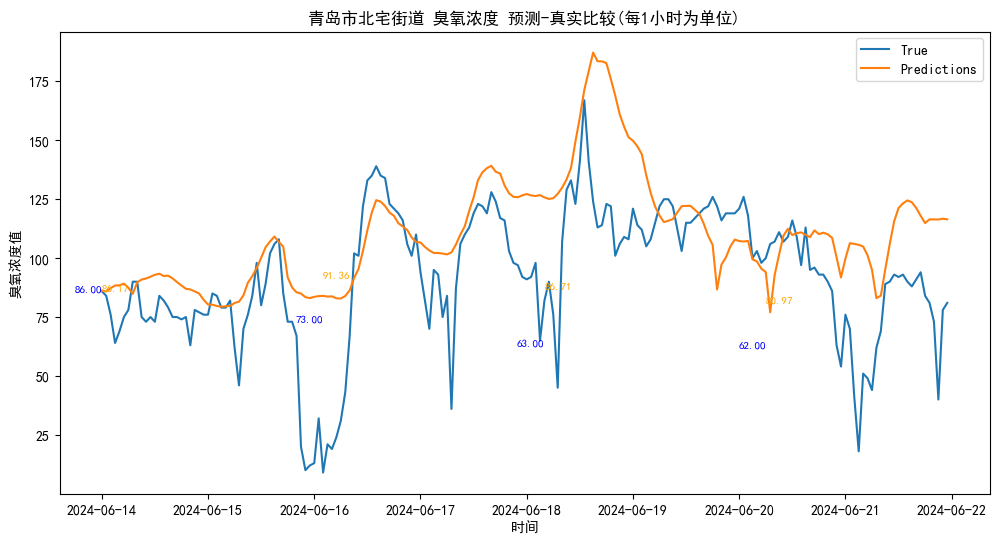

rmse: 30.539109778415515
r2 score: -0.1006329872709173
all
rmse: 30.539109778415515
r2 score: -0.1006329872709173
all-1
rmse: 30.07369729310055
r2 score: 0.033521699090253265
all-2
rmse: 31.921942891621985
r2 score: -0.03934706777906549


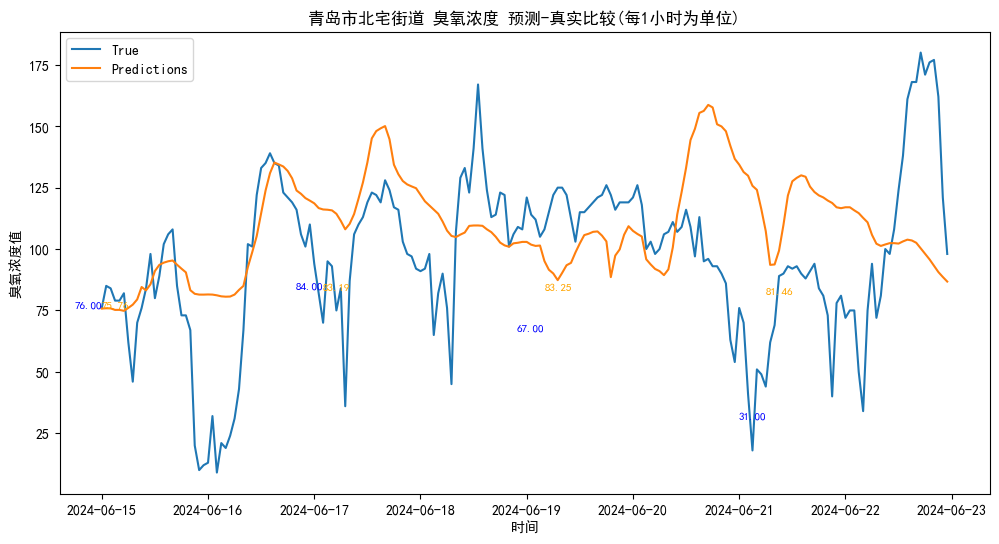

rmse: 37.358727621065526
r2 score: -0.2584973073327004
all
rmse: 37.358727621065526
r2 score: -0.2584973073327004
all-1
rmse: 31.061034129710315
r2 score: -0.05039405777955985
all-2
rmse: 28.186091340374006
r2 score: 0.24205658668120866


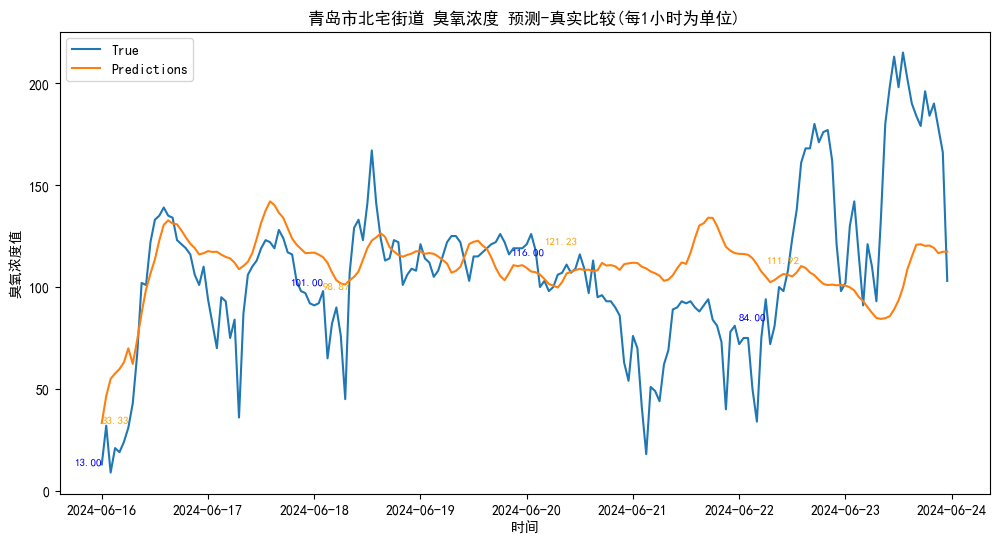

rmse: 37.639728311417315
r2 score: 0.07370828724663969
all
rmse: 37.639728311417315
r2 score: 0.07370828724663969
all-1
rmse: 27.138265994654844
r2 score: 0.1647744649950793
all-2
rmse: 20.794985104323068
r2 score: 0.47338182822518904


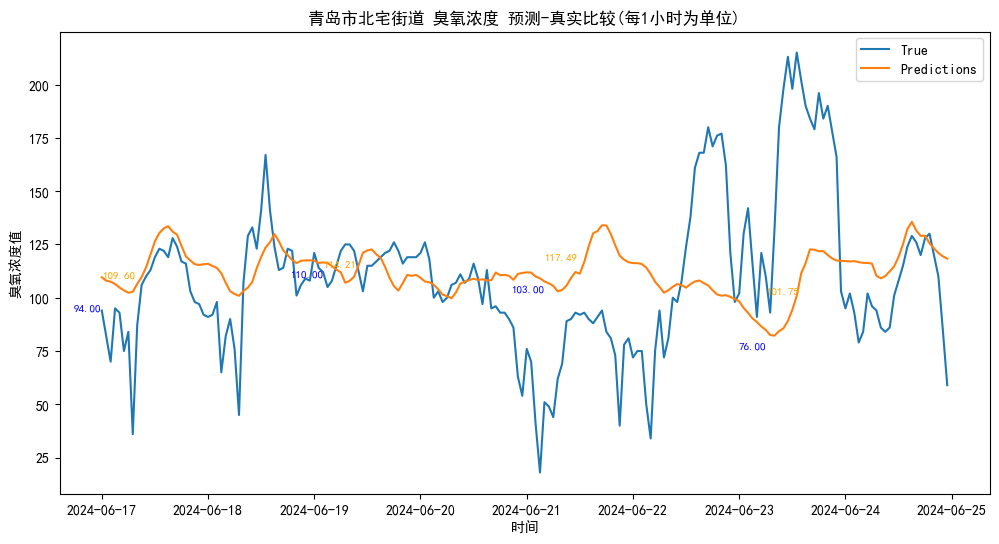

rmse: 37.286084443197275
r2 score: -0.1182112409016629
all
rmse: 37.286084443197275
r2 score: -0.1182112409016629
all-1
rmse: 31.646359947919013
r2 score: -0.16527978323156023
all-2
rmse: 27.243054530076986
r2 score: -0.24769433205898328


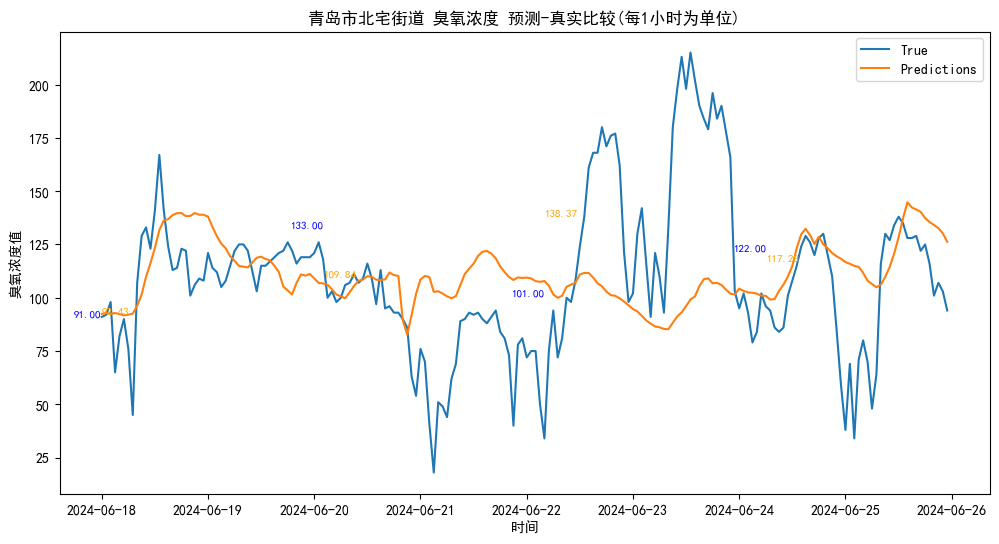

rmse: 38.00274869813685
r2 score: -0.09598081311398166
all
rmse: 38.00274869813685
r2 score: -0.09598081311398166
all-1
rmse: 40.80423616889313
r2 score: -0.1120530437238405
all-2
rmse: 30.88527509725943
r2 score: -0.012077097741357568


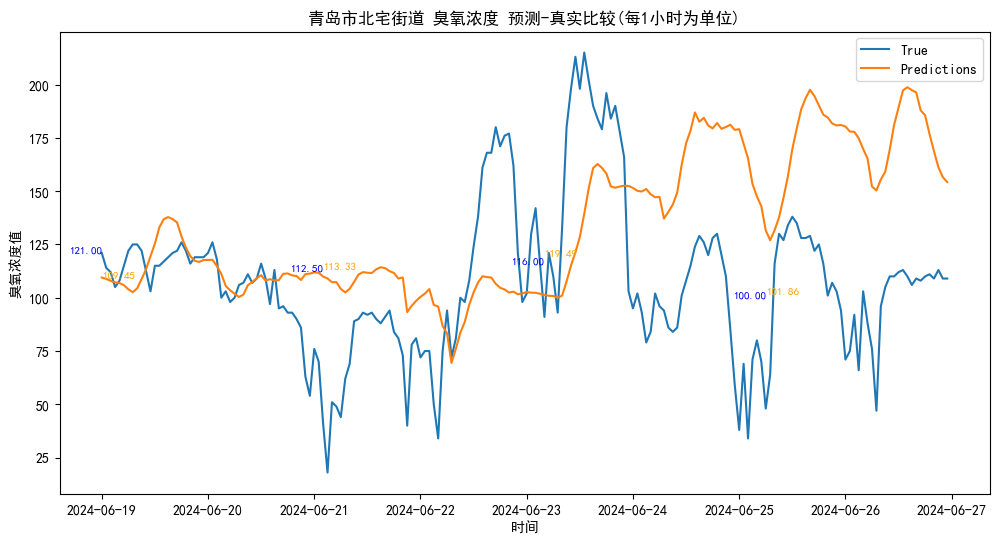

rmse: 52.072692498596616
r2 score: -1.1071004728621783
all
rmse: 52.072692498596616
r2 score: -1.1071004728621783
all-1
rmse: 40.87413580078513
r2 score: -0.14877924934618858
all-2
rmse: 34.430960270312625
r2 score: 0.28493340116100596


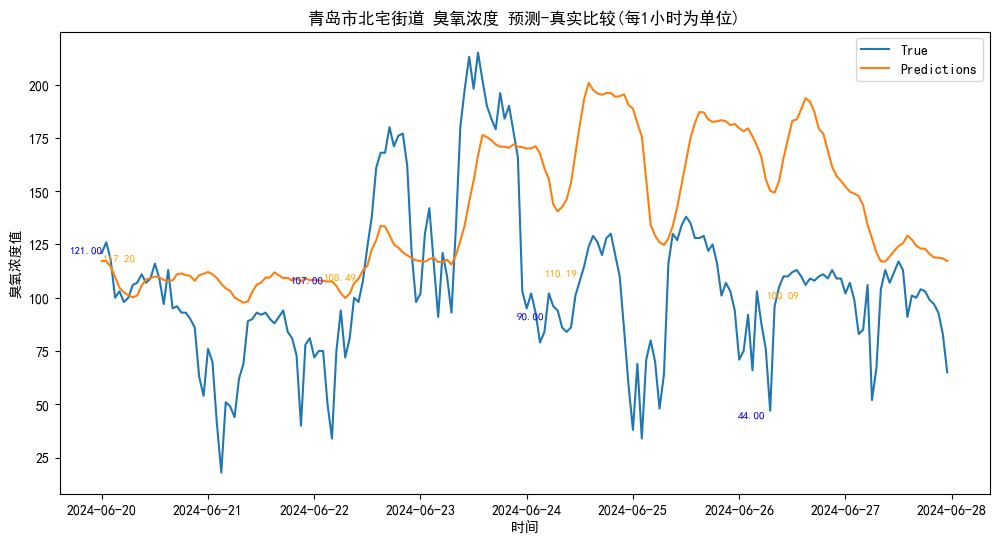

rmse: 53.09684894623381
r2 score: -1.1427333522184586
all
rmse: 53.09684894623381
r2 score: -1.1427333522184586
all-1
rmse: 50.61005971127861
r2 score: -0.5744635351590894
all-2
rmse: 44.66580761299547
r2 score: -0.1536888381959276


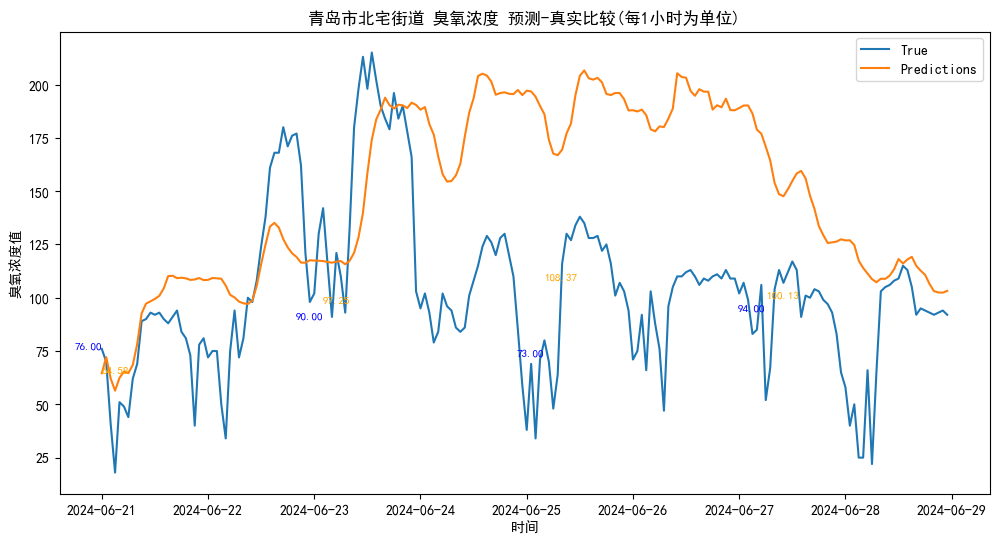

rmse: 65.34057549354378
r2 score: -1.9387508868297165
all
rmse: 65.34057549354378
r2 score: -1.9387508868297165
all-1
rmse: 68.19218704955864
r2 score: -1.8302472931100584
all-2
rmse: 61.93847160479241
r2 score: -1.0347848245601914


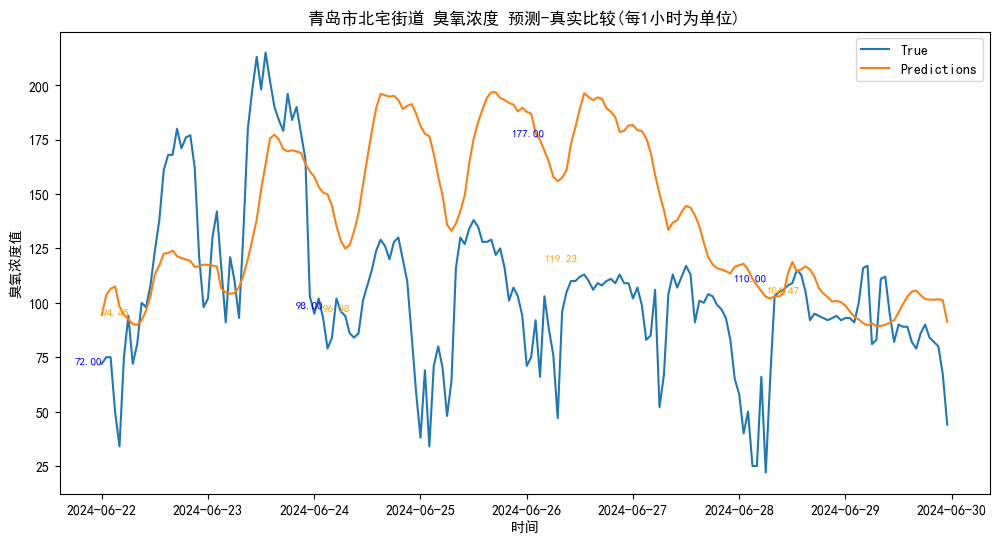

rmse: 55.76697083490685
r2 score: -1.3379832172915558
all
rmse: 55.76697083490685
r2 score: -1.3379832172915558
all-1
rmse: 61.72177574284554
r2 score: -1.7012294089785884
all-2
rmse: 63.3989071060958
r2 score: -1.5435406279708213


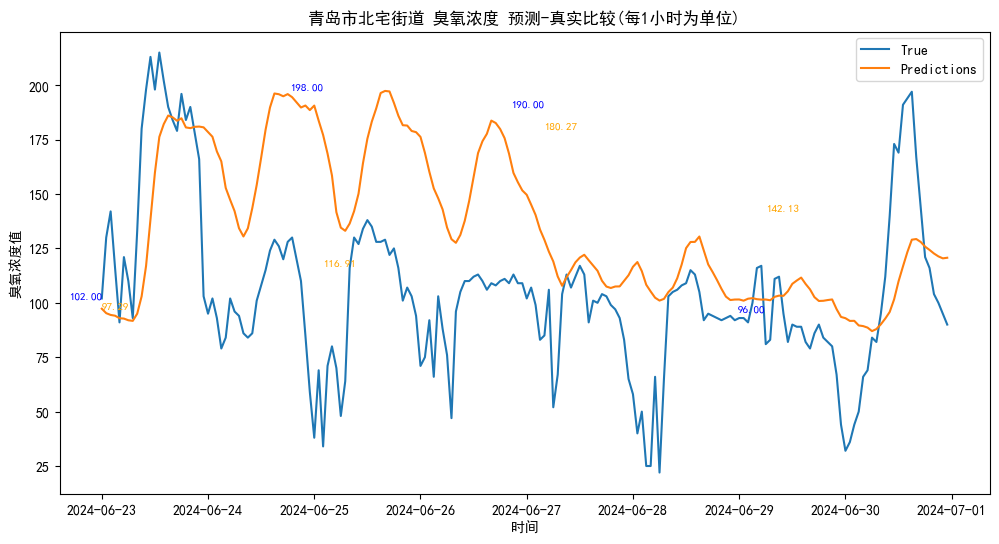

rmse: 51.771119203610894
r2 score: -0.9347811759356384
all
rmse: 51.771119203610894
r2 score: -0.9347811759356384
all-1
rmse: 56.697032263053714
r2 score: -1.3941315869720174
all-2
rmse: 59.348987867943364
r2 score: -1.7194468623846304


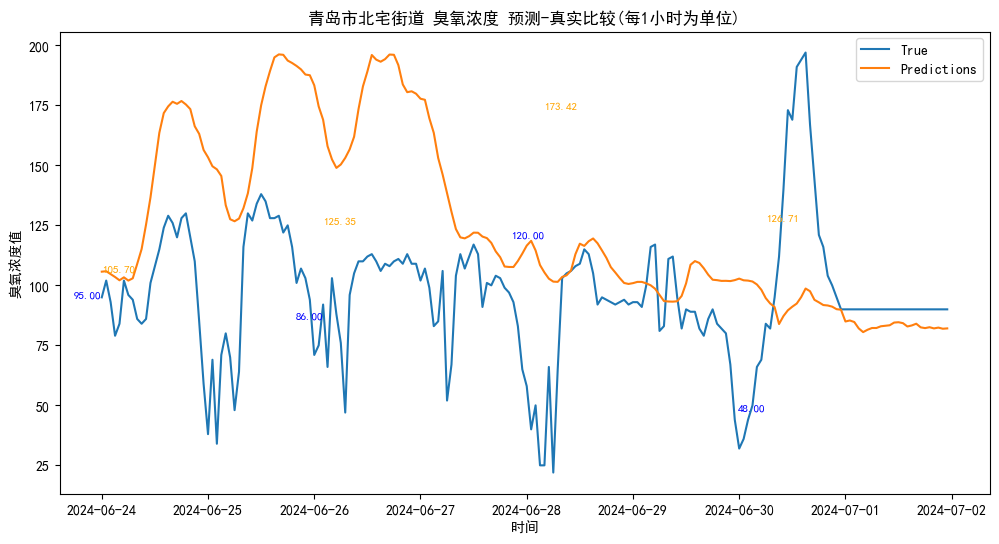

rmse: 50.39460448755309
r2 score: -2.321271993209173
all
rmse: 50.39460448755309
r2 score: -2.321271993209173
all-1
rmse: 53.61872808215688
r2 score: -4.148620081898197
all-2
rmse: 57.96508254035288
r2 score: -4.461913638581707


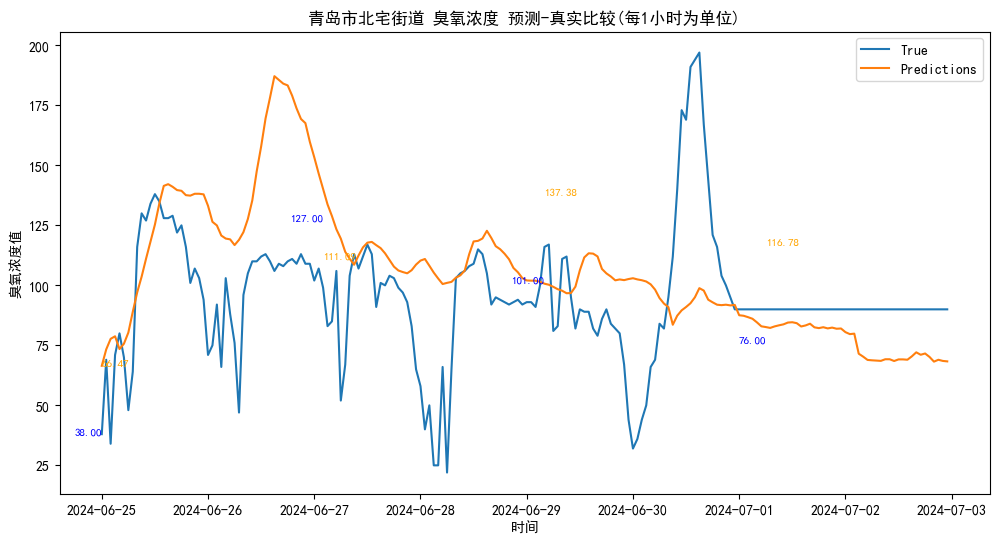

rmse: 35.256167498053564
r2 score: -0.7281932835039686
all
rmse: 35.256167498053564
r2 score: -0.7281932835039686
all-1
rmse: 39.83671660620725
r2 score: -0.670901742206186
all-2
rmse: 36.069631395145514
r2 score: -1.2158235050801047


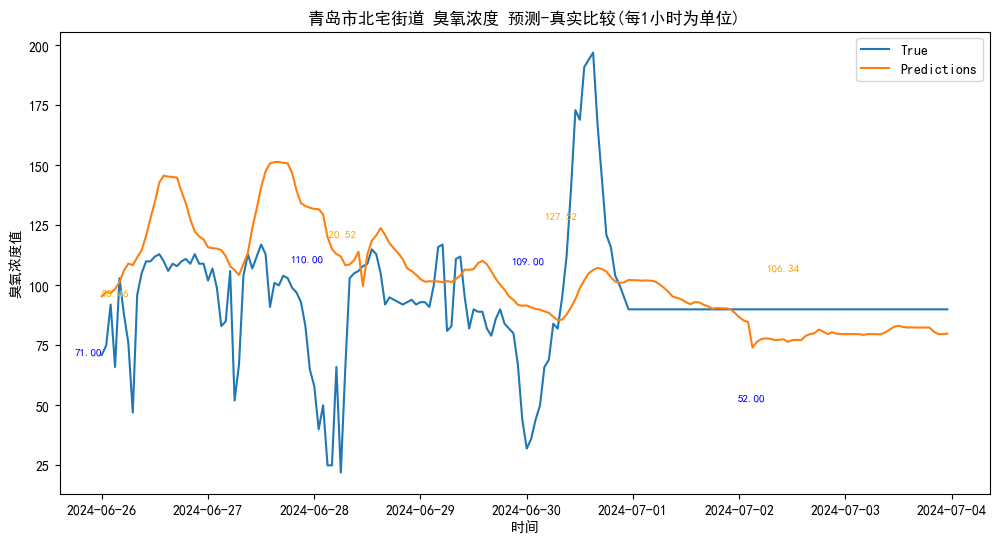

rmse: 30.242320634299443
r2 score: -0.5594179610886374
all
rmse: 30.242320634299443
r2 score: -0.5594179610886374
all-1
rmse: 34.41816139717241
r2 score: -0.5241145912669349
all-2
rmse: 37.56929867459018
r2 score: -0.5207502102324235


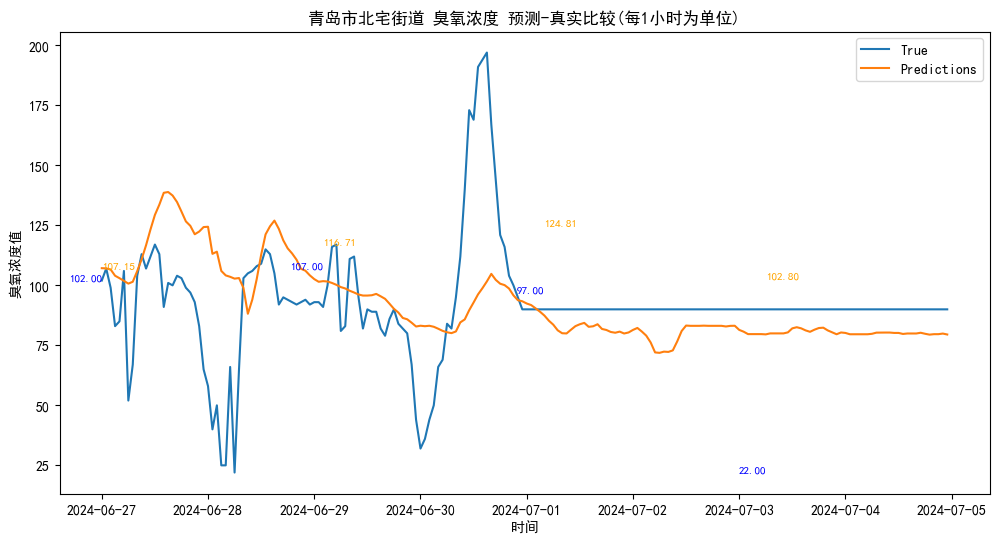

rmse: 26.12896583324413
r2 score: -0.25501751515167825
all
rmse: 26.12896583324413
r2 score: -0.25501751515167825
all-1
rmse: 29.64369272906556
r2 score: -0.21525671242271405
all-2
rmse: 32.095705573032326
r2 score: -0.1901136970165358


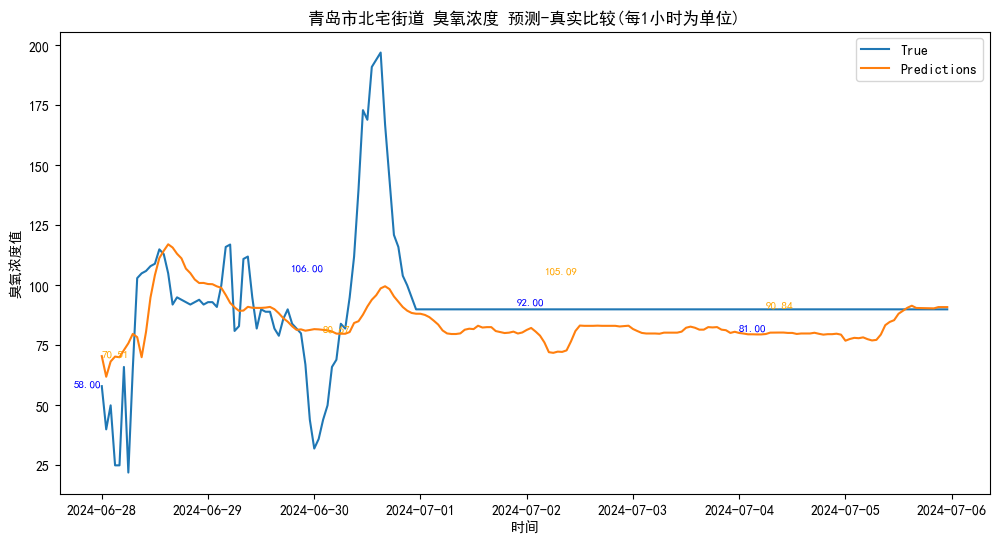

rmse: 21.49522946314261
r2 score: 0.09484303800093097
all
rmse: 21.49522946314261
r2 score: 0.09484303800093097
all-1
rmse: 24.269800913612507
r2 score: 0.13330248752493346
all-2
rmse: 26.28283005346752
r2 score: 0.1519799802643852


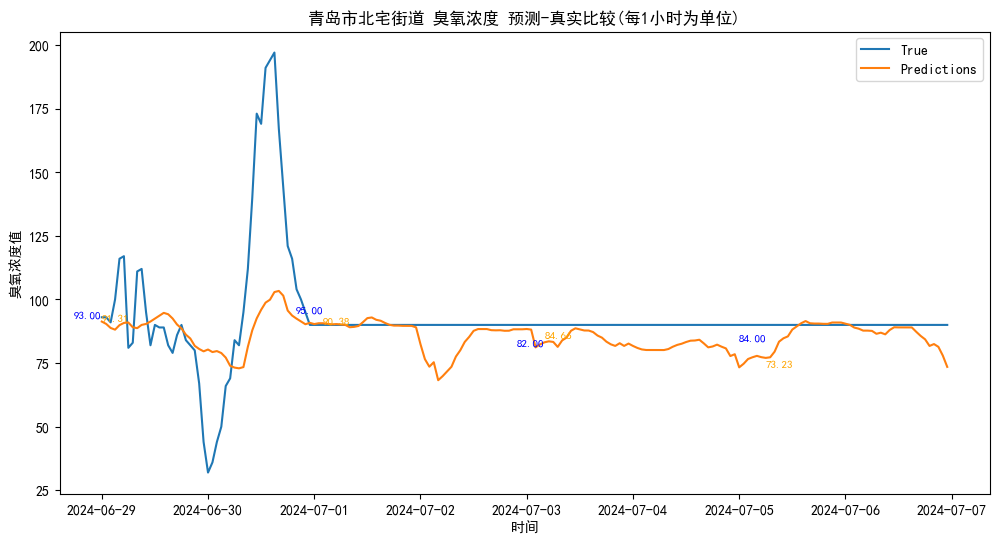

rmse: 18.87461280761442
r2 score: 0.08801863412151756
all
rmse: 18.87461280761442
r2 score: 0.08801863412151756
all-1
rmse: 21.4024327751208
r2 score: 0.11568252214818386
all-2
rmse: 23.111149372172964
r2 score: 0.1368904341073648


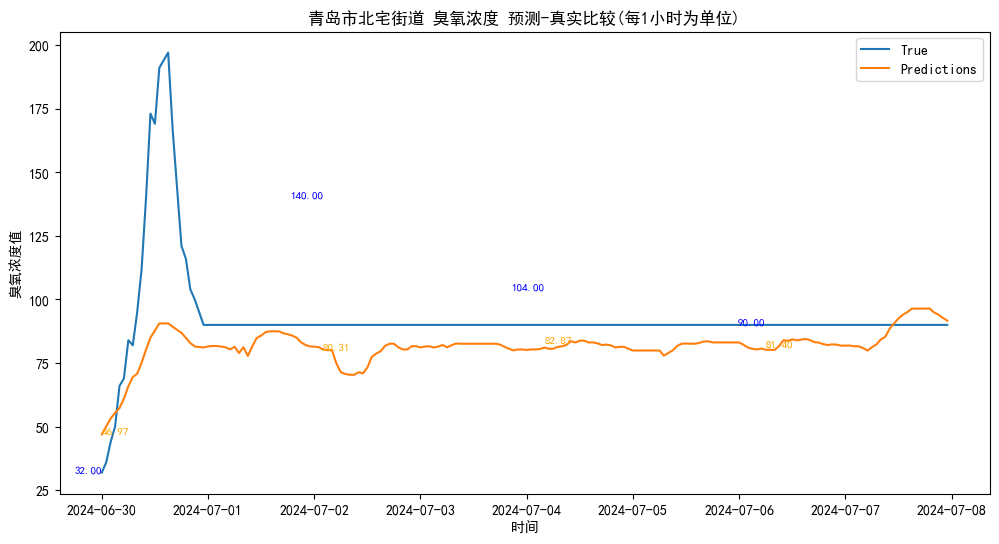

rmse: 20.192651785056796
r2 score: -0.13194860729568192
all
rmse: 20.192651785056796
r2 score: -0.13194860729568192
all-1
rmse: 22.954861496693262
r2 score: -0.1043498826568281
all-2
rmse: 24.849571399558368
r2 score: -0.08420737265449385


In [63]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
for i in range(len(df_list)):
# 绘制真实值和预测值的曲线
    plt.figure(figsize=(12, 6))
    plt.title("青岛市北宅街道 臭氧浓度 预测-真实比较(每1小时为单位)")
    plt.plot(df_list[i]['日期'],y_list[i].values, label='True')
    plt.plot(df_list[i]['日期'],y_pred_list[i], label='Predictions')
    plt.xlabel('时间')
    plt.ylabel('臭氧浓度值')

# 显示每个具体的数值
    for j in range(0, len(df_list[i]), 10):
        if 5 * j < len(df_list[i]) and j < len(y_list[i]) and j < len(y_pred_list[i]):
            plt.text(df_list[i].iloc[5*j]['日期'], y_list[i].values[j], f'{y_list[i].values[j]:.2f}', color='blue', fontsize=8, ha='right')
            plt.text(df_list[i].iloc[5*j]['日期'], y_pred_list[i][j], f'{y_pred_list[i][j]:.2f}', color='orange', fontsize=8, ha='left')
    plt.legend()
    plt.show()
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values, y_pred_list[i])))
    print("r2 score:", r2_score(y_list[i].values, y_pred_list[i]))
    print("all-1")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(2*24)], y_pred_list[i][:-(2*24)]))
    print("all-2")
    print("rmse:", math.sqrt(mean_squared_error(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)])))
    print("r2 score:", r2_score(y_list[i].values[:-(3 *24)], y_pred_list[i][:-(3 *24)]))

In [64]:
# from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
# import matplotlib.dates as mdates
# from datetime import datetime, timedelta
# date_range_list = []
# date_range_list111 = []
# start_date111 = datetime(2024, 5, 16, 0, 0, 0) 
# end_date111 = datetime(2024, 5, 22, 23, 0, 0)
# date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
# merged_data111 = pd.merge(pd.DataFrame(date_range111, columns=['日期']), datat, on='日期', how='inner')
# while end_date111 < datetime(2024, 7, 1, 0, 0, 0):
#     date_range111 = pd.date_range(start=start_date111, end=end_date111, freq='H')
#     date_range_list111.append(date_range111)
#     end_date111 += timedelta(hours=1)
#     start_date111 = end_date111
#     end_date111 += timedelta(days=1)
#     end_date111 -= timedelta(hours=1)


# true_value_list1 = []
# true_value_list1 = merged_data111['O3VAL'].tolist()



# start_date = datetime(2024, 5, 16, 0, 0, 0) 
# end_date = datetime(2024, 5, 16, 23, 0, 0)
# while end_date < datetime(2024, 7, 1, 0, 0, 0):
#     date_range = pd.date_range(start=start_date, end=end_date, freq='H')
#     date_range_list.append(date_range)
#     end_date += timedelta(hours=1)
#     start_date = end_date
#     end_date += timedelta(days=1)
#     end_date -= timedelta(hours=1)

# num = 0
# colors = [
#  '#d3e5f3','#a1cae1', 
#     '#5d9fcd', '#4292c6',  '#3171ad',
#     '#2864a0', '#2171b5',   '#08306b','orange'
# ]
# true_legend_added = 0 
# pred_value_list_7 = np.array([])
# pred_value_list_6 = np.array([])
# pred_value_list_5 = np.array([])
# pred_value_list_4 = np.array([])
# pred_value_list_3 = np.array([])
# pred_value_list_2 = np.array([])
# pred_value_list_1 = np.array([])
# pred_value_list_0 = np.array([])

# for date_ranges in date_range_list:
#     num = 7
#     for i in range(len(df_list)):
#         is_in_list = df_list[i]['日期'].isin(date_ranges)
#         rmse_list = []
#         r2_list = []
#         if is_in_list.any():
#             matching_indices = df_list[i].index[is_in_list].tolist()
#             matching_values = df_list[i].loc[is_in_list, '日期'].tolist()
#             if num == 7:
#                 pred_value_list_7 = np.concatenate((pred_value_list_7, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 6:
#                 pred_value_list_6 = np.concatenate((pred_value_list_6, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 5:
#                 pred_value_list_5 = np.concatenate((pred_value_list_5, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 4:
#                 pred_value_list_4 = np.concatenate((pred_value_list_4, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 3:
#                 pred_value_list_3 = np.concatenate((pred_value_list_3, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 2:
#                 pred_value_list_2 = np.concatenate((pred_value_list_2, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 1:
#                 pred_value_list_1 = np.concatenate((pred_value_list_1, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             elif num == 0:
#                 pred_value_list_0 = np.concatenate((pred_value_list_0, y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[-1]/5)+1]))
#             num-=1



# plt.figure(figsize=(15, 6))
# plt.title("青岛市八大关街道 臭氧浓度 预测-真实比较(每1小时为单位)")
# plt.plot(date_range111,pred_value_list_7,color=colors[0], label='n-7')
# plt.plot(date_range111,pred_value_list_6,color=colors[1], label='n-6')
# plt.plot(date_range111,pred_value_list_5,color=colors[2], label='n-5')
# plt.plot(date_range111,pred_value_list_4,color=colors[3], label='n-4')
# plt.plot(date_range111,pred_value_list_3,color=colors[4], label='n-3')
# plt.plot(date_range111,pred_value_list_2,color=colors[5], label='n-2')
# # plt.plot(date_range111,pred_value_list_1,color=colors[6], label='n-1')
# # plt.plot(date_range111,pred_value_list_0,color=colors[7], label='n-0')
# plt.plot(date_range111,true_value_list,color=colors[-1], label='True')
# plt.legend()
# plt.show()   


# print('n-7 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_7)))
# print('n-7 R2:',r2_score(true_value_list, pred_value_list_7))
# print('n-6 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_6)))
# print('n-6 R2:',r2_score(true_value_list, pred_value_list_6))
# print('n-5 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_5)))
# print('n-5 R2:',r2_score(true_value_list, pred_value_list_5))
# print('n-4 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_4)))
# print('n-4 R2:',r2_score(true_value_list, pred_value_list_4))
# print('n-3 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_3)))
# print('n-3 R2:',r2_score(true_value_list, pred_value_list_3))
# print('n-2 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_2)))
# print('n-2 R2:',r2_score(true_value_list, pred_value_list_2))
# # print('n-1 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_1)))
# # print('n-1 R2:',r2_score(true_value_list, pred_value_list_1))
# # print('n-0 MASE:',math.sqrt(mean_squared_error(true_value_list, pred_value_list_0)))
# # print('n-0 R2:',r2_score(true_value_list, pred_value_list_0))
# # r2_list.append(r2_score(y_list[i].values[int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1], y_pred_list[i][int(matching_indices[0]/5):int(matching_indices[(j+1)*24-1]/5)+1]))
# # print(f"第{num}条线,前{j+1}天 rmse:", rmse_list[j])
# # print(f"第{num}条线,前{j+1}天 r2 score:", r2_list[j])

In [65]:
# for i in range(46):

#     mase7 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24]))
#     mase6 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24]))
#     mase5 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24]))
#     mase4 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24]))
#     mase3 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24]))
#     mase2 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24]))
#     mase1 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24]))
#     mase0 = math.sqrt(mean_squared_error(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24]))
    
#     r27 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_7[i*24:i*24+24])
#     r26 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_6[i*24:i*24+24])
#     r25 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_5[i*24:i*24+24])
#     r24 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_4[i*24:i*24+24])
#     r23 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_3[i*24:i*24+24])
#     r22 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_2[i*24:i*24+24])
#     r21 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_1[i*24:i*24+24])
#     r20 = r2_score(true_value_list[i*24:i*24+24], pred_value_list_0[i*24:i*24+24])
#     rmse_list = []
#     r2_list = []
#     rmse_list.append(mase7)
#     rmse_list.append(mase6)
#     rmse_list.append(mase5)
#     rmse_list.append(mase4)
#     rmse_list.append(mase3)
#     rmse_list.append(mase2)
#     rmse_list.append(mase1)
#     rmse_list.append(mase0)
#     std_dev1 = np.std(rmse_list)
#     r2_list.append(r27)
#     r2_list.append(r26)
#     r2_list.append(r25)
#     r2_list.append(r24)
#     r2_list.append(r23)
#     r2_list.append(r22)
#     r2_list.append(r21)
#     r2_list.append(r20)
#     std_dev2 = np.std(r2_list)
#     col_name1 = 'rmse'
#     col_name2 = 'r2'
    
    
    


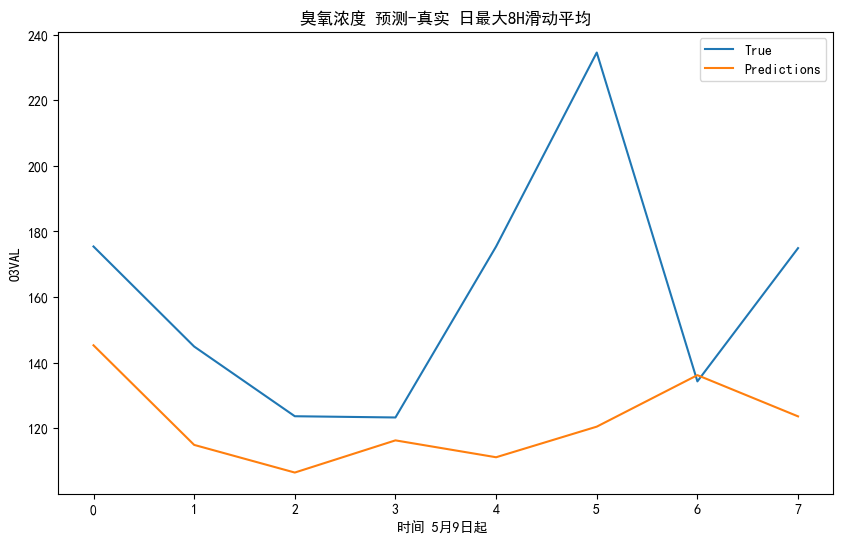

rmse: 52.34544580196942
r2 score: -1.2355997506217413
rmse: 30.05367300588436
r2 score: -2.88378720191184
rmse: 26.464793288040475
r2 score: -0.5526260177981863
rmse: 23.183493213446514
r2 score: -0.1870226657086147
rmse: 35.43547550516003
r2 score: -1.3133252105320499
rmse: 56.69498620935117
r2 score: -1.1724912249554427


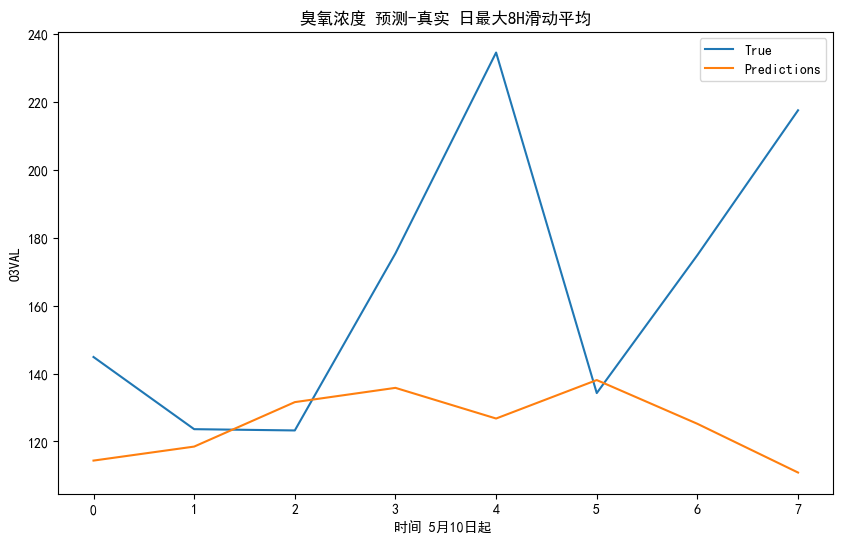

rmse: 59.21997089511574
r2 score: -1.2286721339335727
rmse: 21.867952247647896
r2 score: -3.2360234563800896
rmse: 18.49250360175806
r2 score: -2.347773023038786
rmse: 25.46100998839613
r2 score: -0.4317016219685339
rmse: 53.29358912307157
r2 score: -0.6344478804400733
rmse: 48.675326338204385
r2 score: -0.5359767011051313


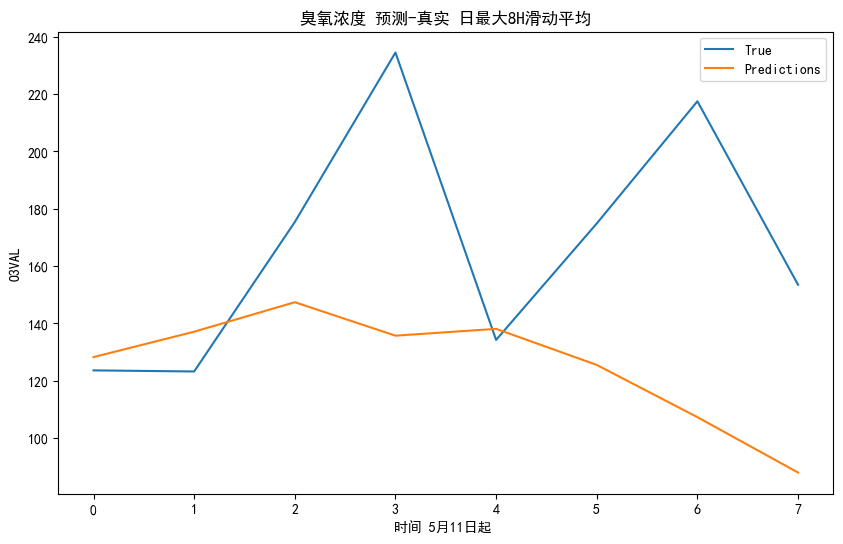

rmse: 60.86395357368637
r2 score: -1.4115701811117005
rmse: 10.340892857252044
r2 score: -3040.6800735336205
rmse: 18.220959444128106
r2 score: 0.44617069185914826
rmse: 51.84263188401465
r2 score: -0.28133178213677756
rmse: 46.40157868424471
r2 score: -0.1820894604150165
rmse: 46.90523437544498
r2 score: -0.41350467736880114


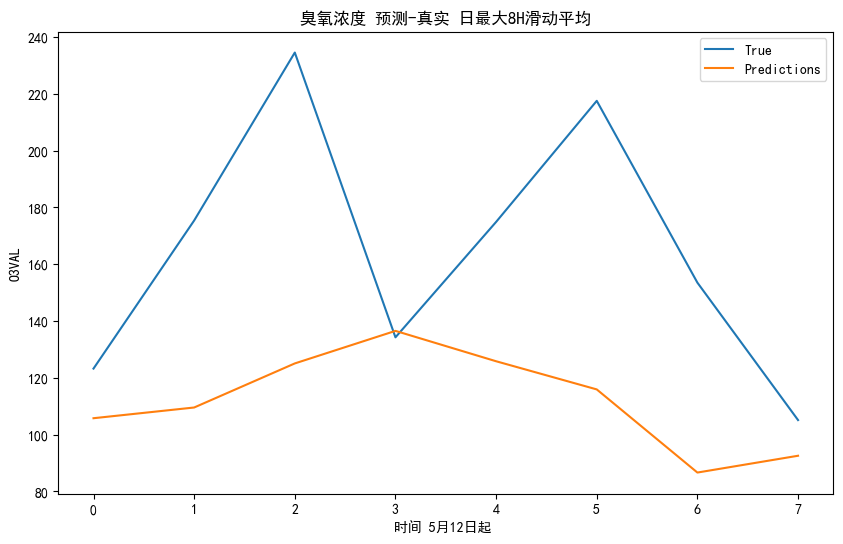

rmse: 65.16368447342754
r2 score: -1.392753923480039
rmse: 48.15715545543269
r2 score: -2.414204320681756
rmse: 74.41852236239652
r2 score: -1.6812699203231745
rmse: 64.45833742977352
r2 score: -1.1830668772556079
rmse: 61.684645415348605
r2 score: -1.4822142160049432
rmse: 69.93326400209322
r2 score: -2.034713082732973


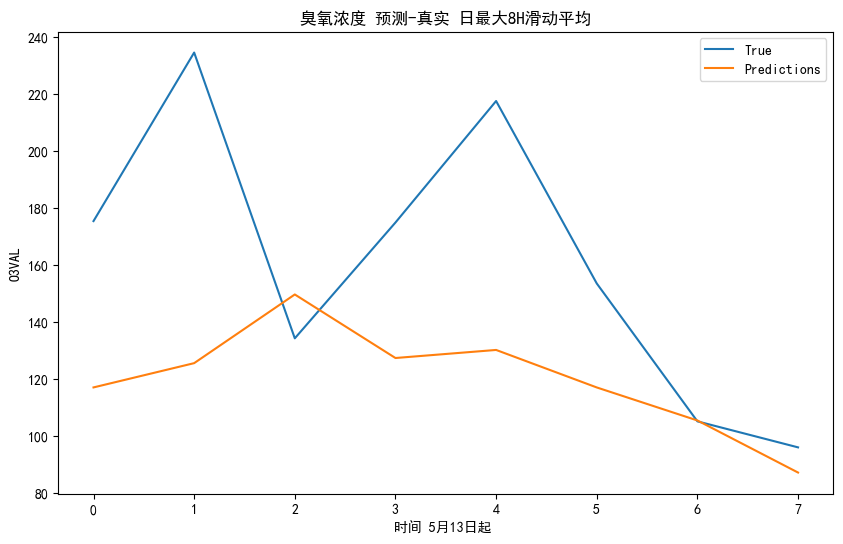

rmse: 57.88561544938132
r2 score: -0.5665678655685111
rmse: 87.3948059247724
r2 score: -7.739547122960946
rmse: 71.90840951791283
r2 score: -2.054215915325894
rmse: 66.65466633039554
r2 score: -2.477275710870503
rmse: 71.27008907101215
r2 score: -3.0630407229430823
rmse: 66.74306425058134
r2 score: -2.710753043623017


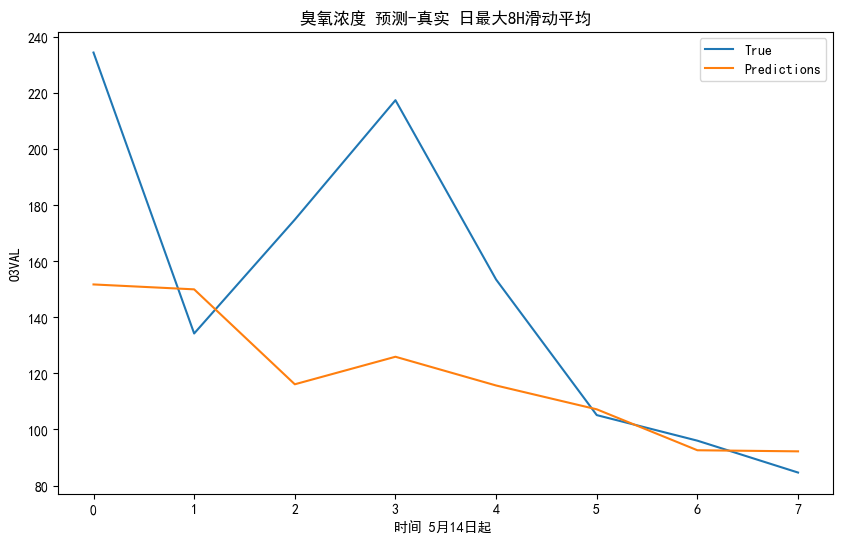

rmse: 50.53677423745647
r2 score: 0.061870562510181415
rmse: 59.56295743783677
r2 score: -0.41202938737607075
rmse: 59.293588042820254
r2 score: -1.0740960178573902
rmse: 68.79160645616324
r2 score: -2.116928033719441
rmse: 63.809925278326226
r2 score: -1.8452381898911132
rmse: 58.256319521169594
r2 score: -0.6691725710352181


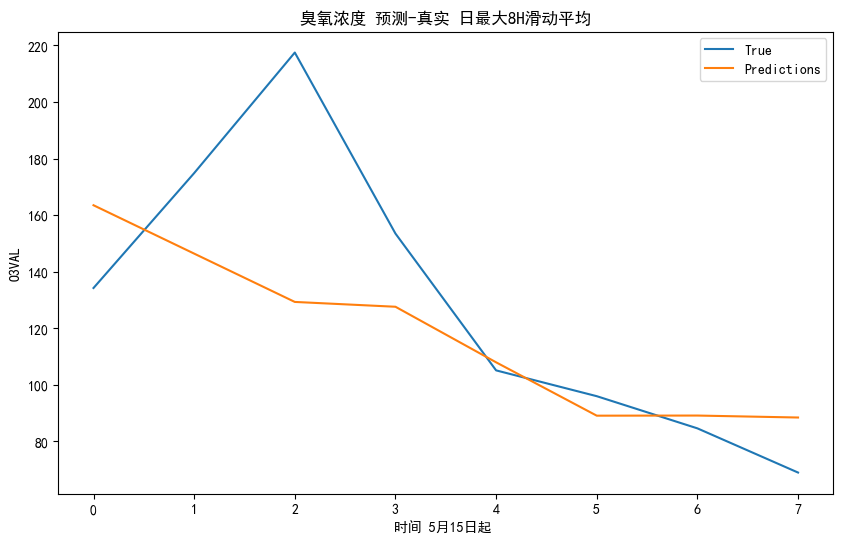

rmse: 36.34160852008815
r2 score: 0.406144472833158
rmse: 28.86567174686642
r2 score: -1.0194661621950072
rmse: 56.09889556958956
r2 score: -1.7240046530944877
rmse: 50.276582091383595
r2 score: -1.6397083509724855
rmse: 44.98678584476199
r2 score: -0.40531078698853507
rmse: 41.16337789933868
r2 score: 0.01357957788748998


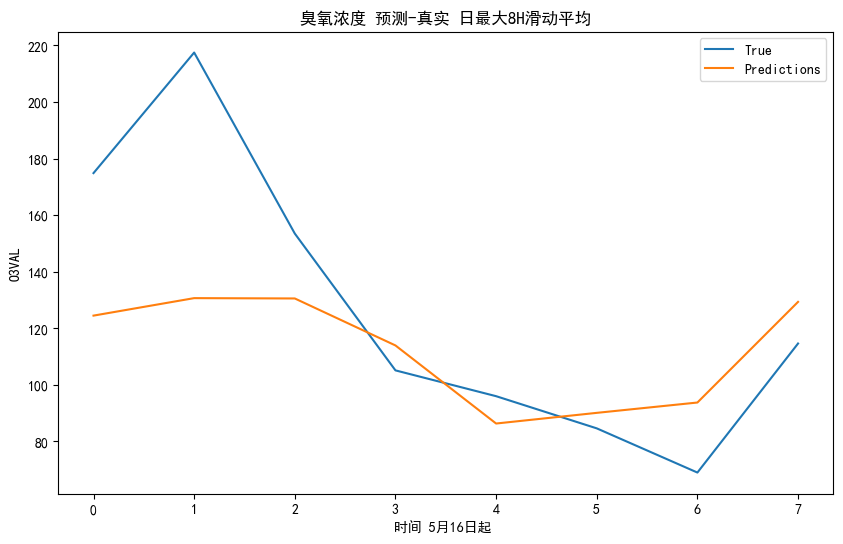

rmse: 38.13771935913713
r2 score: 0.3512821346431908
rmse: 70.98752190830743
r2 score: -10.094180788526943
rmse: 59.45600248577165
r2 score: -3.9946999489649286
rmse: 51.67866520036187
r2 score: -0.6307578195447103
rmse: 46.4244896828542
r2 score: -0.06534056861697346
rmse: 42.43861171607726
r2 score: 0.20611023136064577


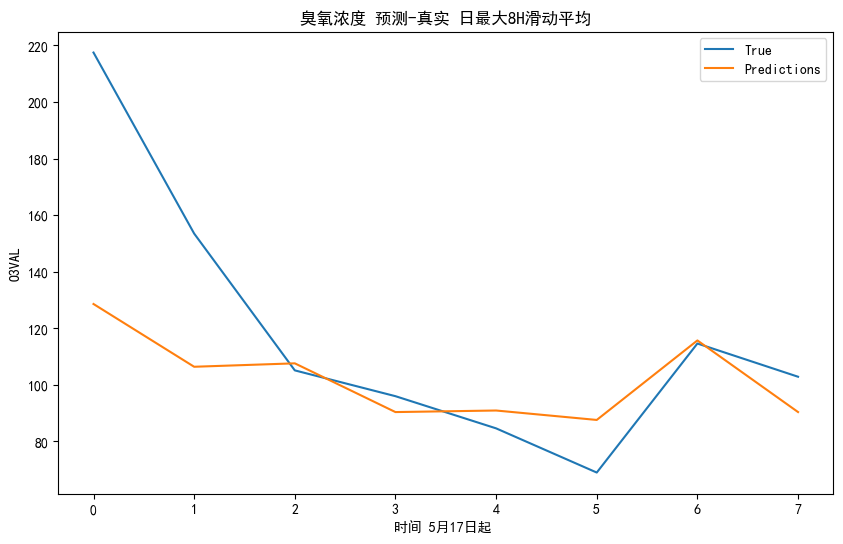

rmse: 36.57676695818945
r2 score: 0.31238596097754456
rmse: 71.14177324515772
r2 score: -3.9425311527982814
rmse: 58.104774788903285
r2 score: -0.5938436535299507
rmse: 50.39856636585646
r2 score: -0.09200872420005535
rmse: 45.166093254020964
r2 score: 0.15234415239663768
rmse: 41.924190699273204
r2 score: 0.3094957671500935


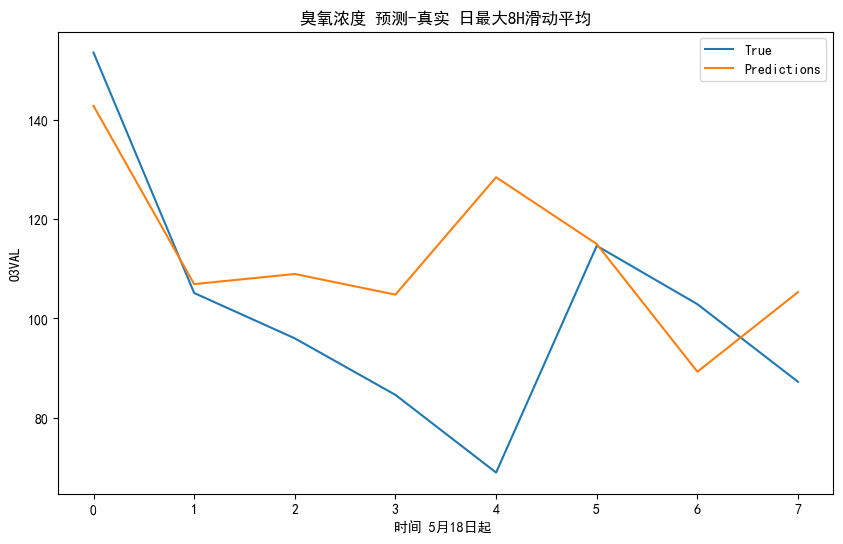

rmse: 24.32475999174719
r2 score: -0.06002722858556431
rmse: 7.685435493905006
r2 score: 0.8990386849406115
rmse: 9.759662966151511
r2 score: 0.8503820903887866
rmse: 13.159391522420176
r2 score: 0.7486439577163331
rmse: 29.060428046338853
r2 score: -0.03283732759716429
rmse: 26.528803837618547
r2 score: 0.001400311891126771


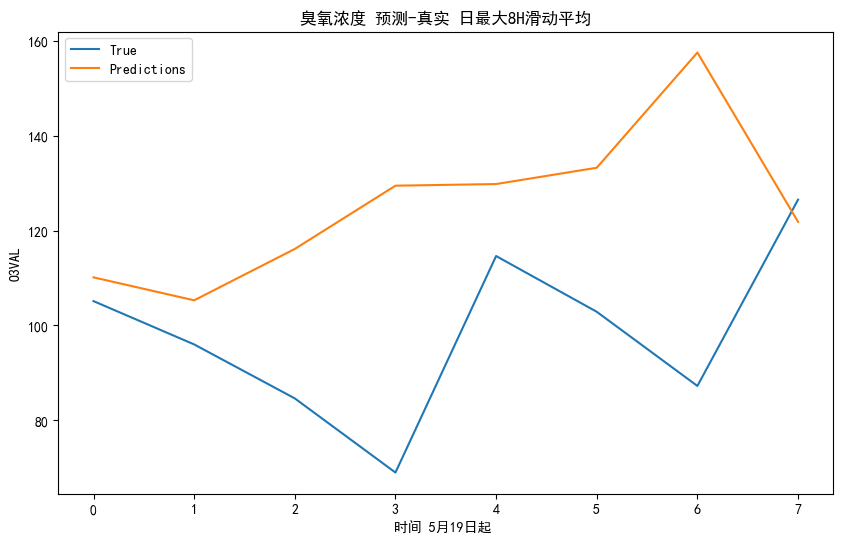

rmse: 36.85386560942349
r2 score: -3.719838967414705
rmse: 7.46279725787984
r2 score: -1.6754542663779373
rmse: 19.17640897906853
r2 score: -4.229229371636796
rmse: 34.485989240559185
r2 score: -5.536628898348771
rmse: 31.58229198344212
r2 score: -2.9394383428792863
rmse: 31.380712184237126
r2 score: -3.430920921948543


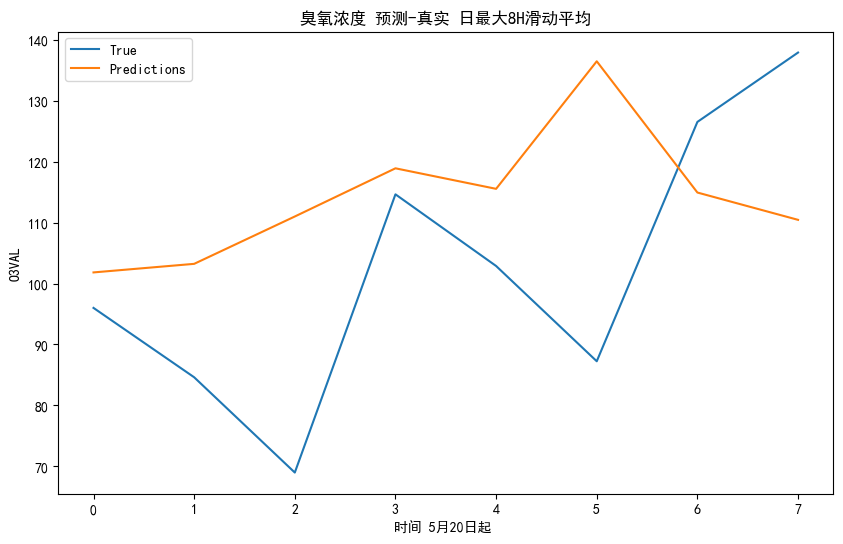

rmse: 26.52336375384924
r2 score: -0.5247948552398505
rmse: 13.780442963167857
r2 score: -4.870614142597193
rmse: 26.72679705178943
r2 score: -4.831032114353095
rmse: 23.2441944417997
r2 score: -0.9509273913358414
rmse: 21.54637026567058
r2 score: -0.9035937802099336
rmse: 28.110352850524855
r2 score: -2.7893766533510305


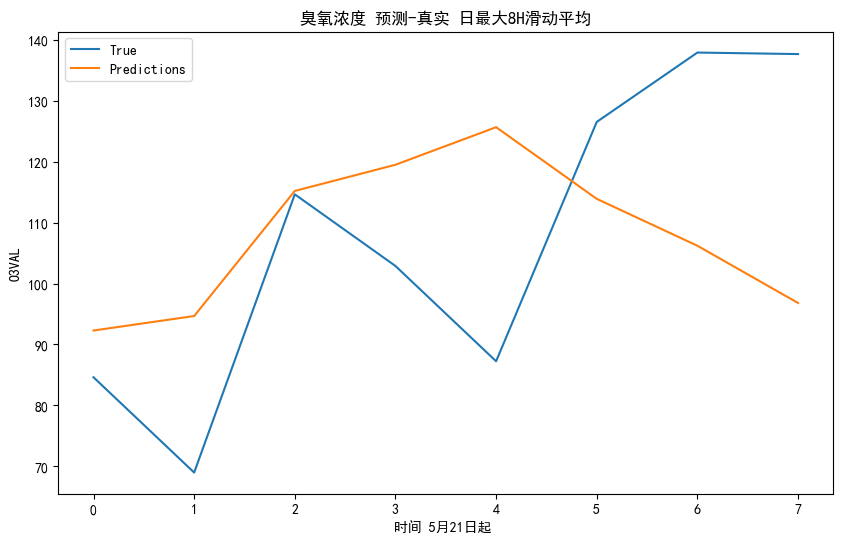

rmse: 25.729288733464866
r2 score: -0.13189016602559311
rmse: 18.942888791049295
r2 score: -4.879120457729
rmse: 15.470110271696813
r2 score: 0.33227995346363526
rmse: 15.759656626413106
r2 score: 0.17970223604459623
rmse: 22.212149118344865
r2 score: -0.9965484603120536
rmse: 20.9209756455205
r2 score: -0.16912393719215424


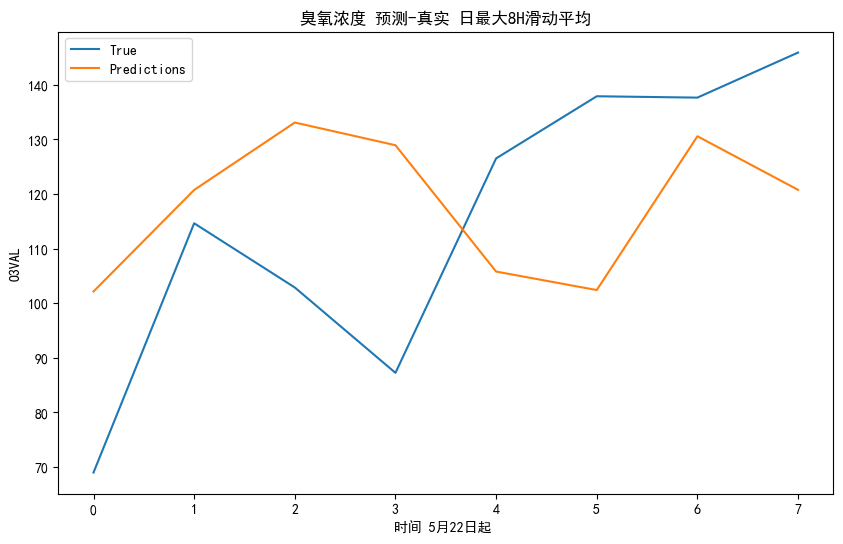

rmse: 27.729097590552463
r2 score: -0.19358699088555742
rmse: 23.825747198189294
r2 score: -0.09080544016001801
rmse: 26.121007518013073
r2 score: -0.8236900420576654
rmse: 30.751838135236508
r2 score: -2.2235648056100623
rmse: 29.022995817084407
r2 score: -1.056524123009217
rmse: 30.193682381539407
r2 score: -0.6881356401048184


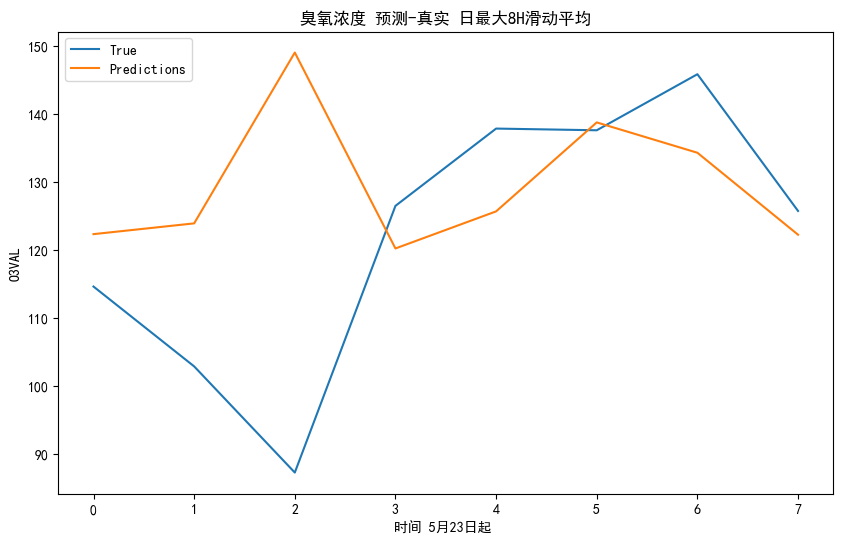

rmse: 24.131068338575282
r2 score: -0.7079637063811319
rmse: 15.850966084513171
r2 score: -6.279402468081828
rmse: 37.96259388342744
r2 score: -10.462087705258519
rmse: 33.02566032369783
r2 score: -4.176354264714499
rmse: 30.037699207786822
r2 score: -1.8811002900136176
rmse: 27.42461840755756
r2 score: -1.2144053170694584


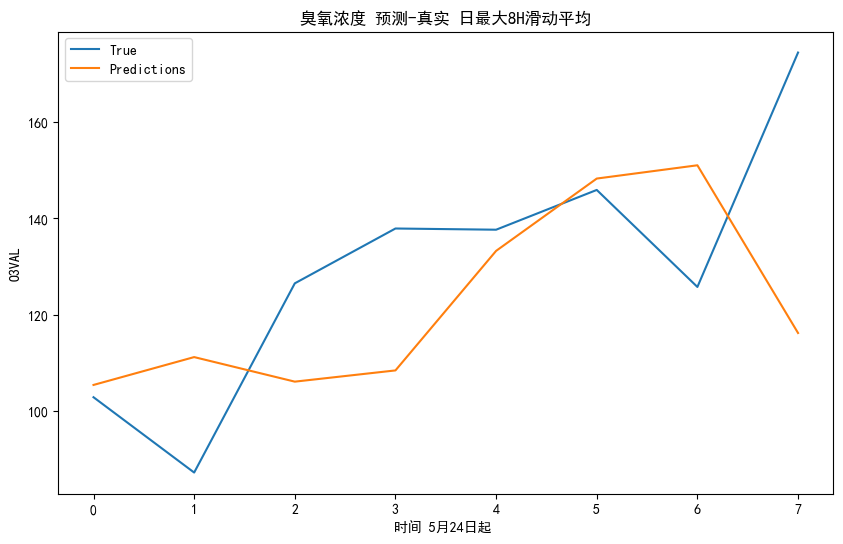

rmse: 27.17758544331936
r2 score: -0.19747752203230284
rmse: 17.031541210746813
r2 score: -3.7525625202830044
rmse: 18.221008834743813
r2 score: -0.27539297770169635
rmse: 21.57930580120994
r2 score: -0.19017799513494182
rmse: 19.400763773364382
r2 score: 0.07102421539334092
rmse: 17.736609624679
r2 score: 0.2887333298654603


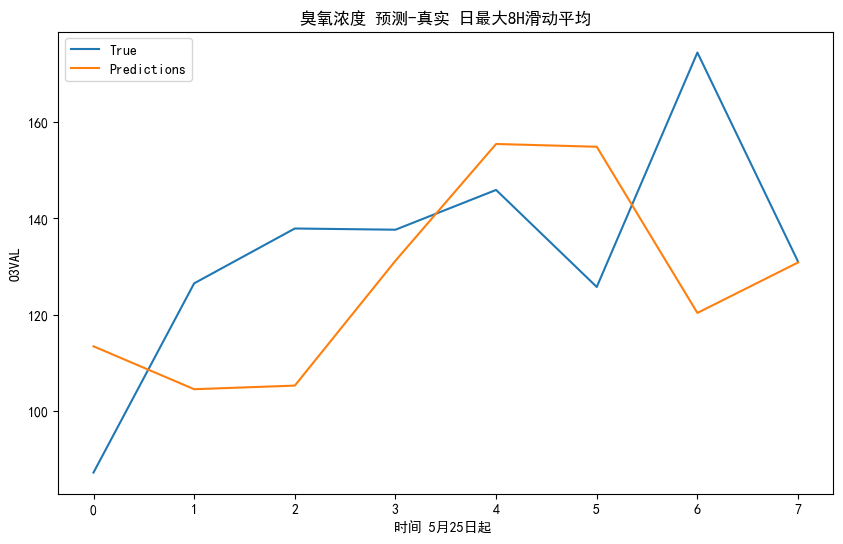

rmse: 27.67183673971428
r2 score: -0.4890041221395913
rmse: 24.167053890480872
r2 score: -0.5164499817317549
rmse: 27.265411503672087
r2 score: -0.5806451585133916
rmse: 23.831005480208052
r2 score: -0.31799496398854843
rmse: 21.73731629760342
r2 score: -0.08987430942386254
rmse: 23.12426707331422
r2 score: -0.47914396133407444


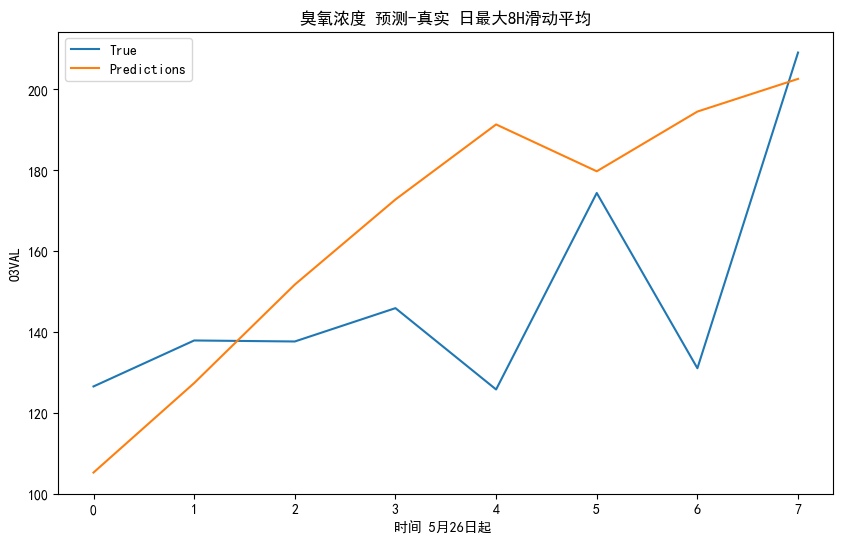

rmse: 35.16799556799492
r2 score: -0.6796299850567213
rmse: 16.8111166975042
r2 score: -7.736758002895636
rmse: 15.953804973531648
r2 score: -8.046387908483666
rmse: 19.278926764222994
r2 score: -6.817867953753884
rmse: 34.024244312170296
r2 score: -18.900710419911086
rmse: 31.13690432029464
r2 score: -2.6334742402667763


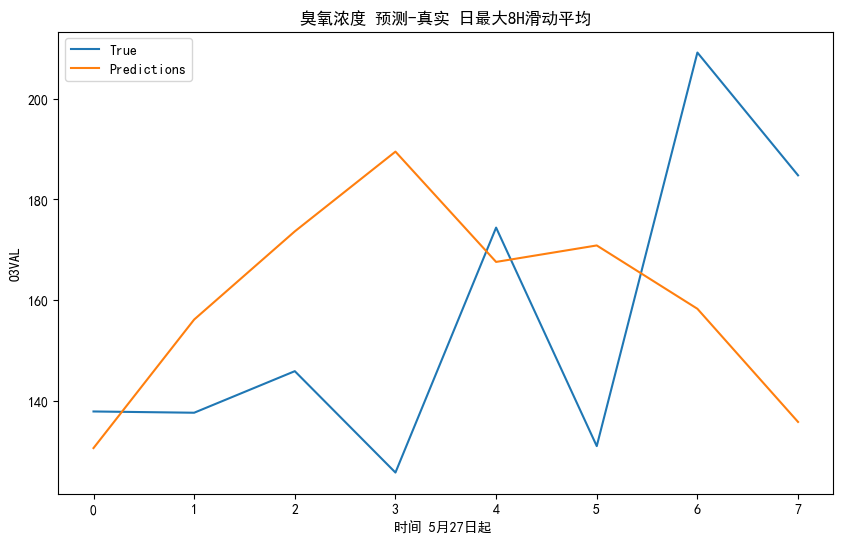

rmse: 38.47125681128885
r2 score: -0.8809435419827982
rmse: 14.05304499954363
r2 score: -12638.236720588688
rmse: 19.706912285292812
r2 score: -25.45420265946658
rmse: 36.137210437199755
r2 score: -24.321230987082952
rmse: 32.46538350540556
r2 score: -2.941885768285654
rmse: 33.80493965091491
r2 score: -3.619342242631032


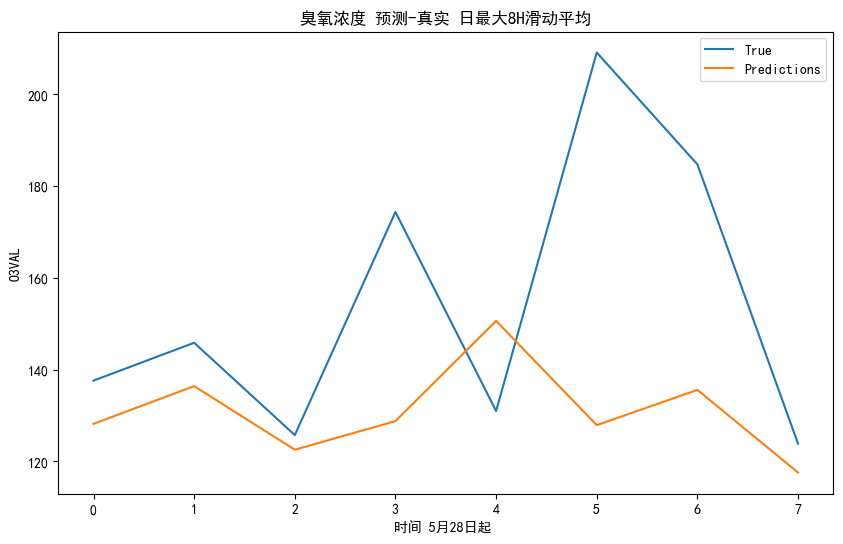

rmse: 38.24278328356112
r2 score: -0.6790717909965058
rmse: 9.43588169389594
r2 score: -4.232594356140343
rmse: 7.921021235916607
r2 score: 0.08046092835405583
rmse: 23.797783949808842
r2 score: -0.7624643266196274
rmse: 23.026088050032445
r2 score: -0.8119319446129429
rmse: 39.25333128767522
r2 score: -0.8073777141186349


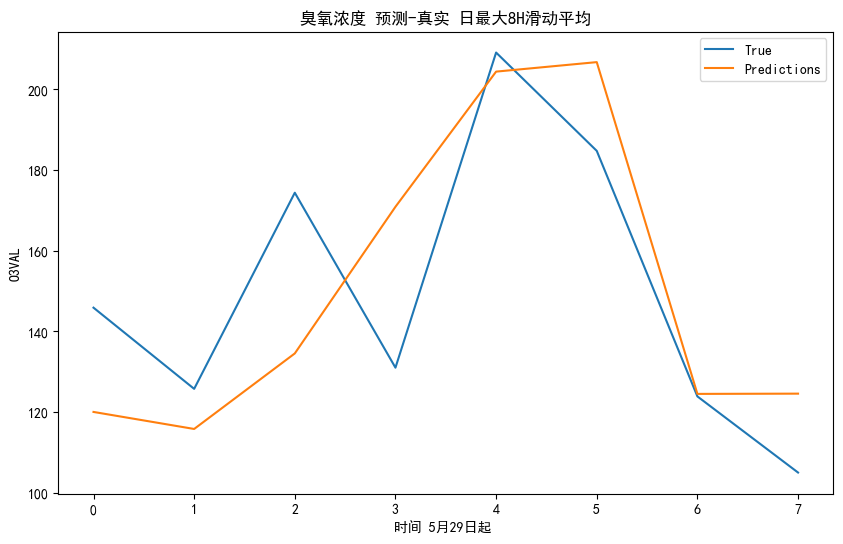

rmse: 24.584148707142244
r2 score: 0.4610396313851398
rmse: 19.583933429692756
r2 score: -2.7878089130871184
rmse: 28.01512871510955
r2 score: -0.9721677456672182
rmse: 31.40708825096341
r2 score: -1.763100221636654
rmse: 28.170779568964363
r2 score: 0.172475573785424
rmse: 27.239669126640358
r2 score: 0.17955734844824767


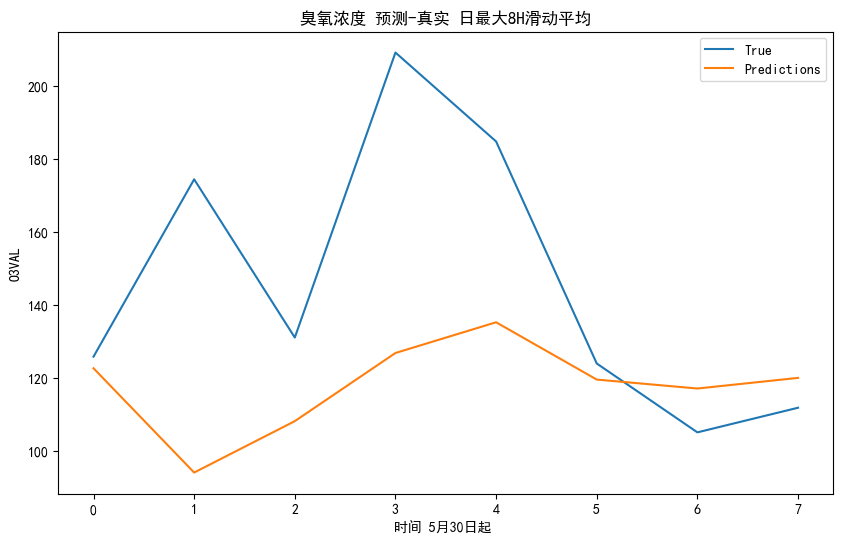

rmse: 45.37519265090932
r2 score: -0.6039162923860464
rmse: 56.89132895976779
r2 score: -4.475615199258393
rmse: 48.300910658202085
r2 score: -3.9134361666328816
rmse: 58.70072361818495
r2 score: -1.9743718681215934
rmse: 56.992067397190425
r2 score: -2.1710201379771874
rmse: 52.057451387991975
r2 score: -1.489675464630901


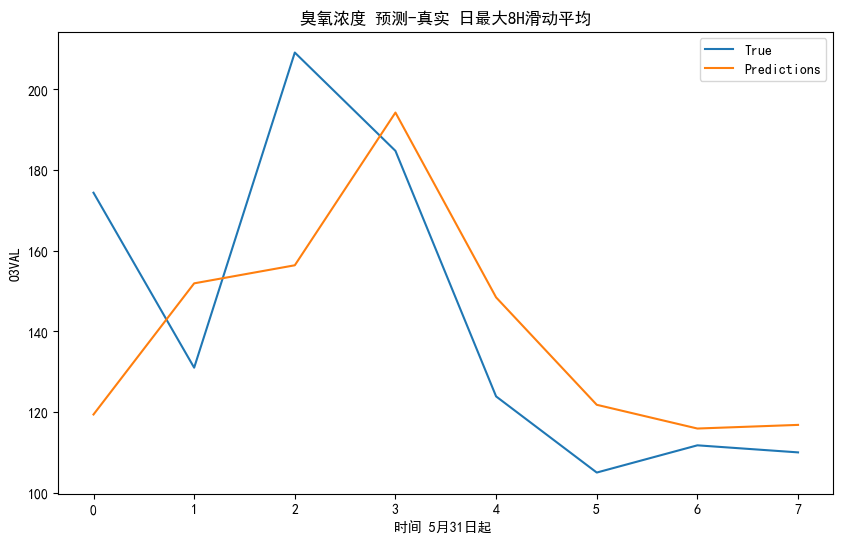

rmse: 30.167234478479177
r2 score: 0.34498355352250865
rmse: 41.59396762782185
r2 score: -2.678253989437822
rmse: 45.613021983638816
r2 score: -1.0369859805418713
rmse: 39.78643490386816
r2 score: -0.9812835239501358
rmse: 37.24114006781097
r2 score: -0.3154645659648847
rmse: 34.68120331545479
r2 score: 0.12356265675499944


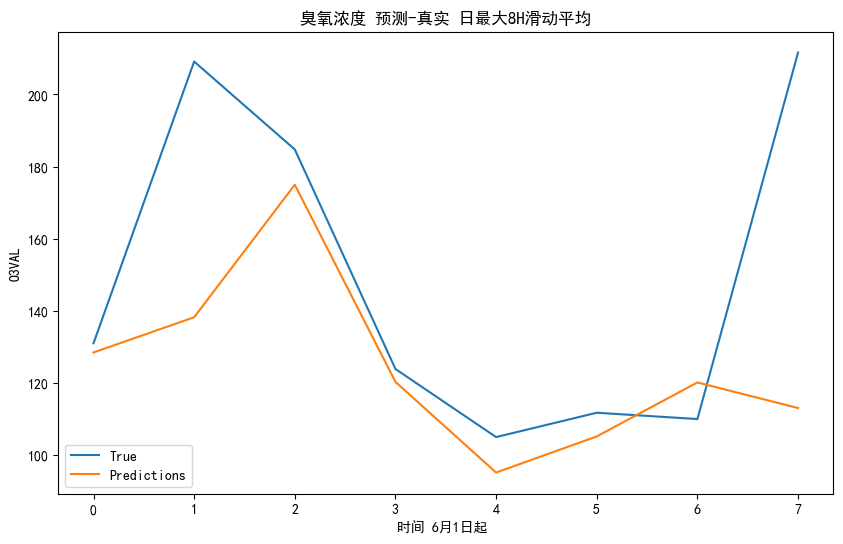

rmse: 43.445901638283324
r2 score: -0.03343488867753397
rmse: 50.16153704471514
r2 score: -0.6490035928683835
rmse: 41.3437111556328
r2 score: -0.6046910804683374
rmse: 35.84920632342832
r2 score: 0.002336782971766427
rmse: 32.3647646491904
r2 score: 0.32586318867137753
rmse: 29.666510925734286
r2 score: 0.4156373638346825


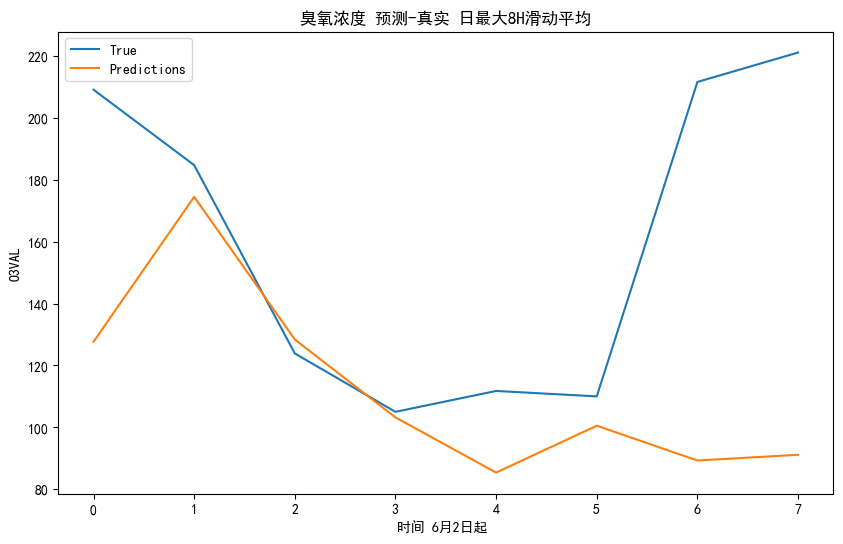

rmse: 70.2002342882828
r2 score: -1.1213842126169178
rmse: 58.07217093606846
r2 score: -21.70423462275756
rmse: 47.48747699128675
r2 score: -0.7545363361350677
rmse: 41.13518229200979
r2 score: 0.07045849604538912
rmse: 38.63628393231581
r2 score: 0.1543242979407664
rmse: 35.48180163876521
r2 score: 0.2416318672564688


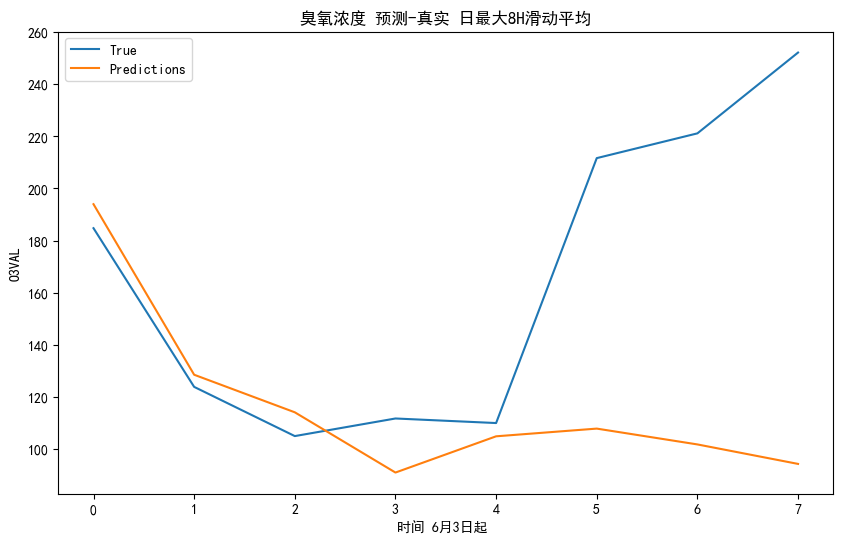

rmse: 79.49103296411761
r2 score: -1.0669548601404752
rmse: 7.295823400022115
r2 score: 0.9425446242739
rmse: 7.951001986371764
r2 score: 0.9454077168241181
rmse: 12.447514281843587
r2 score: 0.8445119914544653
rmse: 11.363331499239413
r2 score: 0.8515924790616798
rmse: 43.6097849388572
r2 score: -0.10703402443188237


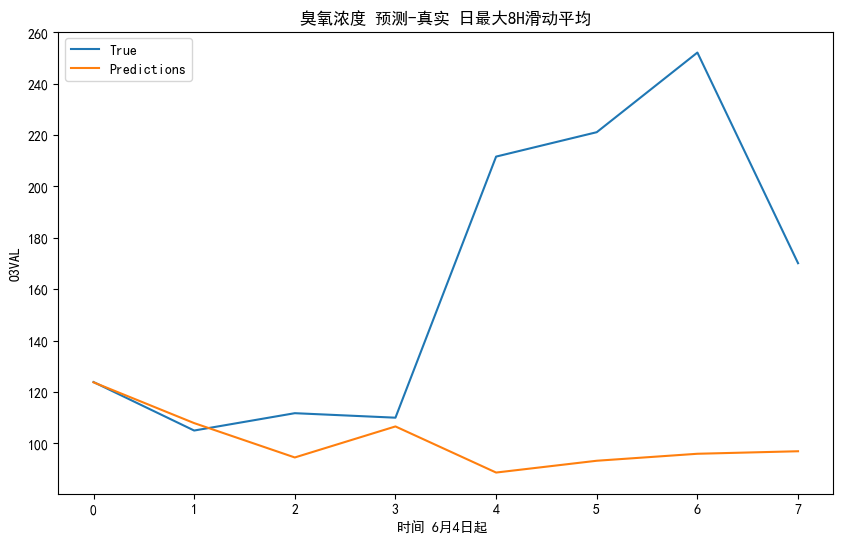

rmse: 87.70826819822865
r2 score: -1.5571150245860963
rmse: 2.046805009379526
r2 score: 0.9529630651689046
rmse: 10.088592696502564
r2 score: -0.6689947245701966
rmse: 8.901680301201255
r2 score: -0.6477808029005039
rmse: 55.57184012474999
r2 score: -0.9233620304976422
rmse: 72.7966937727282
r2 score: -1.1806685267810946


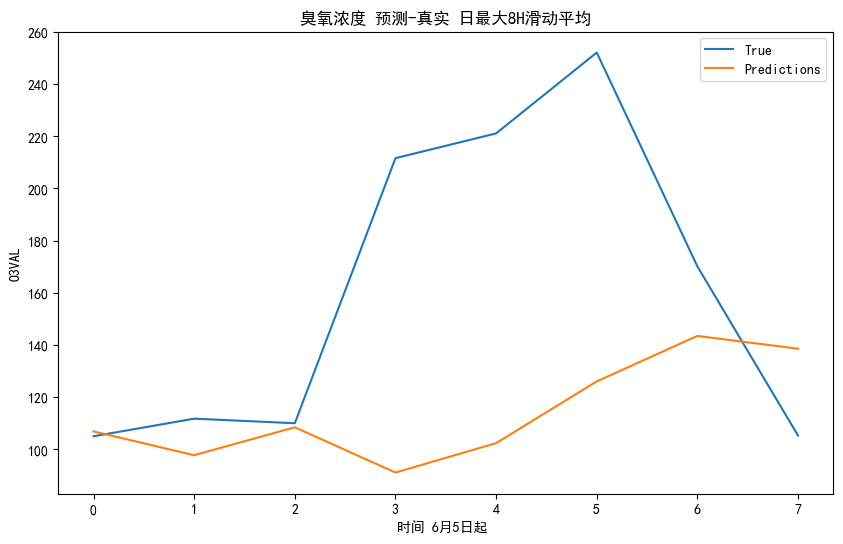

rmse: 76.28216536399937
r2 score: -0.8018564625028843
rmse: 9.998576564583882
r2 score: -7.776650387300611
rmse: 8.213059098084235
r2 score: -7.245691785909925
rmse: 60.686861361555906
r2 score: -0.8562294292403265
rmse: 75.94078317012351
r2 score: -1.0705260455031604
rmse: 86.34381315656019
r2 score: -1.006141367609895


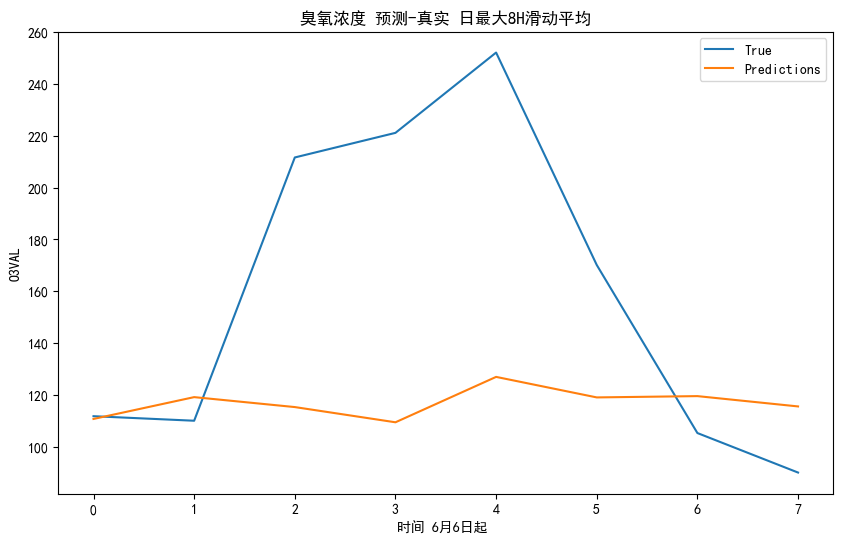

rmse: 71.58298182232187
r2 score: -0.47943388591879854
rmse: 6.487961565467577
r2 score: -53.979455053040965
rmse: 55.87873507072864
r2 score: -0.3839400438825693
rmse: 73.90824997721448
r2 score: -0.9548985354312782
rmse: 86.63115066942322
r2 score: -1.1513164754202947
rmse: 81.7907187817769
r2 score: -1.2874441237562144


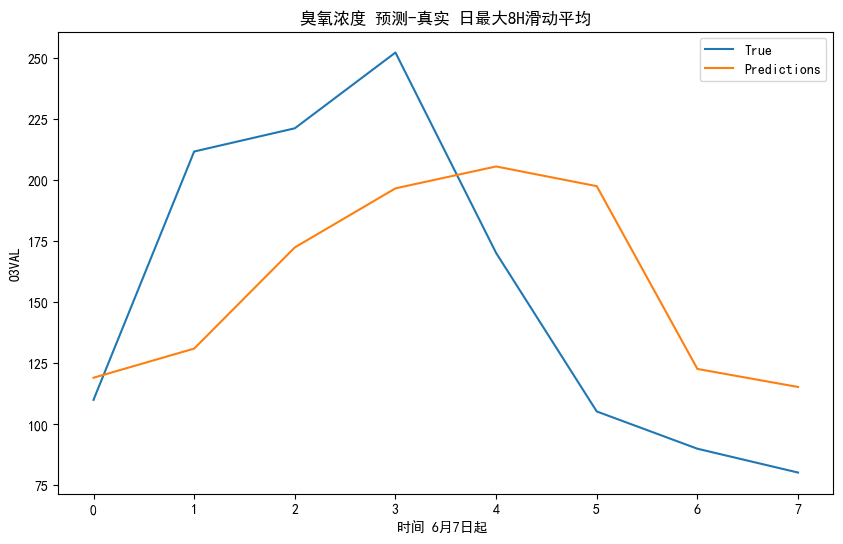

rmse: 54.88206113591579
r2 score: 0.2363350749779809
rmse: 57.386830961680815
r2 score: -0.27550850669710547
rmse: 54.65778601992517
r2 score: -0.18099302146749596
rmse: 54.88884631996599
r2 score: -0.05787348113798685
rmse: 51.581124523074386
r2 score: -0.10436087148256656
rmse: 60.28226146499324
r2 score: -0.18096258678936583


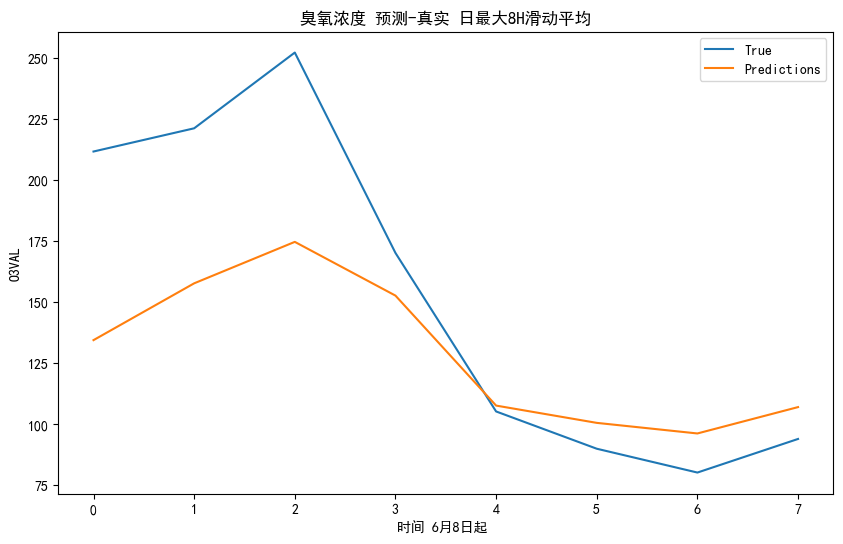

rmse: 45.87113728907742
r2 score: 0.4932712998607677
rmse: 70.64835039737737
r2 score: -220.2161513072847
rmse: 72.99488925089173
r2 score: -16.816936544956175
rmse: 63.815644280776105
r2 score: -3.7427155512349257
rmse: 57.08858298800706
r2 score: -0.26788931231349933
rmse: 52.29321849722125
r2 score: 0.23795958651666382


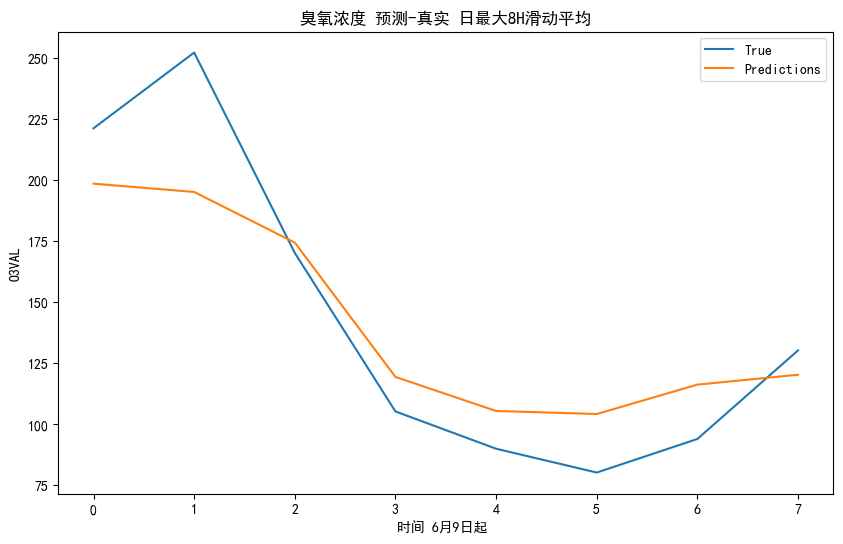

rmse: 25.959475424793993
r2 score: 0.8171413700569901
rmse: 43.40259439137231
r2 score: -6.840937356511897
rmse: 35.52194092942927
r2 score: -0.10405158337009124
rmse: 31.56320902676721
r2 score: 0.6779455382718007
rmse: 29.06366070306301
r2 score: 0.7880308235013348
rmse: 28.276296212500505
r2 score: 0.8176041104057034


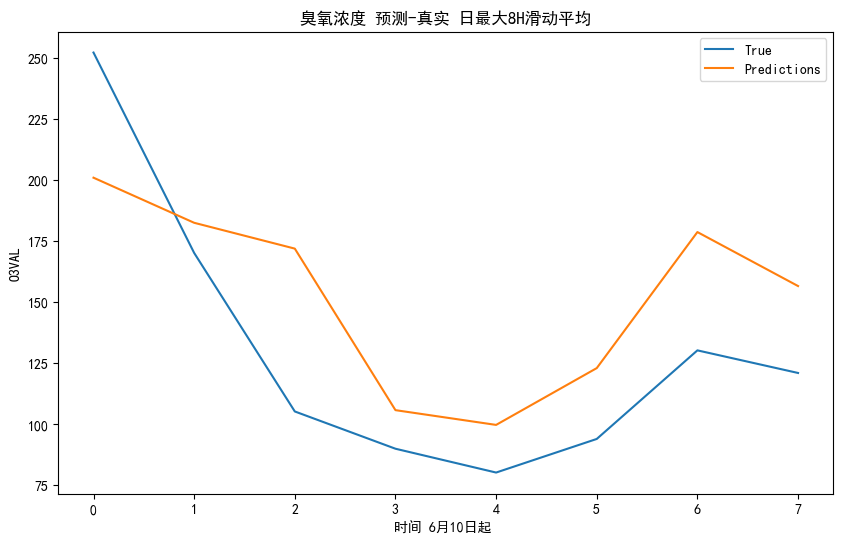

rmse: 39.20242407657679
r2 score: 0.4557026120082337
rmse: 37.24817162394408
r2 score: 0.17464230260155067
rmse: 49.04253423280914
r2 score: 0.3340559709264608
rmse: 43.19922291086993
r2 score: 0.543737833060151
rmse: 39.6102038413016
r2 score: 0.6220472677277868
rmse: 38.04689718446334
r2 score: 0.6137272857125531


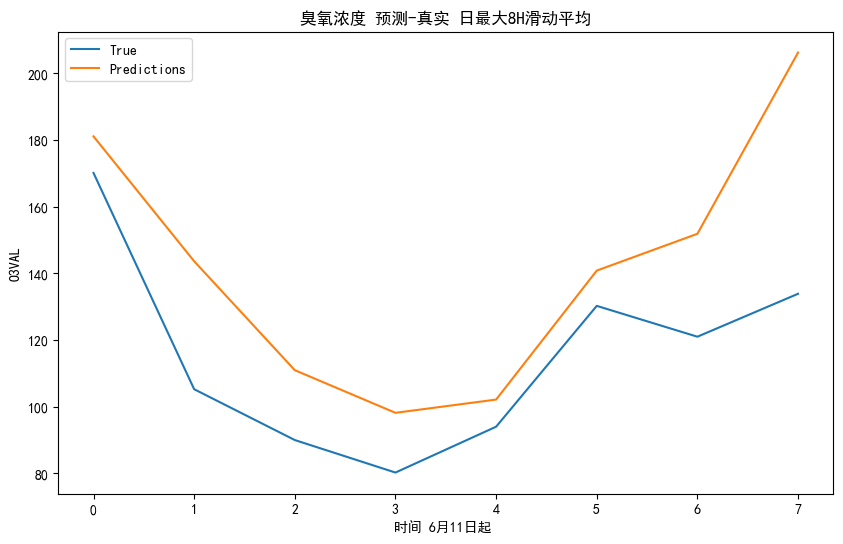

rmse: 33.01952625947067
r2 score: -0.4466307054697751
rmse: 28.23219797188245
r2 score: 0.2424790797671813
rmse: 26.034350008096265
r2 score: 0.43836724409937244
rmse: 24.26112487407071
r2 score: 0.5209485574862411
rmse: 22.003112212740483
r2 score: 0.5306123852771786
rmse: 20.545110849363844
r2 score: 0.545512433101488


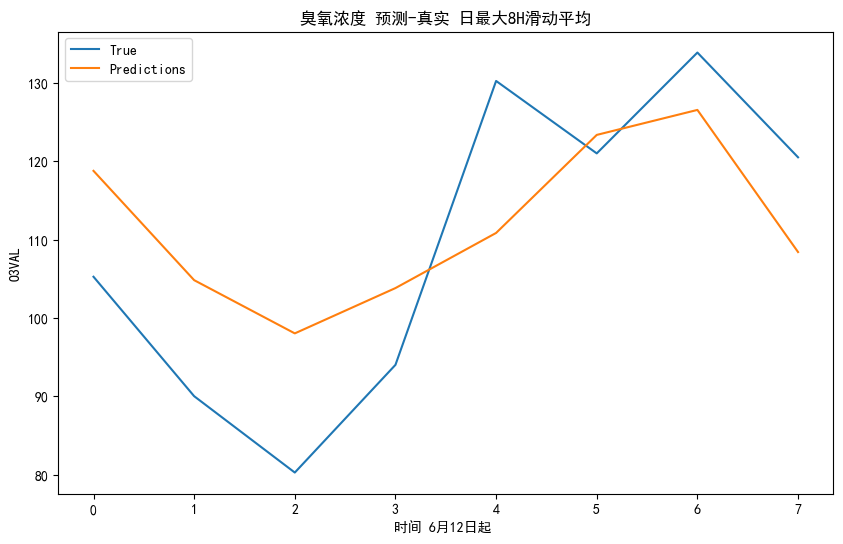

rmse: 13.211161985337336
r2 score: 0.4962888664069809
rmse: 14.181576348455454
r2 score: -2.4591493938544886
rmse: 15.469855982691138
r2 score: -1.260961025720345
rmse: 14.26583323158652
r2 score: -1.5355062991341346
rmse: 15.43193020849165
r2 score: 0.189254021618952
rmse: 14.120249735319883
r2 score: 0.34910980616425036


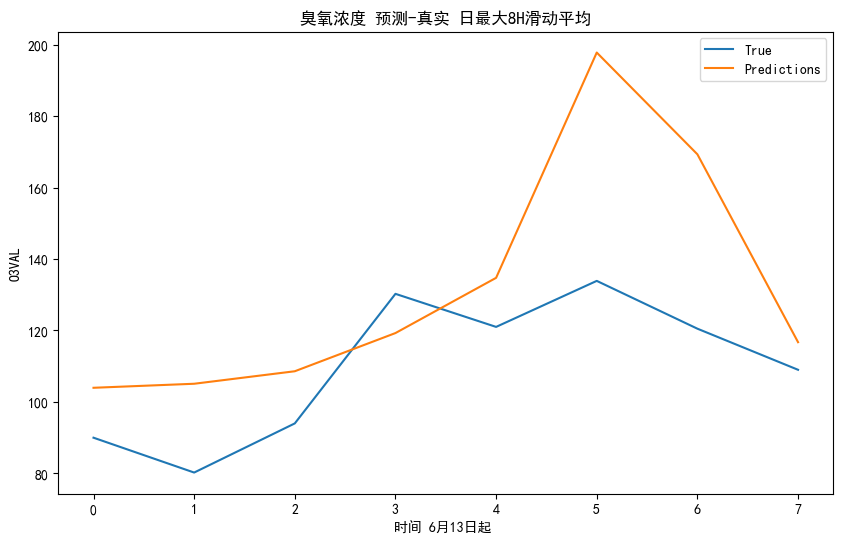

rmse: 31.334466263324973
r2 score: -1.8529339352724739
rmse: 20.152601033257852
r2 score: -16.08885537012662
rmse: 18.48552557235939
r2 score: -9.247170016417082
rmse: 16.923115352441187
r2 score: 0.2008947409491233
rmse: 16.334004078219845
r2 score: 0.2726587265316235
rmse: 30.041588667258477
r2 score: -1.064167124862331


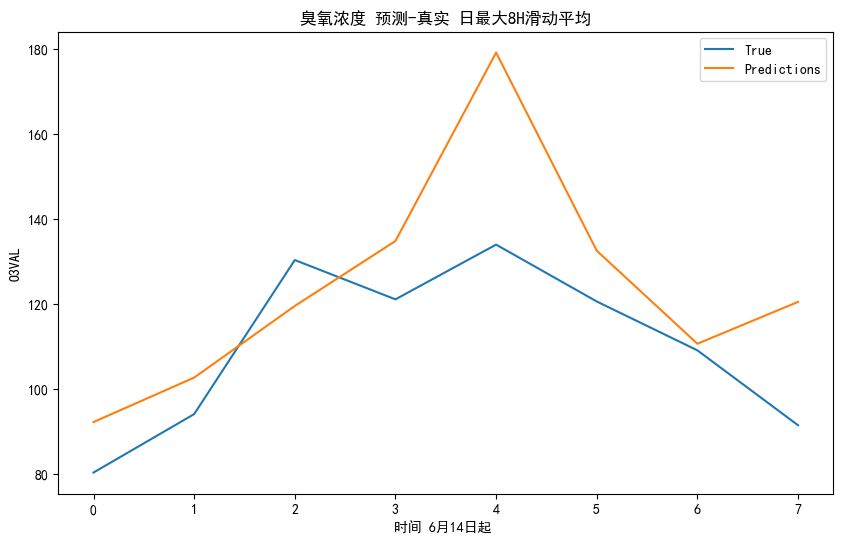

rmse: 21.06453741456683
r2 score: -0.31457719896838654
rmse: 10.36657862536287
r2 score: -1.273659819283683
rmse: 10.51489482353398
r2 score: 0.7514274177424299
rmse: 11.403071435564364
r2 score: 0.6788514474382212
rmse: 22.63718567312946
r2 score: -0.15178192386084355
rmse: 21.232040890729444
r2 score: -0.18291391721355588


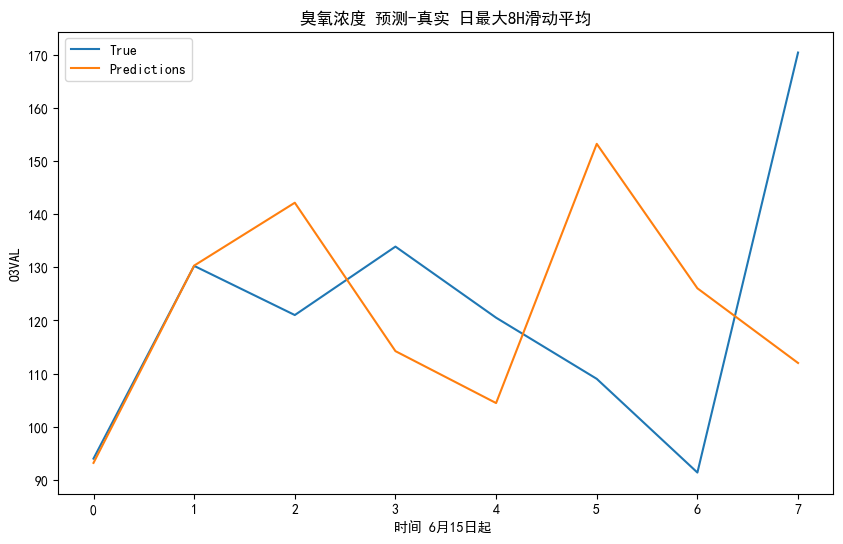

rmse: 30.93484889630915
r2 score: -0.7244924088776672
rmse: 0.5731222752546316
r2 score: 0.9990001414928344
rmse: 12.206738234906593
r2 score: 0.36999700509964184
rmse: 14.436202880579996
r2 score: 0.14447128804621268
rmse: 14.774024590461456
r2 score: -0.11957223327636335
rmse: 22.5286454931725
r2 score: -1.8347240363723771


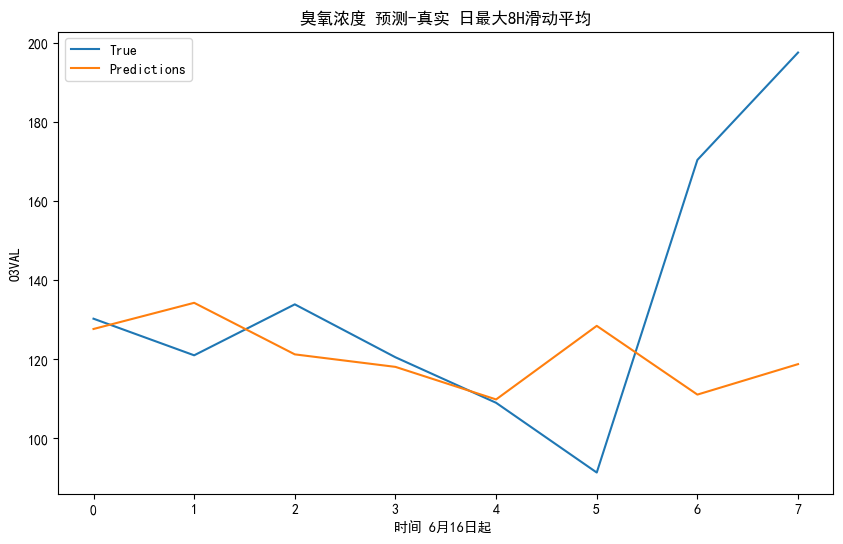

rmse: 37.81263121218843
r2 score: -0.4013872221474324
rmse: 9.557545271256295
r2 score: -3.270406854035988
rmse: 10.683431846600579
r2 score: -2.88409384544917
rmse: 9.331204905449265
r2 score: -1.5862537556832481
rmse: 8.354740124070497
r2 score: 0.0743710046313022
rmse: 16.94609054668589
r2 score: -0.4280526574026433


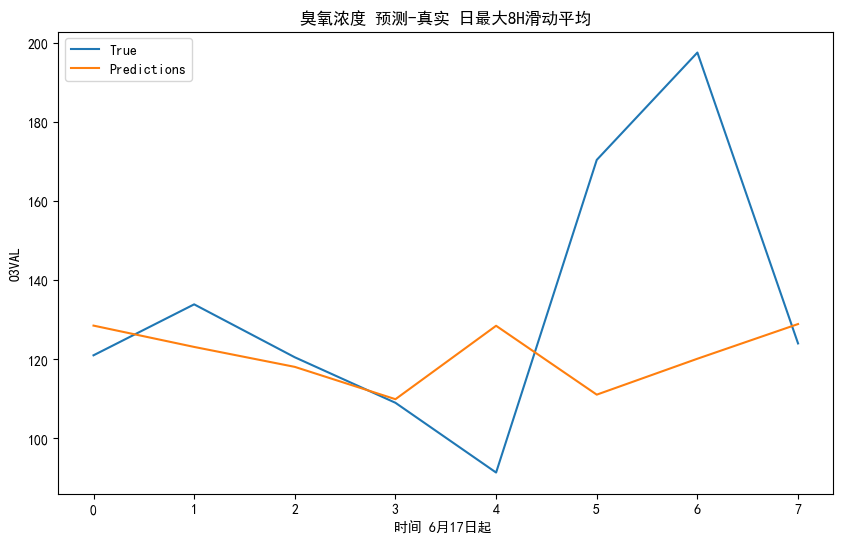

rmse: 37.21881814687809
r2 score: -0.343889890370195
rmse: 9.276343082136481
r2 score: -1.0764387303459655
rmse: 7.702369199193325
r2 score: -0.548068269351855
rmse: 6.685942181784398
r2 score: 0.4231659428295652
rmse: 17.631043133974433
r2 score: -0.5289734553582519
rmse: 29.076505813465314
r2 score: -0.42568747204902535


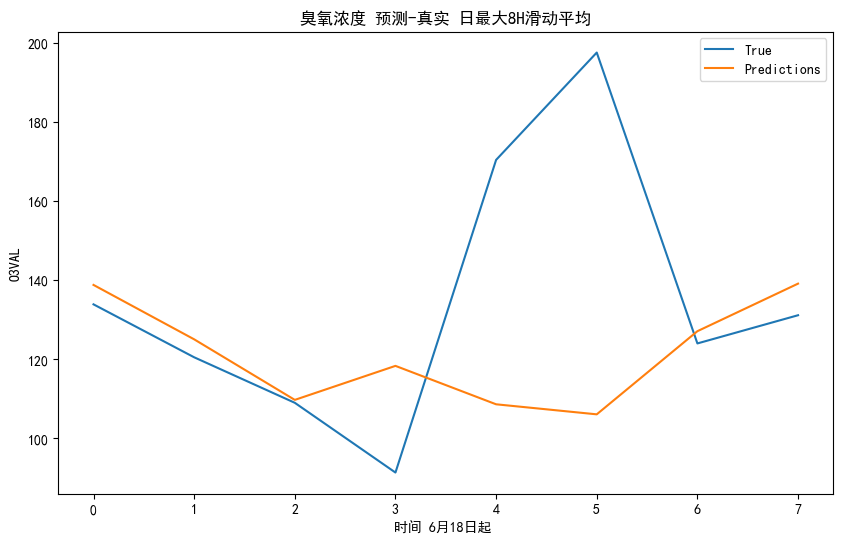

rmse: 40.33546091937669
r2 score: -0.6101077434766327
rmse: 4.728105032133109
r2 score: 0.5001420069971262
rmse: 3.8837058926958434
r2 score: 0.8540191087557012
rmse: 13.89088570469343
r2 score: 0.20737926783621563
rmse: 30.283248632357612
r2 score: -0.29364343115977776
rmse: 46.444011568451266
r2 score: -0.6337686806152913


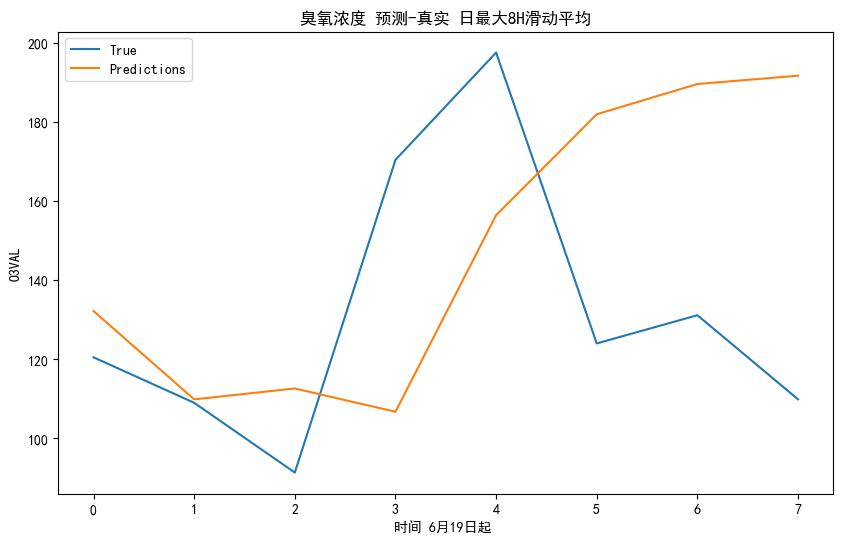

rmse: 49.72753367457792
r2 score: -1.2927919398236627
rmse: 8.291349047165188
r2 score: -1.0792882879977936
rmse: 14.008478641009233
r2 score: -0.36787260606182026
rmse: 34.051657373748085
r2 score: -0.3456759738612232
rmse: 35.57493981998188
r2 score: 0.19993593349827854
rmse: 40.169073134571214
r2 score: -0.20014895910247277


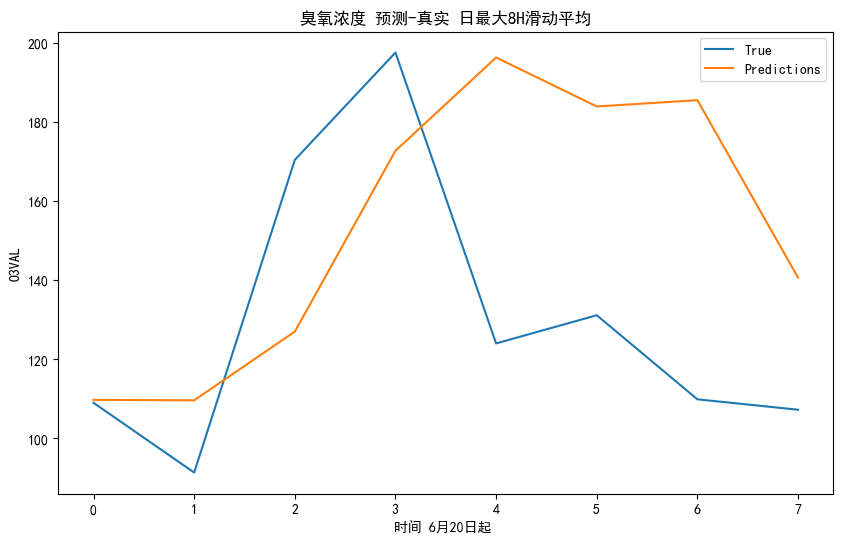

rmse: 46.98802547136509
r2 score: -0.9454580807232262
rmse: 12.914350121015818
r2 score: -1.1475676473182639
rmse: 27.18025907744146
r2 score: 0.3556351974365006
rmse: 26.609197479632826
r2 score: 0.6242407123551
rmse: 40.130498175866144
r2 score: -0.03257334125808087
rmse: 42.49496375771641
r2 score: -0.38148117453377073


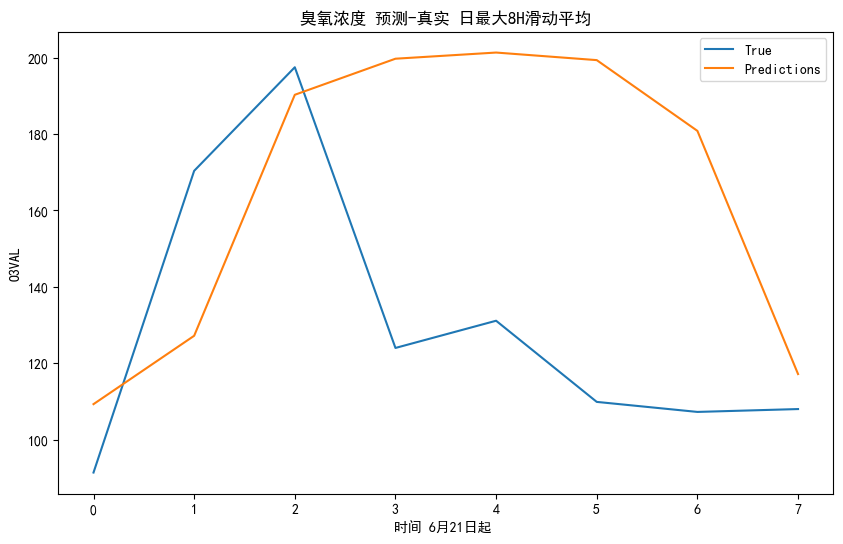

rmse: 57.45984219414528
r2 score: -1.895504962312915
rmse: 33.059562049736066
r2 score: 0.29951312743448233
rmse: 27.31208452954682
r2 score: 0.6319180805360958
rmse: 44.64775465568337
r2 score: -0.18759621350295785
rmse: 50.80370526466869
r2 score: -0.8739087236714334
rmse: 59.03923278654693
r2 score: -1.683243403727214


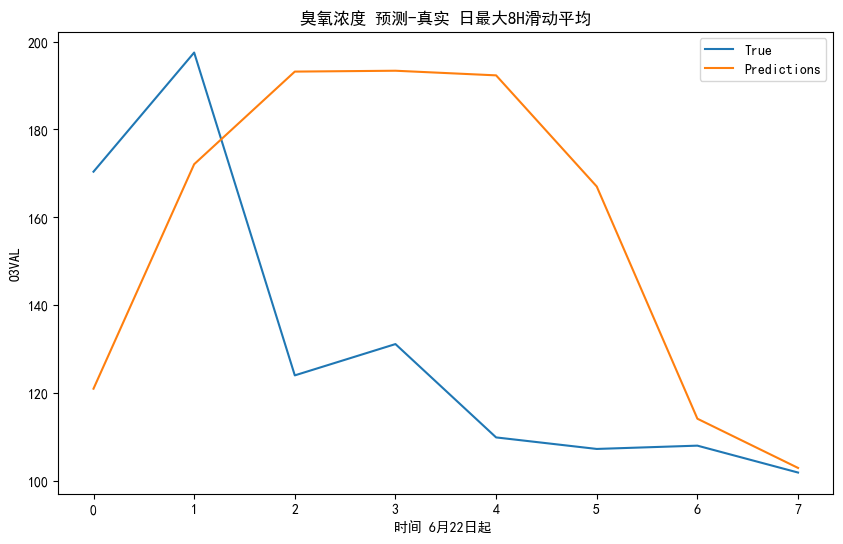

rmse: 52.61697573948412
r2 score: -1.6339668901746016
rmse: 39.29111421344743
r2 score: -7.392844697707481
rmse: 51.2221506499095
r2 score: -1.848878966939692
rmse: 54.18564073498704
r2 score: -2.2884342539985045
rmse: 60.89205902497224
r2 score: -2.5279063964336035
rmse: 60.70372931684142
r2 score: -2.3787534838119577


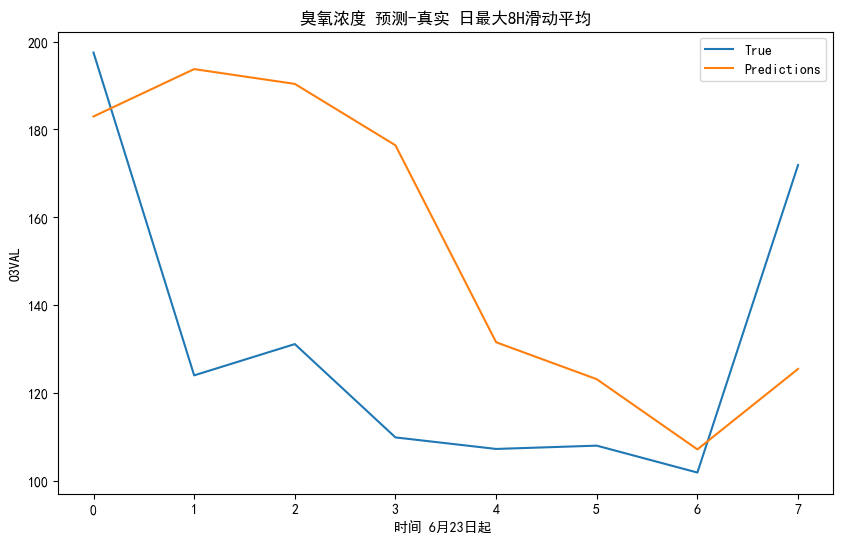

rmse: 44.73240705373485
r2 score: -0.8770790279560681
rmse: 50.370407095915034
r2 score: -0.8786082917363747
rmse: 53.49086295735224
r2 score: -1.6120650853710559
rmse: 57.02524532360341
r2 score: -1.8607002009566505
rmse: 52.14912679585404
r2 score: -1.5004512626306026
rmse: 48.004340855568074
r2 score: -1.3047048290811976


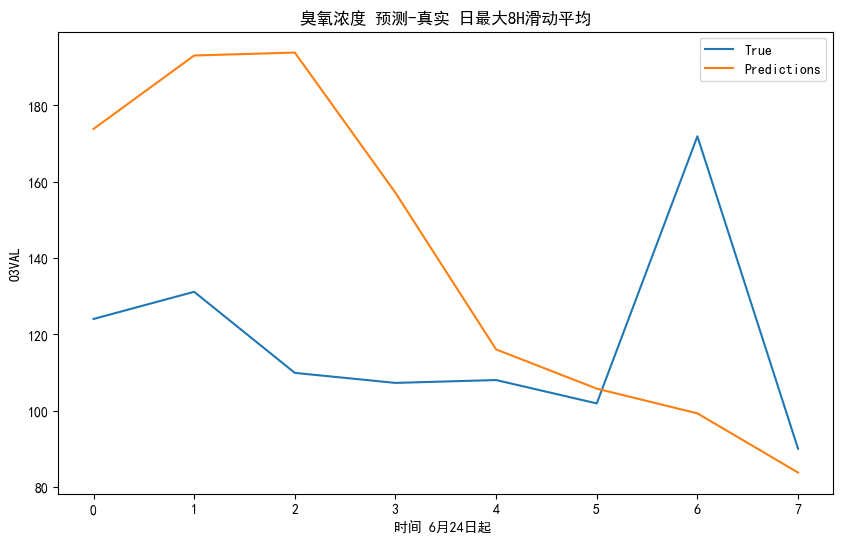

rmse: 51.51634631426232
r2 score: -3.785770251741134
rmse: 56.18002120881793
r2 score: -247.68755446412663
rmse: 66.72990618265213
r2 score: -56.10091941733469
rmse: 62.93102315220194
r2 score: -39.63651051327275
rmse: 56.401525495707084
r2 score: -32.78208305250445
rmse: 51.511528944463194
r2 score: -23.94326843293963


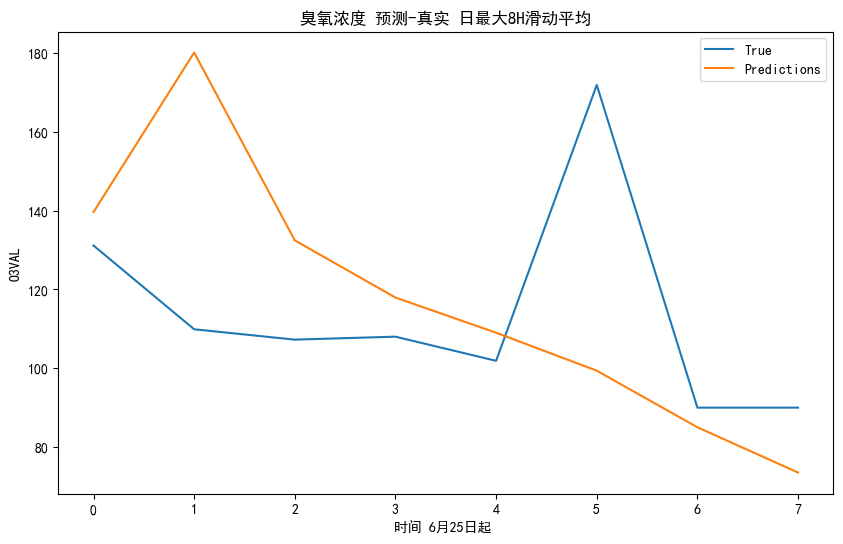

rmse: 37.6461884675593
r2 score: -1.2496359630109786
rmse: 50.0055369368945
r2 score: -21.15023368279802
rmse: 43.3400246267489
r2 score: -15.43727105157528
rmse: 37.86002174781
r2 score: -13.63275508101565
rmse: 34.0127936140037
r2 score: -10.327288459005553
rmse: 42.89855142789066
r2 score: -2.122914348893299


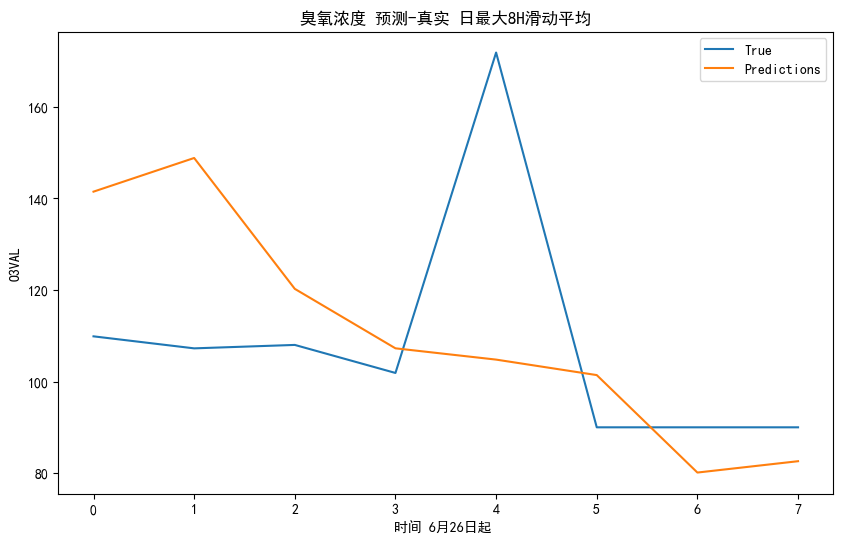

rmse: 31.005292381174247
r2 score: -0.5107387777542223
rmse: 36.93851891289361
r2 score: -791.0641041868911
rmse: 30.978077313866184
r2 score: -786.3979684626631
rmse: 26.96246780001907
r2 score: -81.27476369848306
rmse: 38.49139635848822
r2 score: -1.1607841857540913
rmse: 35.44508965668662
r2 score: -0.808941149489186


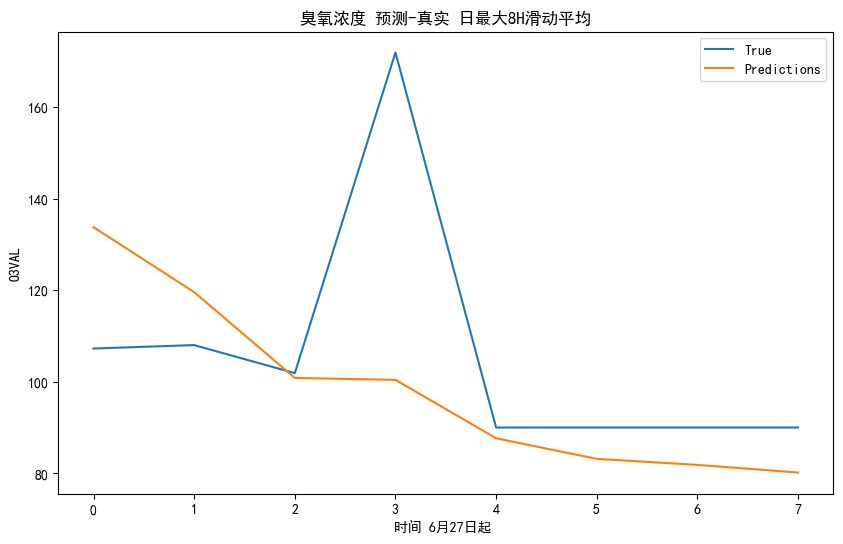

rmse: 27.748971559632842
r2 score: -0.1437205945427178
rmse: 20.43930044439447
r2 score: -2969.7733522220365
rmse: 16.69955331114167
r2 score: -36.478312304245854
rmse: 38.54991184688017
r2 score: -0.7981439121582585
rmse: 34.49607906704926
r2 score: -0.4379048169133317
rmse: 31.614238309601934
r2 score: -0.2779202084940371


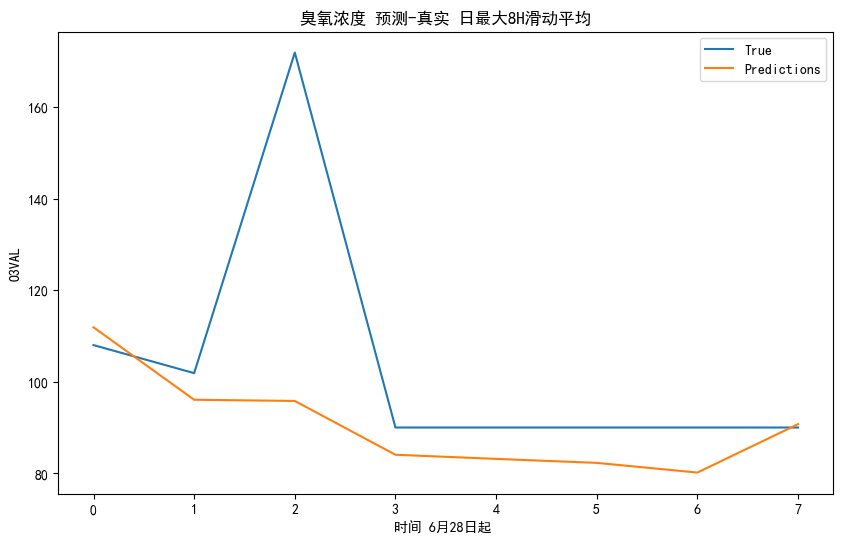

rmse: 27.55691731372845
r2 score: -0.08337835809274474
rmse: 4.943300518890678
r2 score: -1.6054445335845897
rmse: 44.10593914767746
r2 score: -0.9415518868190944
rmse: 38.3124436291346
r2 score: -0.4509701410932929
rmse: 34.404175257429756
r2 score: -0.2670390328925567
rmse: 31.564379542680772
r2 score: -0.17508158201096924


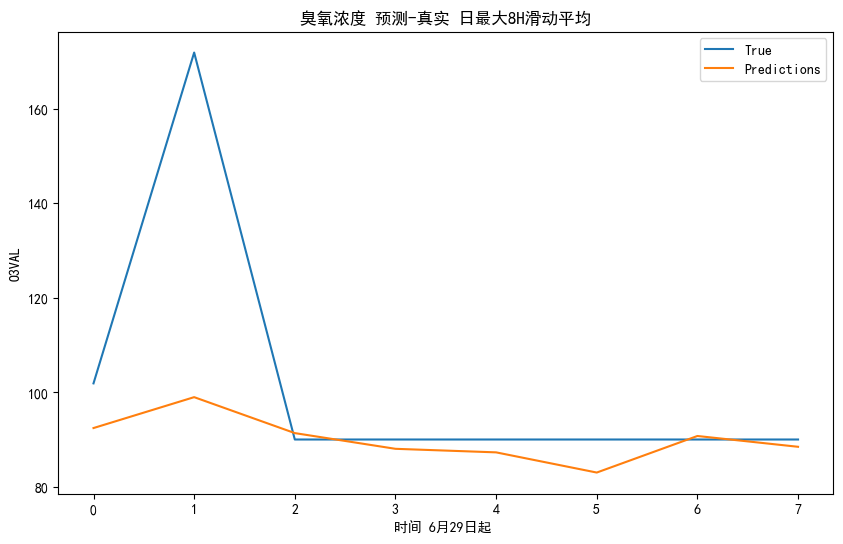

rmse: 26.150327305309602
r2 score: 0.04789181275907872
rmse: 51.98933980745668
r2 score: -1.2064420029511833
rmse: 42.45634033263249
r2 score: -0.38131247340866414
rmse: 36.78145010998334
r2 score: -0.16444824235171063
rmse: 32.92081976309526
r2 score: -0.06530400749422571
rmse: 30.187722781849764
r2 score: -0.016377185574973918


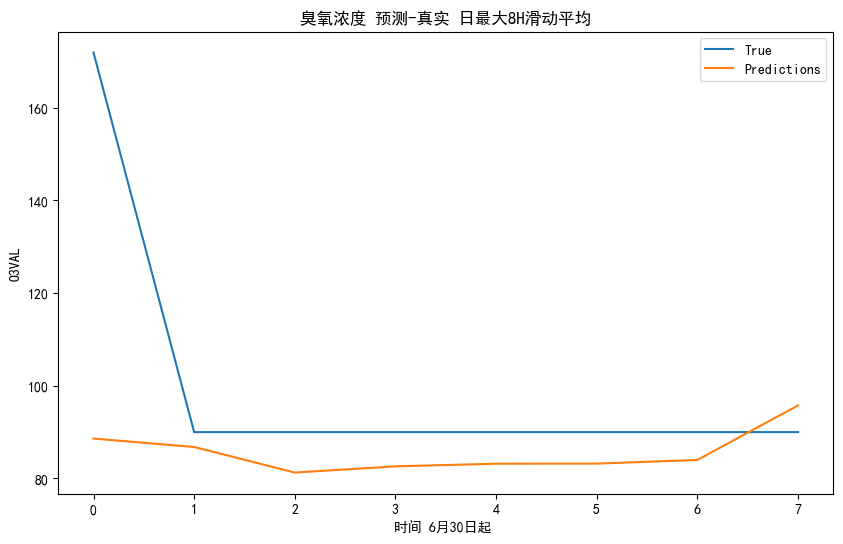

rmse: 30.07478031217293
r2 score: -0.23362804856230568
rmse: 58.92156657061874
r2 score: -1.0716001580951668
rmse: 48.37217374236296
r2 score: -0.570728399178762
rmse: 42.05390648789607
r2 score: -0.4070476049291085
rmse: 37.737469203067455
r2 score: -0.32777025287800465
rmse: 34.56086392205441
r2 score: -0.282918448971182


In [66]:
# 创建滑动窗口计算平均值的函数
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
def sliding_window_average(data, window_size):
    # 保存滑动平均值的列表
    averaged_data = []
    # 用滑动窗口计算平均值
    len1 = len(data)
    for i in range(len1 - window_size + 1):
        avg = np.mean(data[i:i + window_size])
        averaged_data.append(avg)
    return averaged_data


def max_values(data, interval):
    averaged_data = []
    for i in range(0, len(data), 24):
        avg = max(data[i:i+interval])
        averaged_data.append(avg)
    return averaged_data

# 使用滑动窗口大小为8来计算滑动平均值
window_size = 8
for i in range(len(df_list)):
    y_test_sw_avg_8 = sliding_window_average(y_list[i].values, window_size)
    y_pred_sw_avg_8 = sliding_window_average(y_pred_list[i], window_size)
    y_test_sw_max_8 = max_values(y_test_sw_avg_8, 16)
    y_pred_sw_max_8 = max_values(y_pred_sw_avg_8, 16)   
    plt.figure(figsize=(10, 6))
    # 绘制每8小时为单位的滑动平均图像
    plt.title("臭氧浓度 预测-真实 日最大8H滑动平均")
    plt.plot(y_test_sw_max_8, label='True')
    plt.plot(y_pred_sw_max_8, label='Predictions')
    if 9+i <= 31:
        plt.xlabel('时间 5月'+str(9+i)+'日起 ')
    else:
        plt.xlabel('时间 6月'+str(9+i-31)+'日起 ')
    plt.ylabel('O3VAL')
    plt.legend()

    # for i in range(0, 32, 2):
    #     plt.text(i, y_test_sw_max_8[i], f'{y_test_sw_max_8[i]:.2f}', color='blue', fontsize=8, ha='right')
    #     plt.text(i, y_pred_sw_max_8[i], f'{y_pred_sw_max_8[i]:.2f}', color='orange', fontsize=8, ha='left')
    plt.show()

    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8, y_pred_sw_max_8)))
    print("r2 score:", r2_score(y_test_sw_max_8, y_pred_sw_max_8))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:2], y_pred_sw_max_8[:2])))
    print("r2 score:", r2_score(y_test_sw_max_8[:2], y_pred_sw_max_8[:2]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:3], y_pred_sw_max_8[:3])))
    print("r2 score:", r2_score(y_test_sw_max_8[:3], y_pred_sw_max_8[:3]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:4], y_pred_sw_max_8[:4])))
    print("r2 score:", r2_score(y_test_sw_max_8[:4], y_pred_sw_max_8[:4]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:5], y_pred_sw_max_8[:5])))
    print("r2 score:", r2_score(y_test_sw_max_8[:5], y_pred_sw_max_8[:5]))
    print("rmse:", math.sqrt(mean_squared_error(y_test_sw_max_8[:6], y_pred_sw_max_8[:6])))
    print("r2 score:", r2_score(y_test_sw_max_8[:6], y_pred_sw_max_8[:6]))

# print("\ny_pred_sw_max_8   y_test_sw_max_8 ")
# for i in range(0,15):
#     print(y_pred_sw_max_8[i] , y_test_sw_max_8[i])